In [1]:
def interpolate_to_common_time(psth, current_rate, target_rate, PERIEVENT_WINDOW):
    """Interpolate psth data to match the target sampling rate."""
    current_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth.shape[0])
    target_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], int((PERIEVENT_WINDOW[1] - PERIEVENT_WINDOW[0]) * target_rate))
    interpolated_psth = np.array([np.interp(target_time, current_time, psth[:, i]) for i in range(psth.shape[1])]).T
    return interpolated_psth

def plot_heatmap_psth_group(df_trials, psth_combined, EVENT="feedback_times", group_name='', PERIEVENT_WINDOW=[-1, 2], SAMPLING_RATE=30):
    """Plot side-by-side line plots for correct and incorrect trials with enhanced aesthetics."""
    
    # Extract correct and incorrect trials
    # psth_good = psth_combined[:, df_trials.feedbackType == 1]
    # psth_error = psth_combined[:, df_trials.feedbackType == -1]
    psth_good = psth_combined[:, df_trials.feedbackType.values == 1]
    psth_error = psth_combined[:, df_trials.feedbackType.values == -1]


    # Compute mean and SEM
    psth_good_avg = psth_good.mean(axis=1)
    sem_good = psth_good.std(axis=1) / np.sqrt(psth_good.shape[1])
    psth_error_avg = psth_error.mean(axis=1)
    sem_error = psth_error.std(axis=1) / np.sqrt(psth_error.shape[1])

    # Time axis
    time_axis = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth_combined.shape[0]) 

    # Create figure and axes
    fig, axes = plt.subplots(1, 2, figsize=(15, 5), dpi=300, sharey=True)

    # Define colors
    correct_color = '#2f9c95'
    incorrect_color = '#d62828'
    shadow_color_correct = '#577590'
    shadow_color_incorrect = '#903749'

    # Correct trials average plot
    axes[0].plot(time_axis, psth_good_avg, linewidth=2.5, color=correct_color, label="Correct")
    axes[0].fill_between(time_axis, psth_good_avg - sem_good, psth_good_avg + sem_good, color=shadow_color_correct, alpha=0.15)
    axes[0].axvline(x=0, color="black", linestyle="--", linewidth=2, label="Event Onset")
    axes[0].set_xlabel(f"Time since {EVENT} (s)", fontsize=20)
    axes[0].set_ylabel("Calcium Signal", fontsize=20)
    axes[0].set_title(f"Correct Trials", fontsize=20, pad=15)
    
    # Incorrect trials average plot
    axes[1].plot(time_axis, psth_error_avg, linewidth=2.5, color=incorrect_color, label="Incorrect")
    axes[1].fill_between(time_axis, psth_error_avg - sem_error, psth_error_avg + sem_error, color=shadow_color_incorrect, alpha=0.15)
    axes[1].axvline(x=0, color="black", linestyle="--", linewidth=2, label="Event Onset")
    axes[1].set_xlabel(f"Time since {EVENT} (s)", fontsize=20)
    axes[1].set_title(f"Incorrect Trials", fontsize=20, pad=15)


    # Remove top and right spines
    for ax in axes:
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.tick_params(axis='both', which='major', labelsize=16)

    # Create custom legend patches for shaded error regions
    shadow_legend_correct = mpatches.Patch(color=shadow_color_correct, alpha=0.15, label="SEM (Correct)")
    shadow_legend_incorrect = mpatches.Patch(color=shadow_color_incorrect, alpha=0.15, label="SEM (Incorrect)")

    # Create legend and place it outside
    legend = axes[1].legend(
        handles=[shadow_legend_correct, shadow_legend_incorrect] + axes[1].get_legend_handles_labels()[0], 
        fontsize=16, frameon=False, loc="upper left", bbox_to_anchor=(1, 1), handlelength=1.8, handleheight=1
    )

    plt.suptitle(f'{group_name}_{EVENT}', fontsize=14)
    plt.tight_layout()
    plt.show() 
#     # Save figures
    # save_path_png = f'/mnt/h0/kb/Feb2025/plots/Chapter4/Fig02_perNM_{df_trials.mouse.iloc[0]}_{df_trials.date.iloc[0]}_{group_name}_correct.png'
    # save_path_pdf = f'/mnt/h0/kb/Feb2025/plots/Chapter4/Fig02_perNM_{df_trials.mouse.iloc[0]}_{df_trials.date.iloc[0]}_{group_name}_correct.pdf'
    # save_path_png = f'/mnt/h0/kb/Feb2025/plots/Chapter4/Fig02_perNM_{df_trials.mouse.iloc[0]}_{df_trials.date.iloc[0]}_{group_name}_incorrect.png'
    # save_path_pdf = f'/mnt/h0/kb/Feb2025/plots/Chapter4/Fig02_perNM_{df_trials.mouse.iloc[0]}_{df_trials.date.iloc[0]}_{group_name}_incorrect.pdf'

    # plt.savefig(save_path_png, dpi=300)
    # plt.savefig(save_path_pdf, dpi=300)
    plt.show()


def pad_to_match_length(arr, target_length):
    """Pad or trim an array to match the target length along the time axis."""
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    """Load and pad/interpolate psth and df_trials for a group of mice to a common length."""
    combined_psth = []
    combined_trials = []
    target_rate = 30
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')
            
            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                psth = interpolate_to_common_time(psth, current_rate=15, target_rate=30, PERIEVENT_WINDOW=PERIEVENT_WINDOW)
                df_trials = pd.read_parquet(df_trials_path_15)
            else:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)
        
        except Exception as e:
            print(f"Error loading data for {mouse} | Event: {event}: {e}")
    
    if combined_psth and combined_trials:
        # Pad all PSTH arrays to match the longest one
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        return None, None

In [2]:
plt.hist(normalized.flatten(), bins=100)
plt.title("Distribution of Normalized Values")
plt.xlabel("Normalized Signal")
plt.ylabel("Count")
plt.show()


NameError: name 'plt' is not defined

In [3]:
from scipy.stats import skew, kurtosis

# Flatten the array to 1D
flat_values = normalized.flatten()

# Compute skewness
skew_value = skew(flat_values, bias=False)

# Compute kurtosis
kurt_value = kurtosis(flat_values, fisher=True, bias=False)  # Fisher=True: 0 = normal


NameError: name 'normalized' is not defined

In [4]:
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

# Histogram
plt.hist(normalized.flatten(), bins=100)
plt.title("Distribution of Normalized Values")
plt.xlabel("Normalized Signal")
plt.ylabel("Count")
plt.show()

# Compute skewness and kurtosis
flat_values = normalized.flatten()
skew_value = skew(flat_values, bias=False)
kurt_value = kurtosis(flat_values, fisher=True, bias=False)

print(f"Skewness: {skew_value:.4f}")
print(f"Kurtosis (Fisher): {kurt_value:.4f}")


/home/kceniabougrova/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


NameError: name 'normalized' is not defined

In [25]:
df_trials_combined.columns

Index(['stimOnTrigger_times', 'quiescencePeriod', 'allContrasts',
       'allSContrasts', 'goCueTrigger_times', 'goCue_times', 'response_times',
       'choice', 'stimOn_times', 'contrastLeft', 'contrastRight',
       'feedback_times', 'feedbackType', 'rewardVolume', 'probabilityLeft',
       'firstMovement_times', 'intervals_0', 'intervals_1', 'subject', 'date',
       'eid', 'reactionTime', 'responseTime', 'trialTime', 'trialNumber',
       'probL', 'biasShift', 'mouse', 'region', 'stimOff_times',
       'stimOffTrigger_times', 'repNum', 'included'],
      dtype='object')

<ipython-input-48-54a61d19277c>:201: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


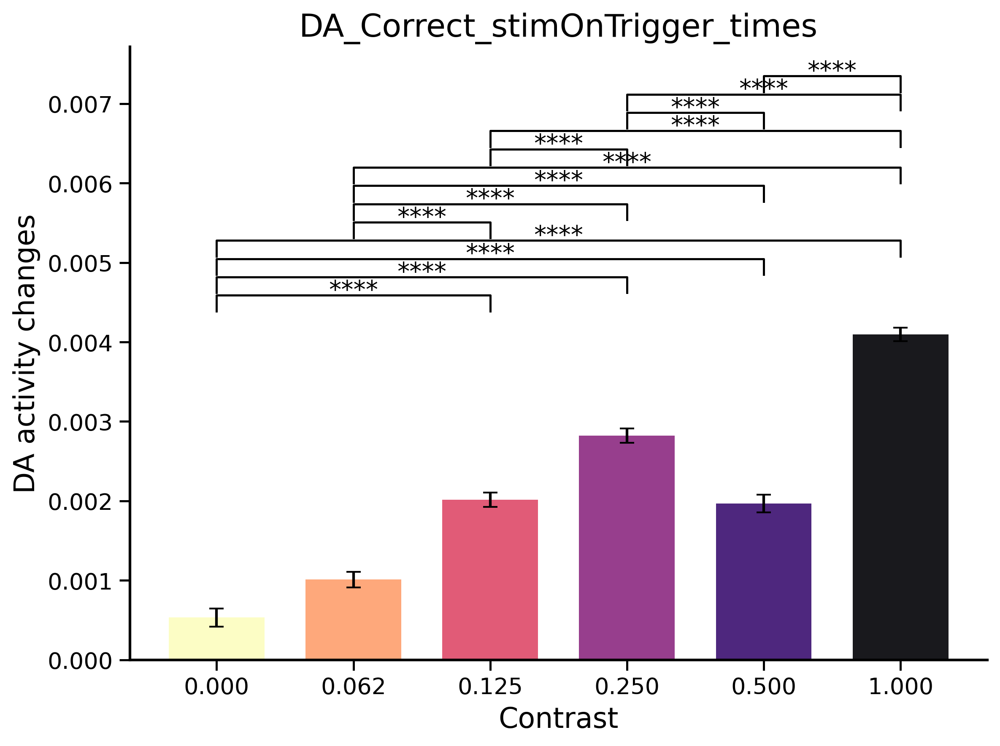

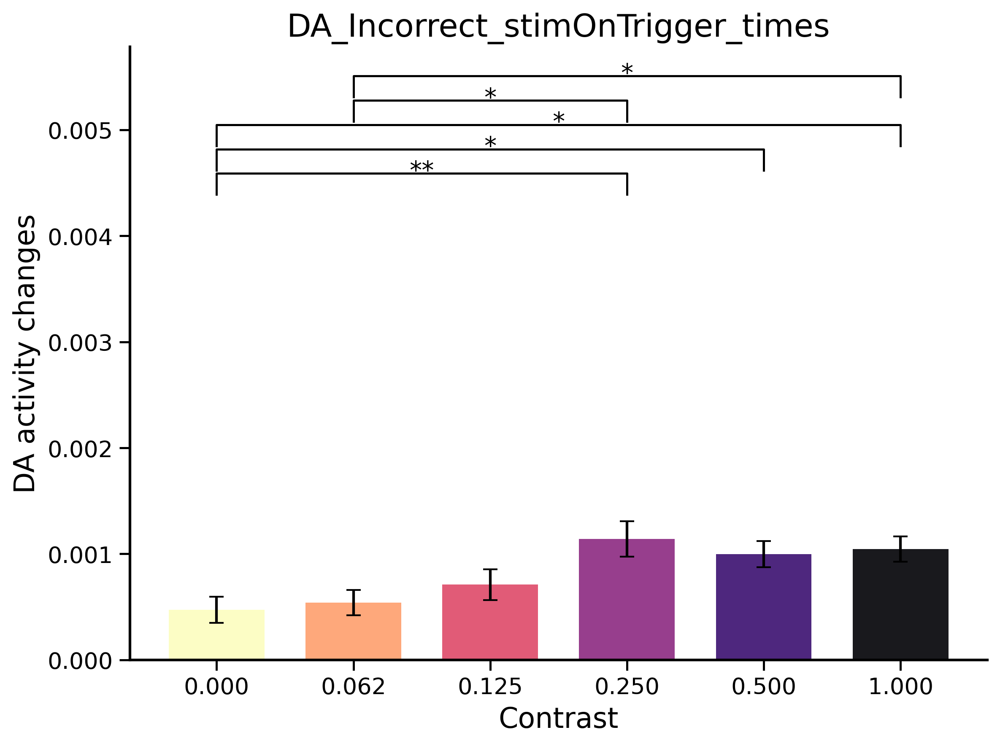

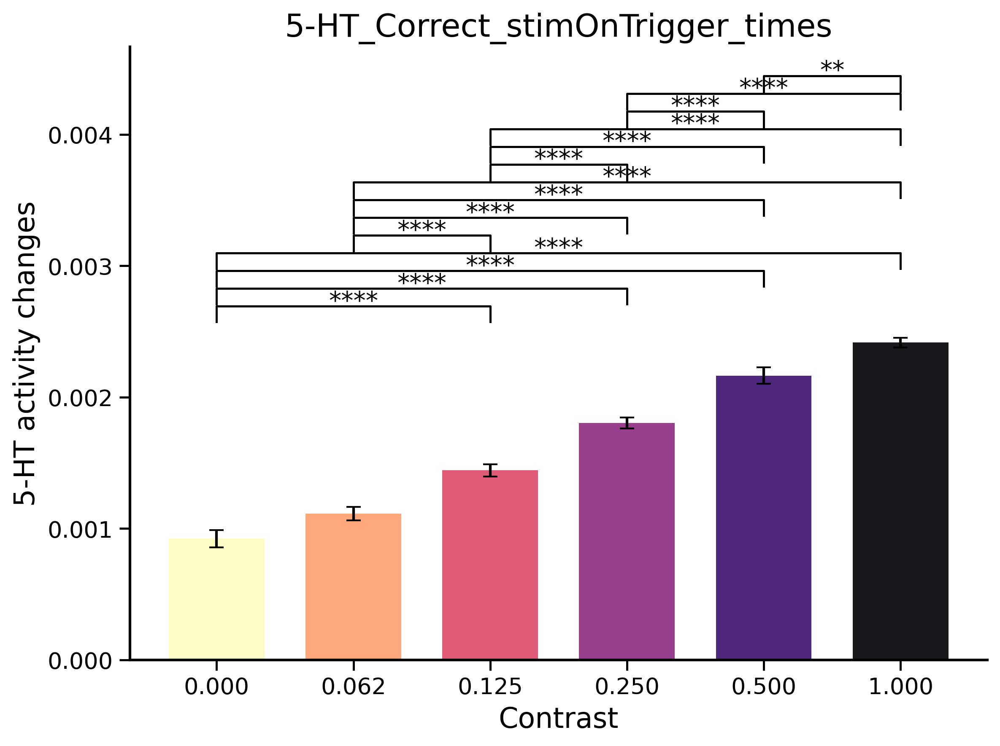

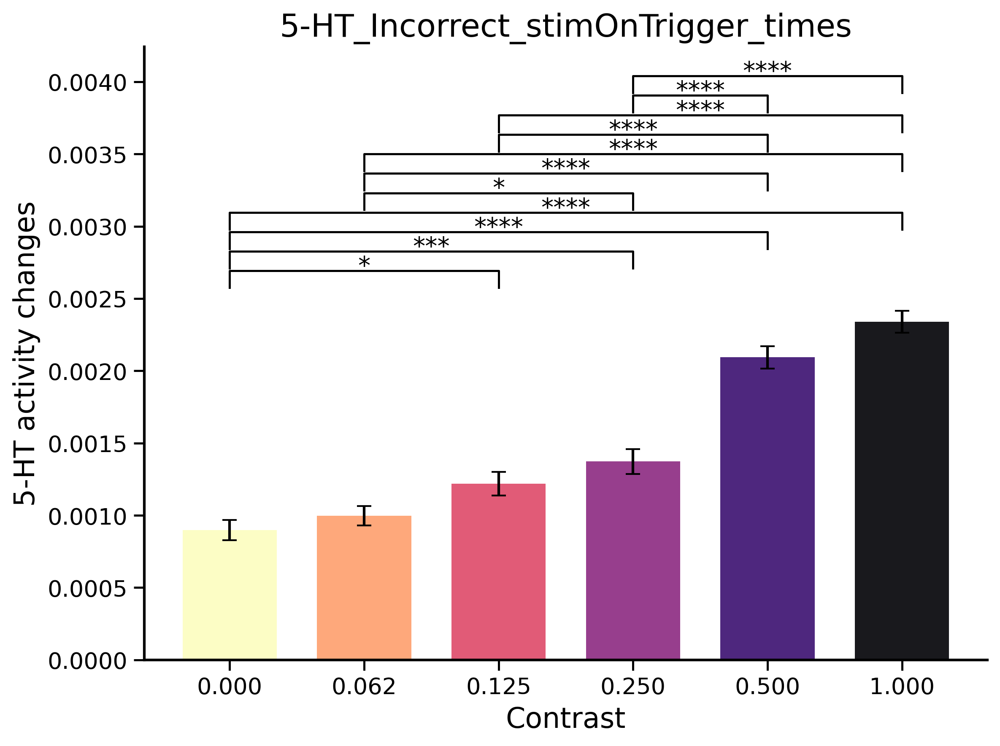

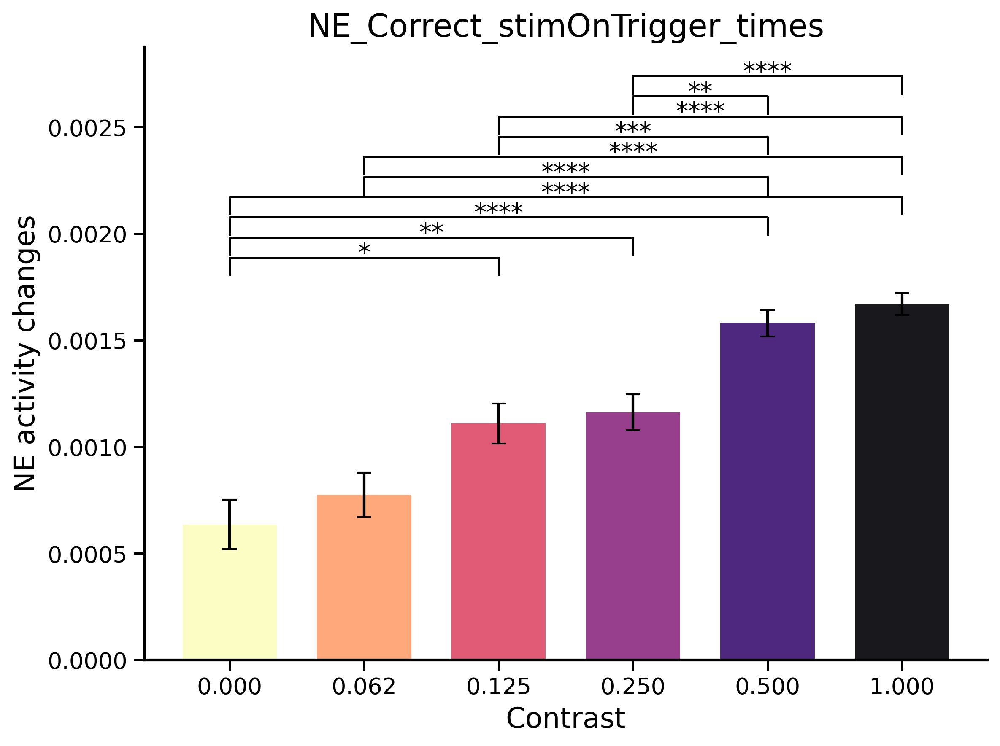

...

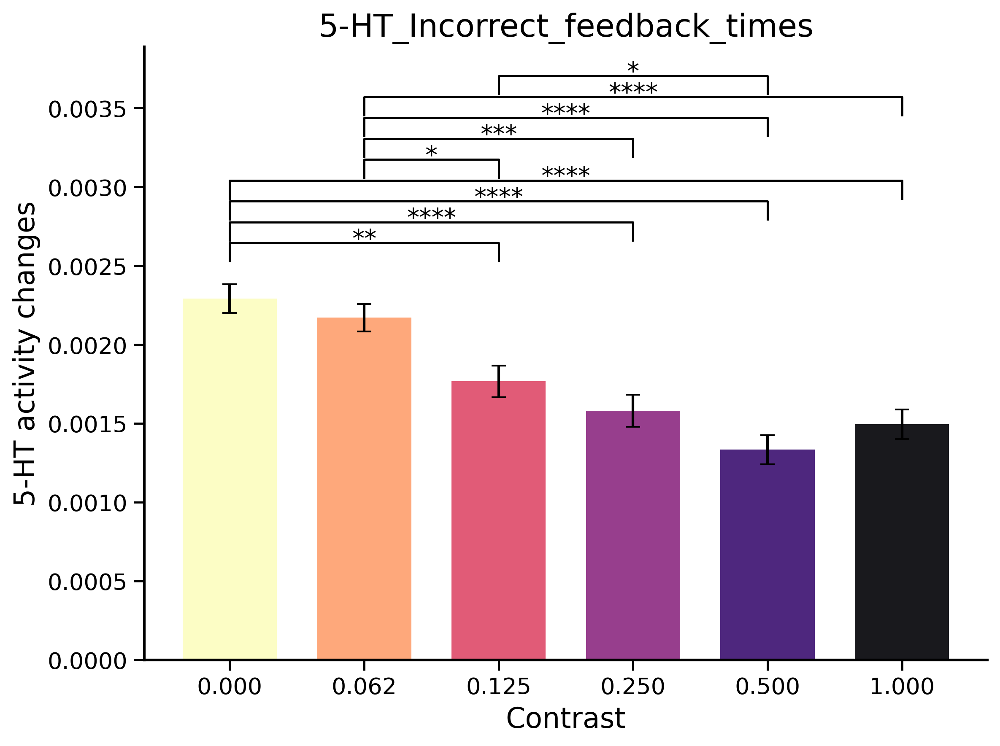

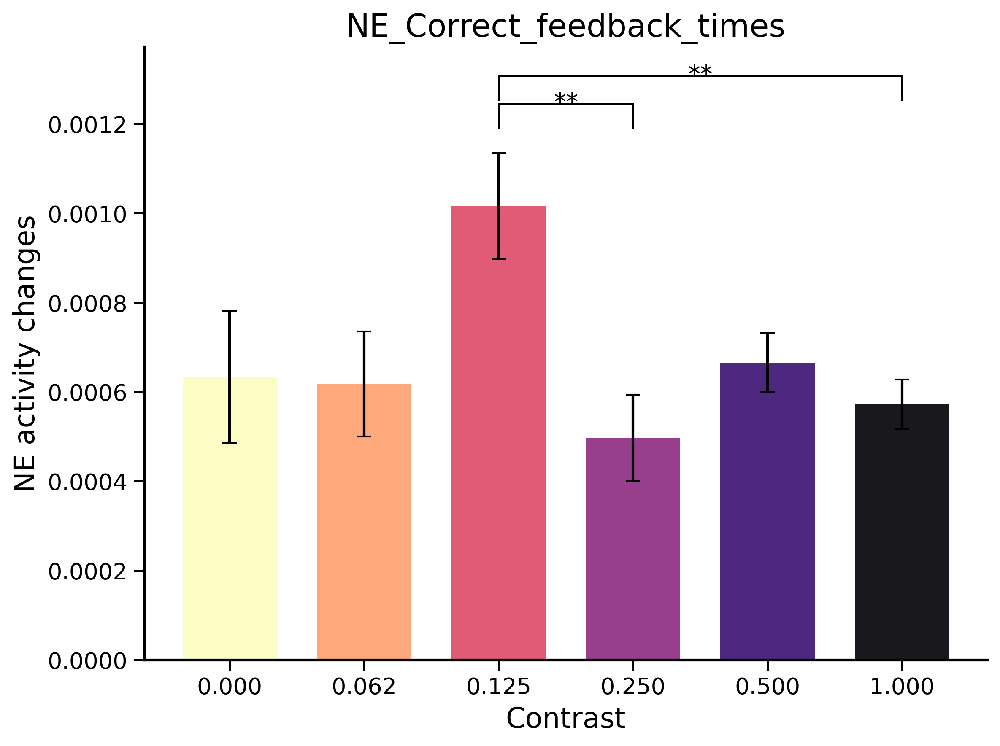

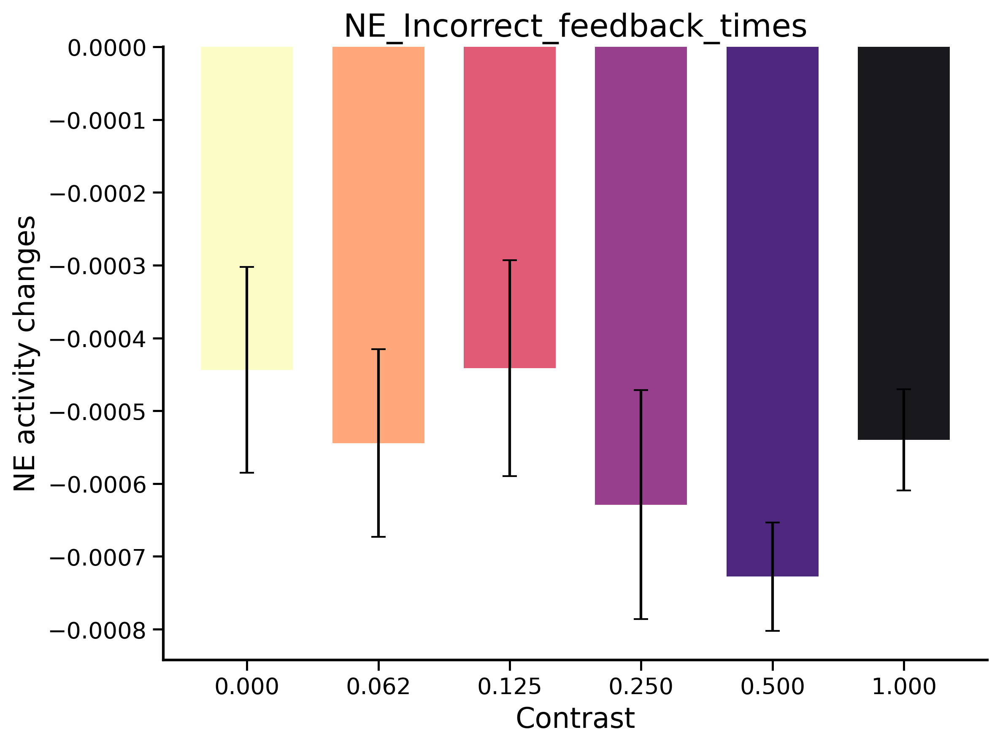

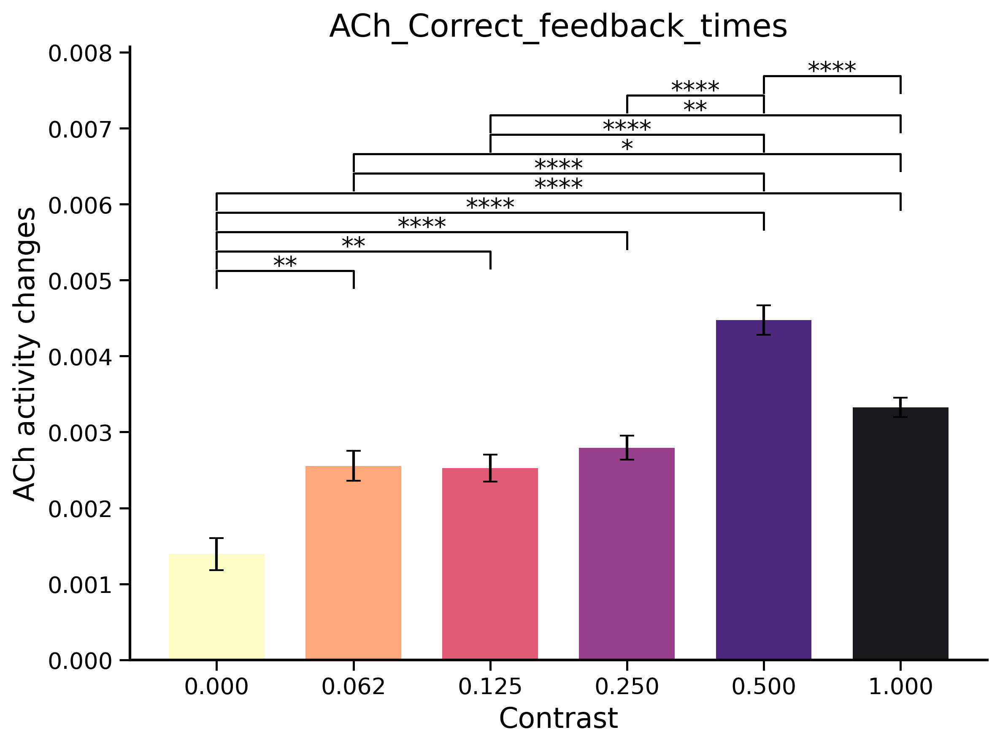

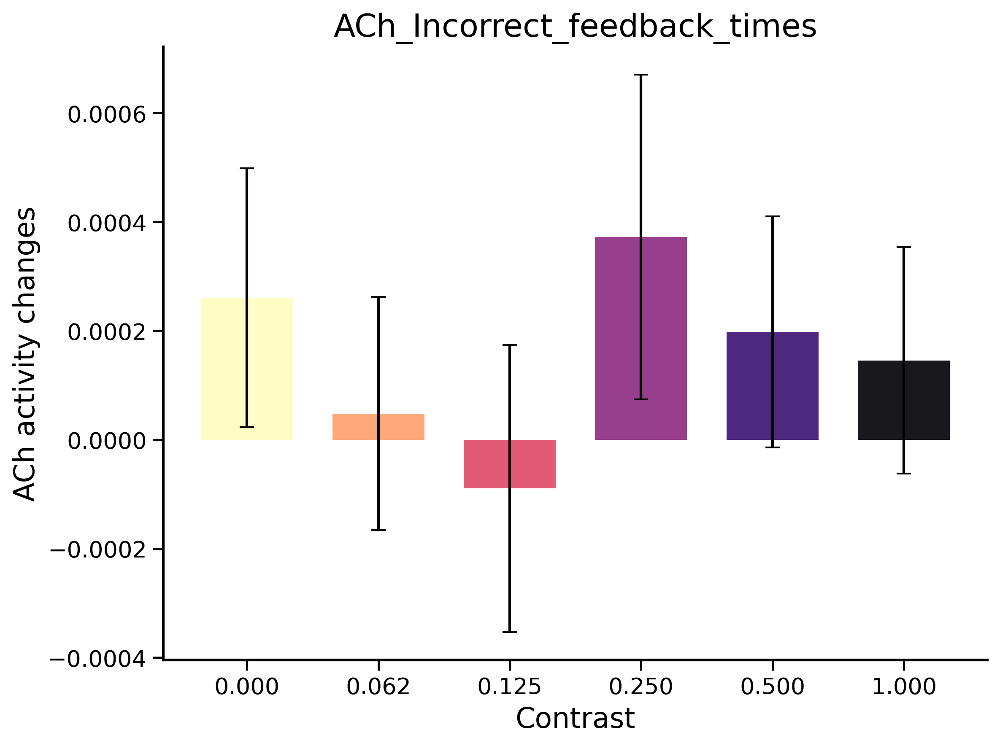

In [48]:
""" ALL THE CODE FOR THE CONTRASTS """

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from pingouin import pairwise_tukey
import pingouin as pg

import os
import matplotlib.patches as mpatches
import seaborn as sns

# path_to_data = '/mnt/h0/kb/Feb2025/data_behav_psth/Good_sessions/'
path_to_data = '/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions'
EVENTS = ['feedback_times']


#===========================================================================
def pad_to_match_length(arr, target_length):
    """Pad or trim an array to match the target length along the time axis."""
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    """Load and pad/interpolate psth and df_trials for a group of mice to a common length."""
    combined_psth = []
    combined_trials = []
    target_rate = 30
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')
            
            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                psth = interpolate_to_common_time(psth, current_rate=15, target_rate=30, PERIEVENT_WINDOW=PERIEVENT_WINDOW)
                df_trials = pd.read_parquet(df_trials_path_15)
            else:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)
        
        except Exception as e:
            print(f"Error loading data for {mouse} | Event: {event}: {e}")
    
    if combined_psth and combined_trials:
        # Pad all PSTH arrays to match the longest one
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        return None, None

# ============================
# Helper: Stars from p-values
# ============================
def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# ============================
# Helper: Plot barplot + stars
# ============================
def plot_with_significance(pairs, title, filename, contrast_labels, means, sems, colors, group_name, ylim_max=None):
    x = np.arange(len(contrast_labels))
    bar_width = 0.7

    fig, ax = plt.subplots(figsize=(8, 6), dpi=300)
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    y_max = ylim_max if ylim_max is not None else np.max(means + sems)
    y_offset = y_max * 0.05
    current_y = y_max + y_offset

    label_to_x = {label: xi for label, xi in zip(contrast_labels, x)}

    for c1, c2, p_val in pairs:
        i1, i2 = label_to_x[c1], label_to_x[c2]
        x1, x2 = min(i1, i2), max(i1, i2)
        leg_height = y_offset * 0.95 #it was 0.8
        ax.plot([x1, x1, x2, x2], [current_y, current_y + leg_height, current_y + leg_height, current_y], lw=1.2, c='black')
        ax.text((x1 + x2) / 2, current_y + y_offset * 0.5, p_to_stars(p_val), ha='center', va='bottom', fontsize=14)
        current_y += y_offset * 1.1

        

    ax.set_xticks(x)
    ax.set_xticklabels(contrast_labels, fontsize=16)
    ax.set_xlabel("Contrast", fontsize=16)
    ax.set_ylabel(f"{group_name} activity changes", fontsize=16)
    ax.set_title(title, fontsize=18)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
    ax.grid(False)
    plt.tight_layout()
    """ TO SAVE """
    # fig.savefig(f"/mnt/h0/kb/code_kcenia/stats/{filename}.png", dpi=300, bbox_inches='tight')
    # fig.savefig(f"/mnt/h0/kb/code_kcenia/stats/{filename}.pdf", dpi=300, bbox_inches='tight') 
    fig.savefig(f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/{filename}.png", dpi=300, bbox_inches='tight')
    fig.savefig(f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/{filename}.pdf", dpi=300, bbox_inches='tight')
    plt.show()

# ============================
# Data extraction + normalization
# ============================
def extract_normalized_response(df_trials, psth_data, contrast_list, feedback_code, time_vector, response_idx, baseline_idx, epsilon=1e-6):
    result = []
    for contrast in contrast_list:
        idx = (df_trials['feedbackType'].values == feedback_code) & (df_trials['allContrasts'].values == contrast)
        if np.sum(idx) < 5:
            continue
        # V1 
        # psth_subset = psth_data[idx]
        # baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # aligned = psth_subset - baseline
        # # normalized = aligned / (baseline_std + epsilon) 
        # # normalized = aligned / (np.abs(baseline_std)) #COMMENTED ON 02072025
        # # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # # normalized = aligned / safe_baseline

        # V2
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # normalized = (aligned) / safe_baseline #deltaF_over_F = normalized
        
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # percent_change = (aligned / safe_baseline) * 100
        # response_vals = np.mean(percent_change[:, response_idx], axis=1)

        # V3 
        psth_subset = psth_data[idx]
        baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        aligned = psth_subset - baseline
        # normalized = aligned / (baseline_std + epsilon) 
        # normalized = aligned / (np.abs(baseline_std)) #COMMENTED ON 02072025
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # normalized = aligned / safe_baseline


        normalized = aligned #new 17072025
        # normalized = aligned / (np.abs(baseline)) #std ADDED ON 02072025 only baseline added on 15072025 
        response_vals = np.mean(normalized[:, response_idx], axis=1) #commented on 15072025
        for v in response_vals:
            result.append({'value': v, 'contrast': contrast, 'feedbackType': 'Correct' if feedback_code == 1 else 'Incorrect'})
    return pd.DataFrame(result)

# ============================
# Main analysis loop
# ============================
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    # "VTA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R"],
    # "SNc": ["ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "DR": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "MR": ["ZFM-03062"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    # "LC_L": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06171", "ZFM-06275_L"],
    # "LC_R": ["ZFM-06272_R", "ZFM-06275_R"],
    # "ACh": ["ZFM-06305_L", "ZFM-06305_R", "ZFM-06948"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
    # "SI_R": ["ZFM-06305_R"]
}


time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
cmap = get_cmap('magma_r')

events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

ymax_dict = {}  # To store max y-limits per (event, group_name)

for event in events:
    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        if psth_combined.shape[0] == 91:
            psth_combined = psth_combined.T
        unique_contrasts = np.sort(np.unique(df_trials_combined['allContrasts'].values))
        colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

        for fb_label, fb_code in feedback_types.items():
            df_plot = extract_normalized_response(df_trials_combined, psth_combined, unique_contrasts,
                                                  feedback_code=fb_code,
                                                  time_vector=time_vector,
                                                  response_idx=response_idx,
                                                  baseline_idx=baseline_idx)
            aov = pg.anova(data=df_plot, dv='value', between='contrast', detailed=True)
            posthoc = pg.pairwise_tukey(data=df_plot, dv='value', between='contrast')

            contrast_labels = [f"{c:.3f}" for c in unique_contrasts]
            means = df_plot.groupby('contrast')['value'].mean().reindex(unique_contrasts).values
            sems = df_plot.groupby('contrast')['value'].sem().reindex(unique_contrasts).values

            # Track the max y value for consistent ylim across Correct/Incorrect
            ymax = np.max(means + sems)
            key = (event, group_name)
            if key in ymax_dict:
                ymax_dict[key] = max(ymax_dict[key], ymax)
            else:
                ymax_dict[key] = ymax


            significant_pairs_all = [
                (f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey'])
                for _, row in posthoc.iterrows() if row['p-tukey'] < 0.05
            ]

            filename = f"barplot_18072025_just aligned_{group_name}_{event}_{fb_label}".replace(" ", "_")
            plot_with_significance(significant_pairs_all,
                                title=f"{group_name}_{fb_label}_{event}",
                                filename=filename,
                                contrast_labels=contrast_labels,
                                means=means,
                                sems=sems,
                                colors=colors,
                                group_name=group_name,
                                ylim_max=ymax_dict[(event, group_name)])


In [50]:
pip install pymupdf


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [52]:
import fitz  # PyMuPDF
import os

def join_vector_panels(figure_names, output_path, title_left, title_right):
    figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/'
    page_width, page_height = 595, 842  # A4 in points (72dpi)

    # Each subfigure slot
    num_rows, num_cols = 4, 2
    margin = 20
    cell_width = (page_width - 3 * margin) // 2
    cell_height = (page_height - 5 * margin) // 4

    # Create new blank PDF
    doc = fitz.open()

    page = doc.new_page(width=page_width, height=page_height)

    # Add titles
    title_fontsize = 12
    text_width_left = fitz.get_text_length(title_left, fontname="helv", fontsize=title_fontsize)
    text_width_right = fitz.get_text_length(title_right, fontname="helv", fontsize=title_fontsize)

    page.insert_text(((page_width * 0.25) - text_width_left / 2, margin / 2),
                    title_left, fontsize=title_fontsize, fontname="helv")

    page.insert_text(((page_width * 0.75) - text_width_right / 2, margin / 2),
                    title_right, fontsize=title_fontsize, fontname="helv")


    for i, fname in enumerate(figure_names):
        x_idx = i % 2
        y_idx = i // 2

        x0 = margin + x_idx * (cell_width + margin)
        y0 = margin + (y_idx * (cell_height + margin)) + 30  # leave space for top title
        rect = fitz.Rect(x0, y0, x0 + cell_width, y0 + cell_height)

        fig_path = os.path.join(figure_path, fname)
        fig_pdf = fitz.open(fig_path)
        page.show_pdf_page(rect, fig_pdf, 0)  # insert page 0 of each figure
        fig_pdf.close()

    doc.save(output_path)
    doc.close()

stim_figures = [
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Incorrect.pdf',
]

join_vector_panels(
    figure_names=stim_figures,
    output_path='/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Panel_StimOn_Vectorized.pdf',
    title_left='Future correct trials',
    title_right='Future incorrect trials'
)

feedback_figures = [
    'barplot_18072025_just_aligned_DA_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_feedback_times_Incorrect.pdf',
]

join_vector_panels(
    figure_names=feedback_figures,
    output_path='/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Panel_Feedback_Vectorized.pdf',
    title_left='Previous correct trials',
    title_right='Previous incorrect trials'
)


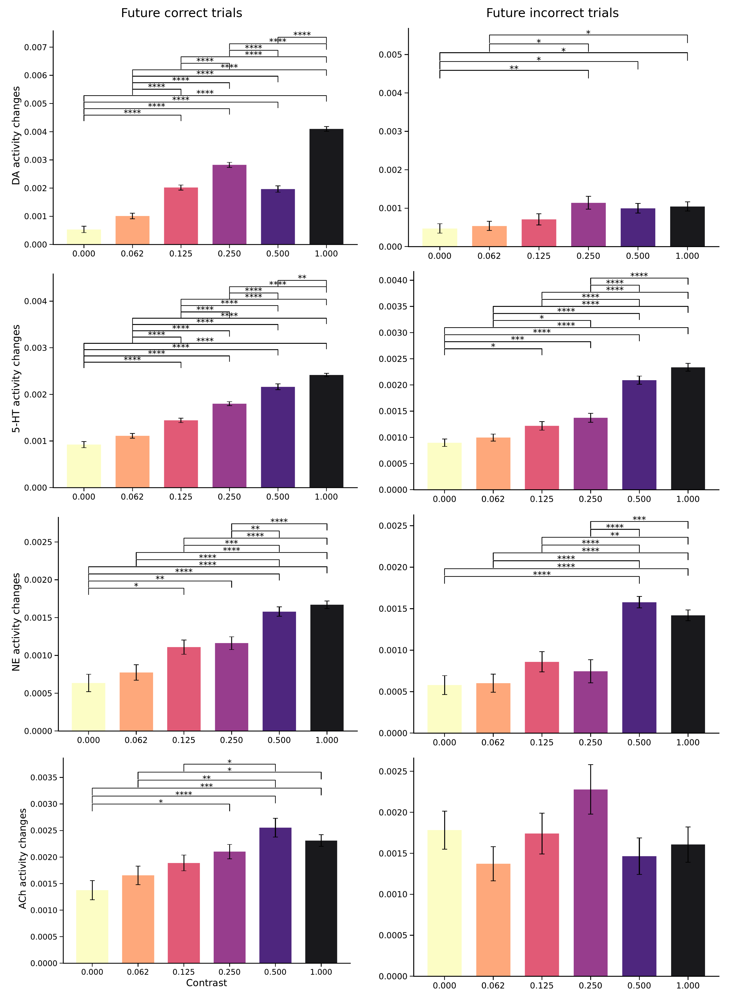

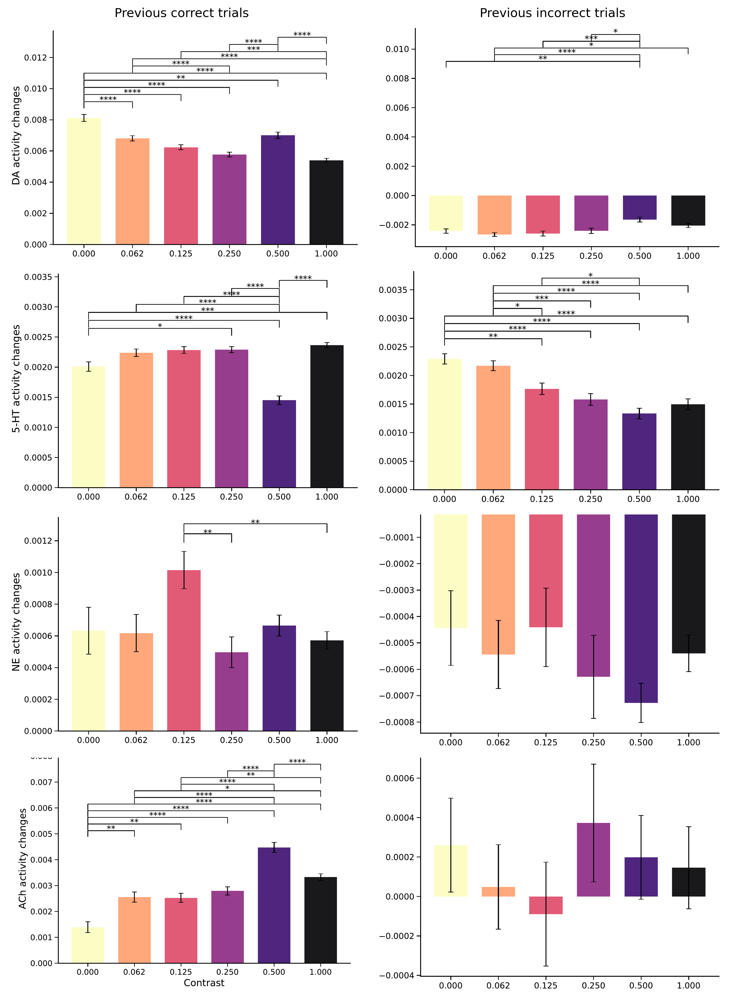

In [ ]:
""" join just to pick the stars """
""" new 18072025 """

import matplotlib.pyplot as plt
from pdf2image import convert_from_path
from PIL import Image
import os

def join_contrast_panels(figure_names, output_path, title_left, title_right):
    figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/'

    fig, axes = plt.subplots(4, 2, figsize=(10, 14), dpi=300)
    axes = axes.flatten()

    crop_top = 90
    crop_bottom = 65
    crop_left = 63

    for i, figure_name in enumerate(figure_names):
        img_path = os.path.join(figure_path, figure_name)
        images = convert_from_path(img_path, first_page=1, last_page=1)
        img = images[0]
        width, height = img.size

        if i % 2 == 1:
            img_cropped = img.crop((crop_left, crop_top, width, height - crop_bottom))
        else:
            if i < 6:
                img_cropped = img.crop((0, crop_top, width, height - crop_bottom))
            else:
                img_cropped = img.crop((0, crop_top, width, height))

        axes[i].imshow(img_cropped)
        axes[i].axis('off')

    fig.subplots_adjust(top=0.92)
    fig.text(0.25, 0.95, title_left, ha='center', fontsize=12)
    fig.text(0.75, 0.95, title_right, ha='center', fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(output_path, format='pdf')
    plt.show()


stim_figures = [
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Incorrect.pdf',
]

join_contrast_panels(
    figure_names=stim_figures,
    output_path='/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Panel_StimOn_Cropped_all_2.pdf',
    title_left='Future correct trials',
    title_right='Future incorrect trials'
)


feedback_figures = [
    'barplot_18072025_just_aligned_DA_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_feedback_times_Incorrect.pdf',
]

join_contrast_panels(
    figure_names=feedback_figures,
    output_path='/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Panel_Feedback_Cropped_all_2.pdf',
    title_left='Previous correct trials',
    title_right='Previous incorrect trials'
)




In [57]:
""" same but with vectors instead of images """
import fitz  # PyMuPDF
import os

def join_contrast_panels(figure_names, output_path, title_left, title_right):
    figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/'
    page_width, page_height = 595, 842  # A4 size in points (approx 72 dpi)

    num_rows, num_cols = 4, 2
    margin = 20
    title_height = 30
    cell_width = (page_width - (num_cols + 1) * margin) // num_cols
    cell_height = (page_height - (num_rows + 1) * margin - title_height) // num_rows

    doc = fitz.open()
    page = doc.new_page(width=page_width, height=page_height)

    # Insert titles (manual centering)
    title_fontsize = 12
    text_width_left = fitz.get_text_length(title_left, fontname="helv", fontsize=title_fontsize)
    text_width_right = fitz.get_text_length(title_right, fontname="helv", fontsize=title_fontsize)

    page.insert_text(
        ((page_width * 0.25) - text_width_left / 2, margin / 2),
        title_left, fontsize=title_fontsize, fontname="helv"
    )
    page.insert_text(
        ((page_width * 0.75) - text_width_right / 2, margin / 2),
        title_right, fontsize=title_fontsize, fontname="helv"
    )

    for i, fname in enumerate(figure_names):
        row = i // num_cols
        col = i % num_cols

        x0 = margin + col * (cell_width + margin)
        y0 = margin + title_height + row * (cell_height + margin)
        rect = fitz.Rect(x0, y0, x0 + cell_width, y0 + cell_height)

        fig_path = os.path.join(figure_path, fname)
        subdoc = fitz.open(fig_path)
        page.show_pdf_page(rect, subdoc, 0)
        subdoc.close()

    doc.save(output_path)
    doc.close()


stim_figures = [
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Incorrect.pdf',
]


feedback_figures = [
    'barplot_18072025_just_aligned_DA_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_feedback_times_Incorrect.pdf',
]


join_contrast_panels(
    figure_names=stim_figures,
    output_path='/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Panel_StimOn_Cropped_all_2.pdf',
    title_left='Future correct trials',
    title_right='Future incorrect trials'
)

join_contrast_panels(
    figure_names=feedback_figures,
    output_path='/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Panel_Feedback_Cropped_all_2.pdf',
    title_left='Previous correct trials',
    title_right='Previous incorrect trials'
)


2

<ipython-input-55-b3dcae23050a>:193: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


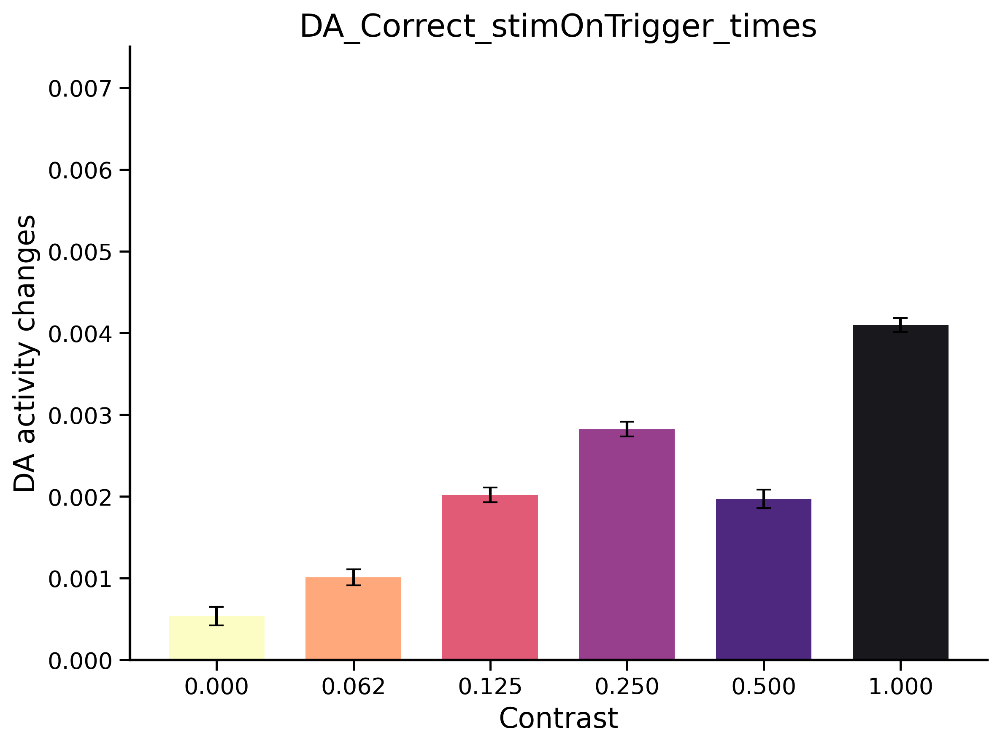

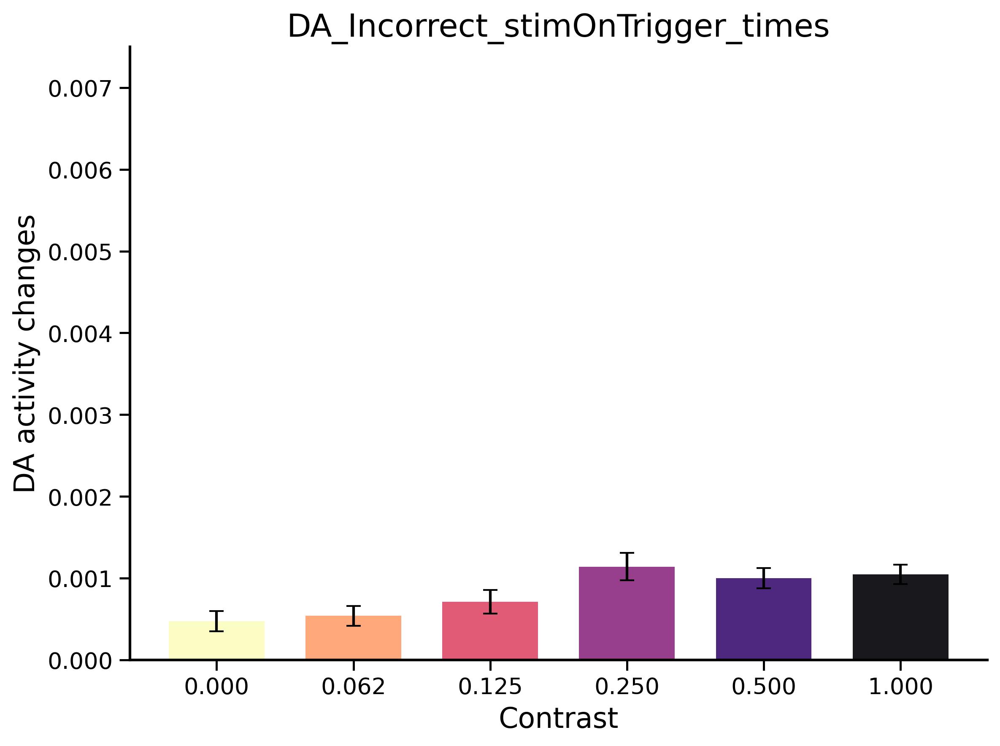

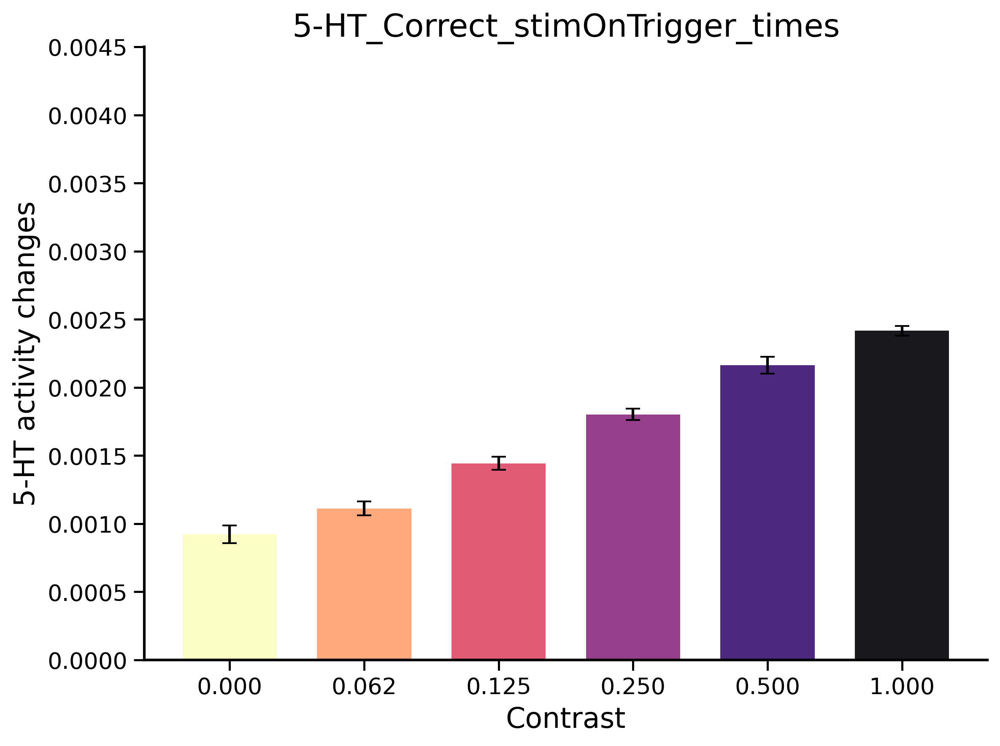

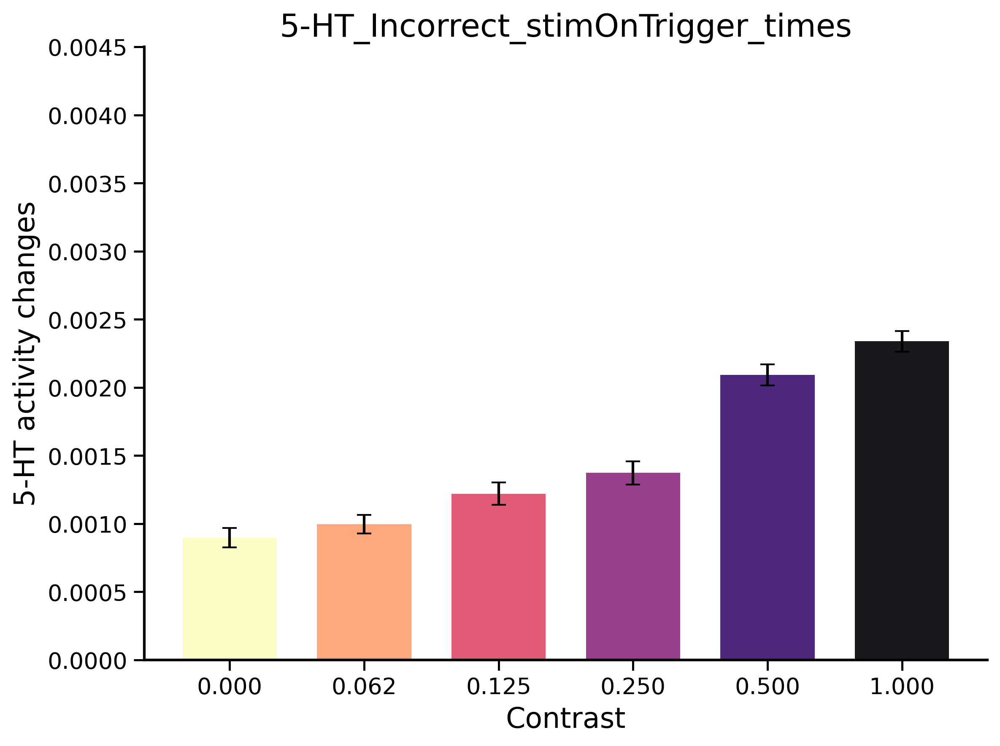

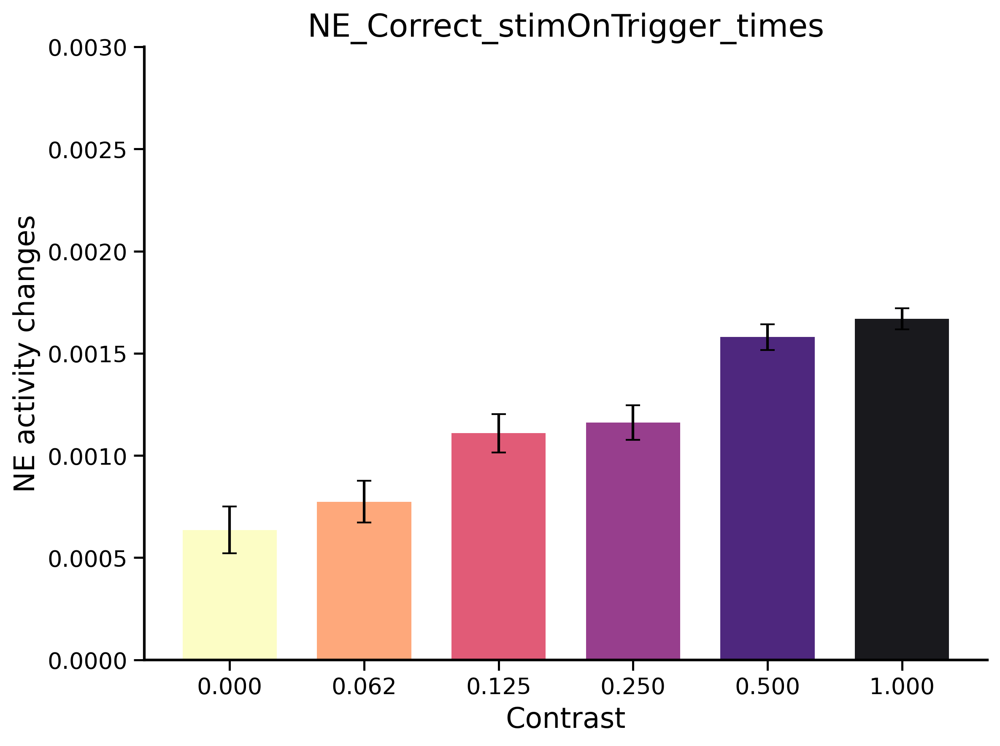

...

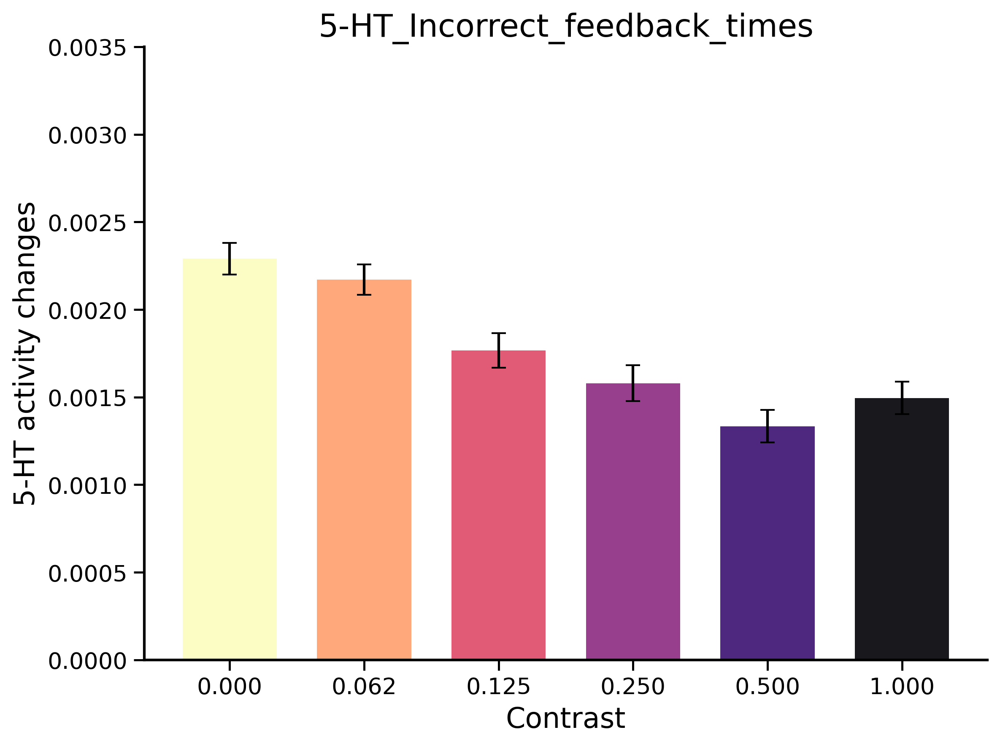

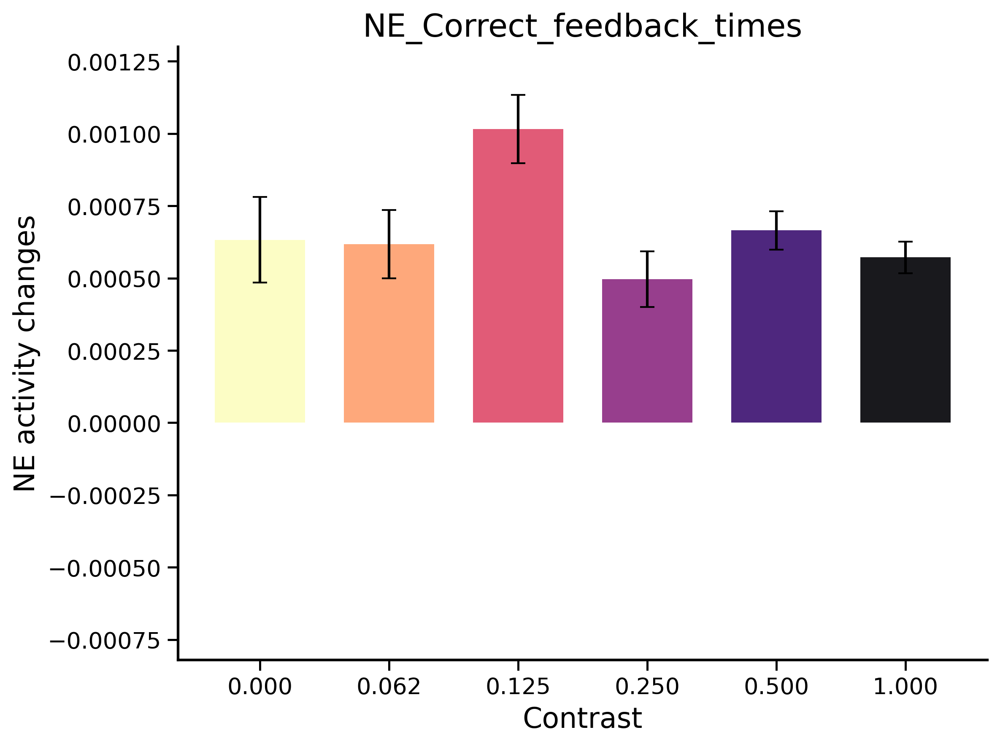

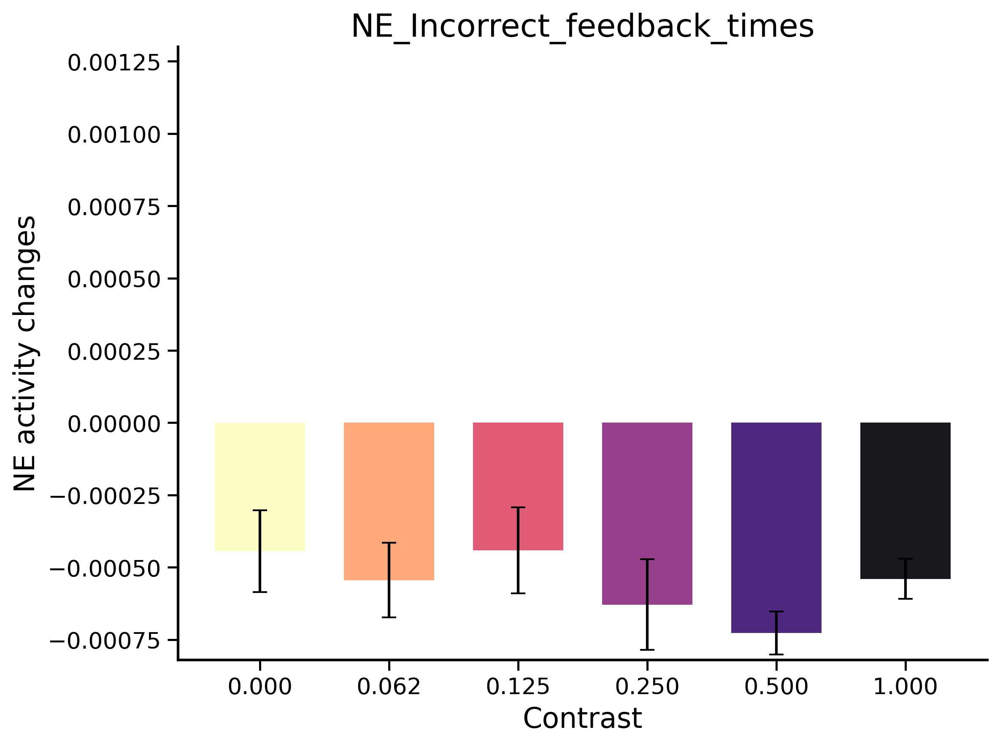

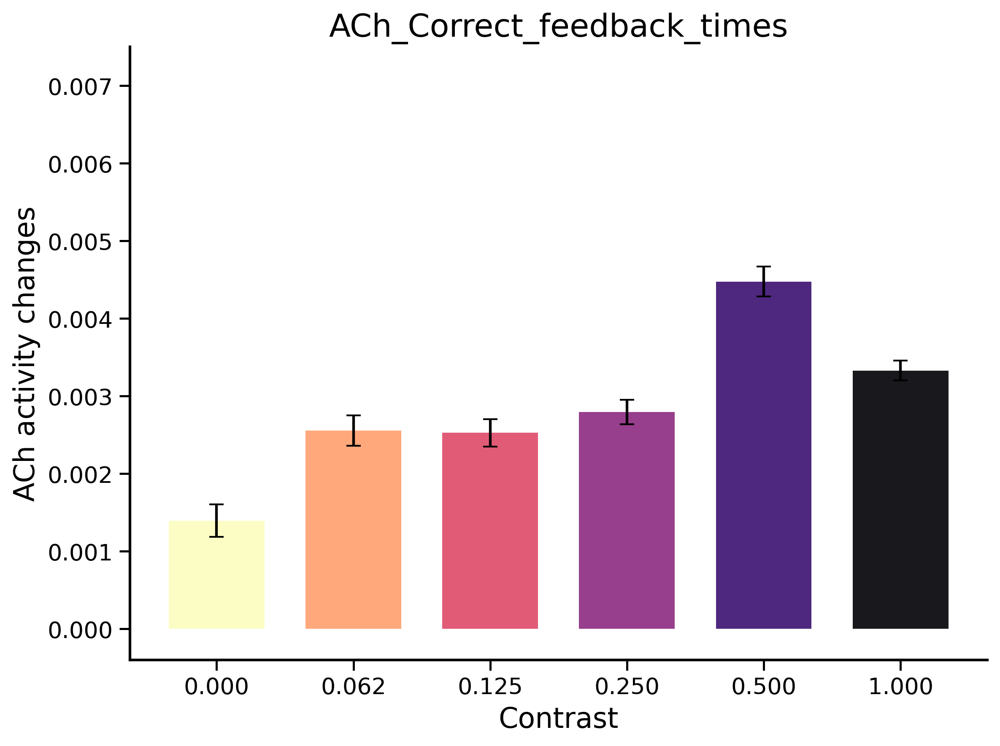

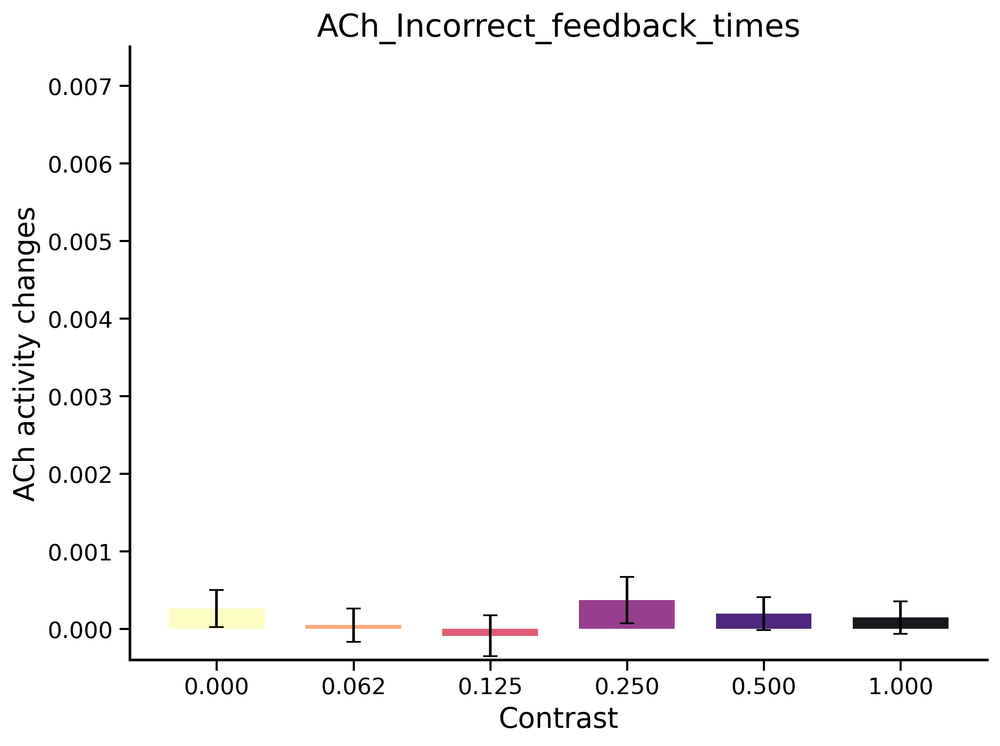

In [55]:
""" USED FOR THE FINAL VERSION, NO STARS, TO BE ADDED LATER """
""" ALL THE CODE FOR THE CONTRASTS """

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from pingouin import pairwise_tukey
import pingouin as pg

import os
import matplotlib.patches as mpatches
import seaborn as sns

# path_to_data = '/mnt/h0/kb/Feb2025/data_behav_psth/Good_sessions/'
path_to_data = '/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions'
EVENTS = ['feedback_times']


#===========================================================================
def pad_to_match_length(arr, target_length):
    """Pad or trim an array to match the target length along the time axis."""
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    """Load and pad/interpolate psth and df_trials for a group of mice to a common length."""
    combined_psth = []
    combined_trials = []
    target_rate = 30
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')
            
            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                psth = interpolate_to_common_time(psth, current_rate=15, target_rate=30, PERIEVENT_WINDOW=PERIEVENT_WINDOW)
                df_trials = pd.read_parquet(df_trials_path_15)
            else:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)
        
        except Exception as e:
            print(f"Error loading data for {mouse} | Event: {event}: {e}")
    
    if combined_psth and combined_trials:
        # Pad all PSTH arrays to match the longest one
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        return None, None

# ============================
# Helper: Stars from p-values
# ============================
def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# ============================
# Helper: Plot barplot + stars
# ============================
def plot_with_significance(pairs, title, filename, contrast_labels, means, sems, colors, group_name, ylim_tuple=None):
    x = np.arange(len(contrast_labels))
    bar_width = 0.7

    fig, ax = plt.subplots(figsize=(8, 6), dpi=300)
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    # Set custom ylim if provided
    if ylim_tuple is not None:
        ax.set_ylim(ylim_tuple)
    else:
        y_max = np.max(means + sems)
        ax.set_ylim([0, y_max * 1.2])  # fallback to default

    ax.set_xticks(x)
    ax.set_xticklabels(contrast_labels, fontsize=16)
    ax.set_xlabel("Contrast", fontsize=16)
    ax.set_ylabel(f"{group_name} activity changes", fontsize=16)
    ax.set_title(title, fontsize=18)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
    ax.grid(False)
    plt.tight_layout()

    fig.savefig(f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/{filename}.png", dpi=300, bbox_inches='tight')
    fig.savefig(f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/{filename}.pdf", dpi=300, bbox_inches='tight')
    plt.show()


# ============================
# Data extraction + normalization
# ============================
def extract_normalized_response(df_trials, psth_data, contrast_list, feedback_code, time_vector, response_idx, baseline_idx, epsilon=1e-6):
    result = []
    for contrast in contrast_list:
        idx = (df_trials['feedbackType'].values == feedback_code) & (df_trials['allContrasts'].values == contrast)
        if np.sum(idx) < 5:
            continue
        # V1 
        # psth_subset = psth_data[idx]
        # baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # aligned = psth_subset - baseline
        # # normalized = aligned / (baseline_std + epsilon) 
        # # normalized = aligned / (np.abs(baseline_std)) #COMMENTED ON 02072025
        # # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # # normalized = aligned / safe_baseline

        # V2
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # normalized = (aligned) / safe_baseline #deltaF_over_F = normalized
        
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # percent_change = (aligned / safe_baseline) * 100
        # response_vals = np.mean(percent_change[:, response_idx], axis=1)

        # V3 
        psth_subset = psth_data[idx]
        baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        aligned = psth_subset - baseline
        # normalized = aligned / (baseline_std + epsilon) 
        # normalized = aligned / (np.abs(baseline_std)) #COMMENTED ON 02072025
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # normalized = aligned / safe_baseline


        normalized = aligned #new 17072025
        # normalized = aligned / (np.abs(baseline)) #std ADDED ON 02072025 only baseline added on 15072025 
        response_vals = np.mean(normalized[:, response_idx], axis=1) #commented on 15072025
        for v in response_vals:
            result.append({'value': v, 'contrast': contrast, 'feedbackType': 'Correct' if feedback_code == 1 else 'Incorrect'})
    return pd.DataFrame(result)

# ============================
# Main analysis loop
# ============================
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    # "VTA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R"],
    # "SNc": ["ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "DR": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "MR": ["ZFM-03062"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    # "LC_L": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06171", "ZFM-06275_L"],
    # "LC_R": ["ZFM-06272_R", "ZFM-06275_R"],
    # "ACh": ["ZFM-06305_L", "ZFM-06305_R", "ZFM-06948"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
    # "SI_R": ["ZFM-06305_R"]
}


time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
cmap = get_cmap('magma_r')

events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

ymax_dict = {}  # To store max y-limits per (event, group_name)

# Custom y-limits for each combination of event, neuromodulator (group), and feedback label
custom_ylim = {
    ('stimOnTrigger_times', 'DA', 'Correct'): (0, 0.0075),
    ('stimOnTrigger_times', 'DA', 'Incorrect'): (0, 0.0075),
    ('stimOnTrigger_times', '5-HT', 'Correct'): (0, 0.0045),
    ('stimOnTrigger_times', '5-HT', 'Incorrect'): (0, 0.0045),
    ('stimOnTrigger_times', 'NE', 'Correct'): (0, 0.003),
    ('stimOnTrigger_times', 'NE', 'Incorrect'): (0, 0.003),
    ('stimOnTrigger_times', 'ACh', 'Correct'): (0, 0.004),
    ('stimOnTrigger_times', 'ACh', 'Incorrect'): (0, 0.004),
    ('feedback_times', 'DA', 'Correct'): (-0.003, 0.011),
    ('feedback_times', 'DA', 'Incorrect'): (-0.003, 0.011),
    ('feedback_times', '5-HT', 'Correct'): (0, 0.0035),
    ('feedback_times', '5-HT', 'Incorrect'): (0, 0.0035),
    ('feedback_times', 'NE', 'Correct'): (-0.00082, 0.0013),
    ('feedback_times', 'NE', 'Incorrect'): (-0.00082, 0.0013),
    ('feedback_times', 'ACh', 'Correct'): (-0.0004, 0.0075),
    ('feedback_times', 'ACh', 'Incorrect'): (-0.0004, 0.0075),
}


for event in events:
    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        if psth_combined.shape[0] == 91:
            psth_combined = psth_combined.T
        unique_contrasts = np.sort(np.unique(df_trials_combined['allContrasts'].values))
        colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

        for fb_label, fb_code in feedback_types.items():
            df_plot = extract_normalized_response(df_trials_combined, psth_combined, unique_contrasts,
                                                  feedback_code=fb_code,
                                                  time_vector=time_vector,
                                                  response_idx=response_idx,
                                                  baseline_idx=baseline_idx)
            aov = pg.anova(data=df_plot, dv='value', between='contrast', detailed=True)
            posthoc = pg.pairwise_tukey(data=df_plot, dv='value', between='contrast')

            contrast_labels = [f"{c:.3f}" for c in unique_contrasts]
            means = df_plot.groupby('contrast')['value'].mean().reindex(unique_contrasts).values
            sems = df_plot.groupby('contrast')['value'].sem().reindex(unique_contrasts).values

            # Track the max y value for consistent ylim across Correct/Incorrect
            ymax = np.max(means + sems)
            key = (event, group_name)
            if key in ymax_dict:
                ymax_dict[key] = max(ymax_dict[key], ymax)
            else:
                ymax_dict[key] = ymax


            significant_pairs_all = [
                (f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey'])
                for _, row in posthoc.iterrows() if row['p-tukey'] < 0.05
            ]

            filename = f"barplot_18072025_just aligned_{group_name}_{event}_{fb_label}".replace(" ", "_")
            ylim_tuple = custom_ylim.get((event, group_name, fb_label), None)

            plot_with_significance(significant_pairs_all,
                                   title=f"{group_name}_{fb_label}_{event}",
                                   filename=filename,
                                   contrast_labels=contrast_labels,
                                   means=means,
                                   sems=sems,
                                   colors=colors,
                                   group_name=group_name,
                                   ylim_tuple=ylim_tuple)

<ipython-input-27-0fec4bf7b391>:271: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


[SKIP] ZFM-03448 — no sessions with only biased blocks


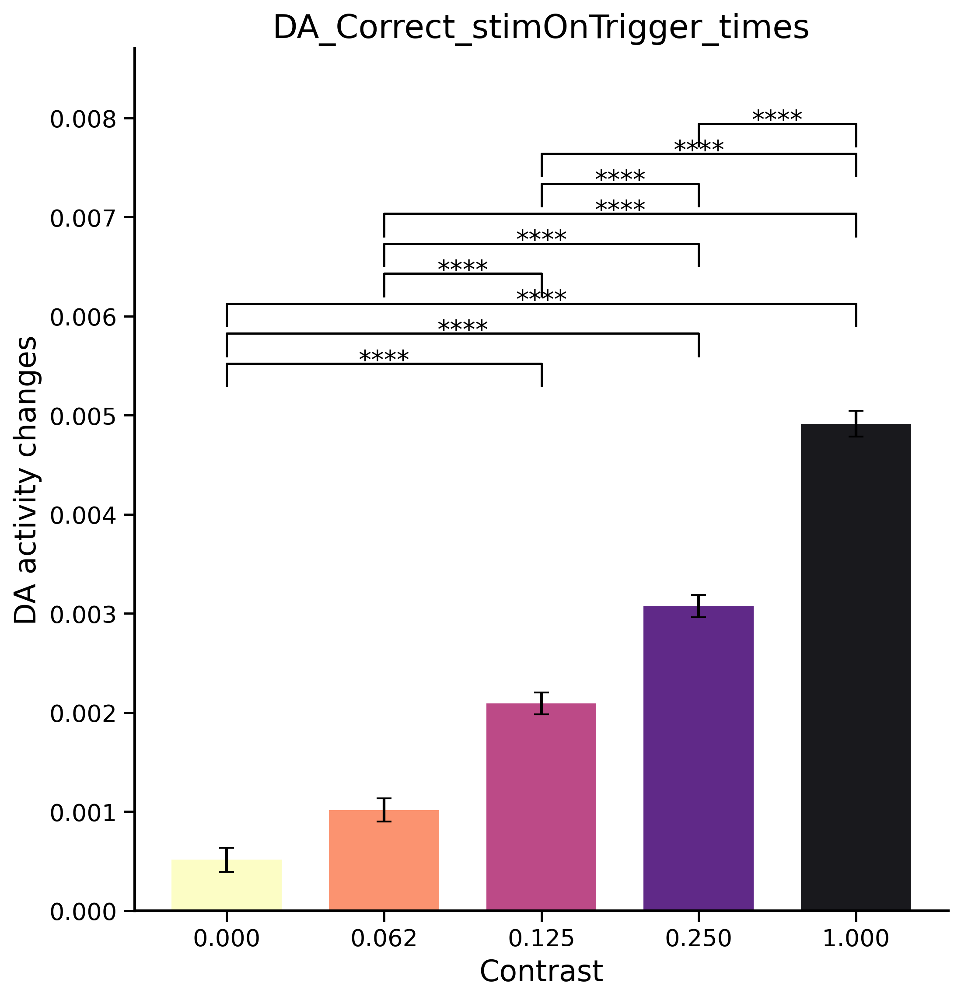

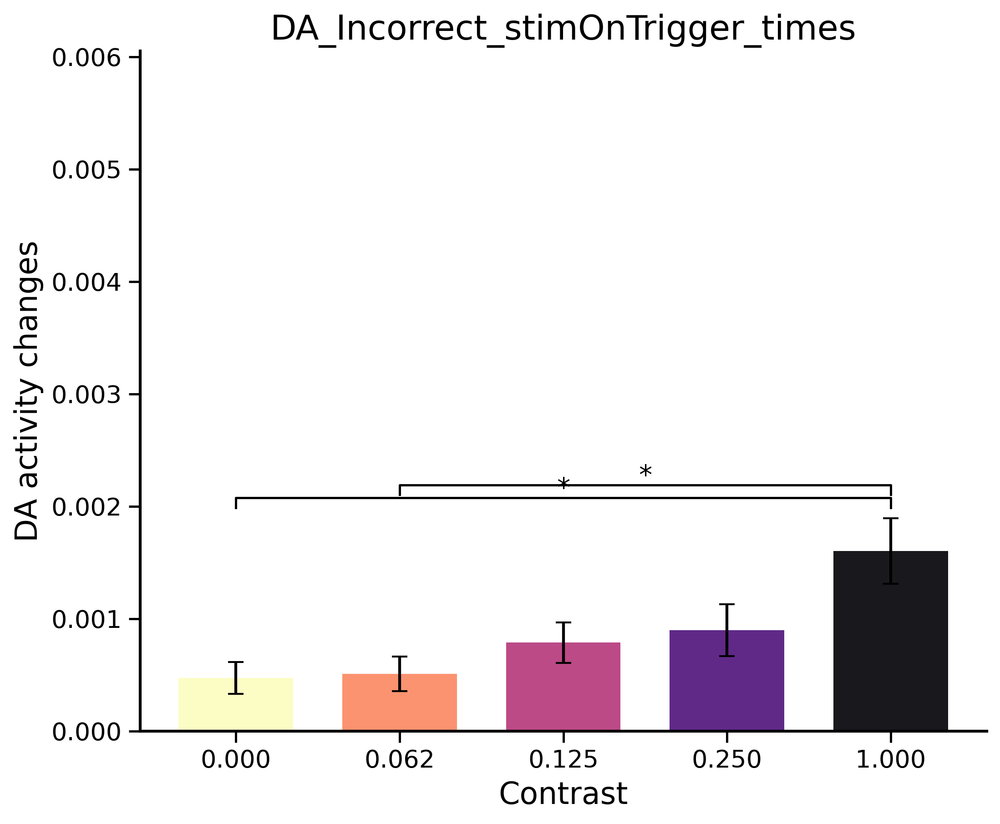

[SKIP] ZFM-03065 — no sessions with only biased blocks


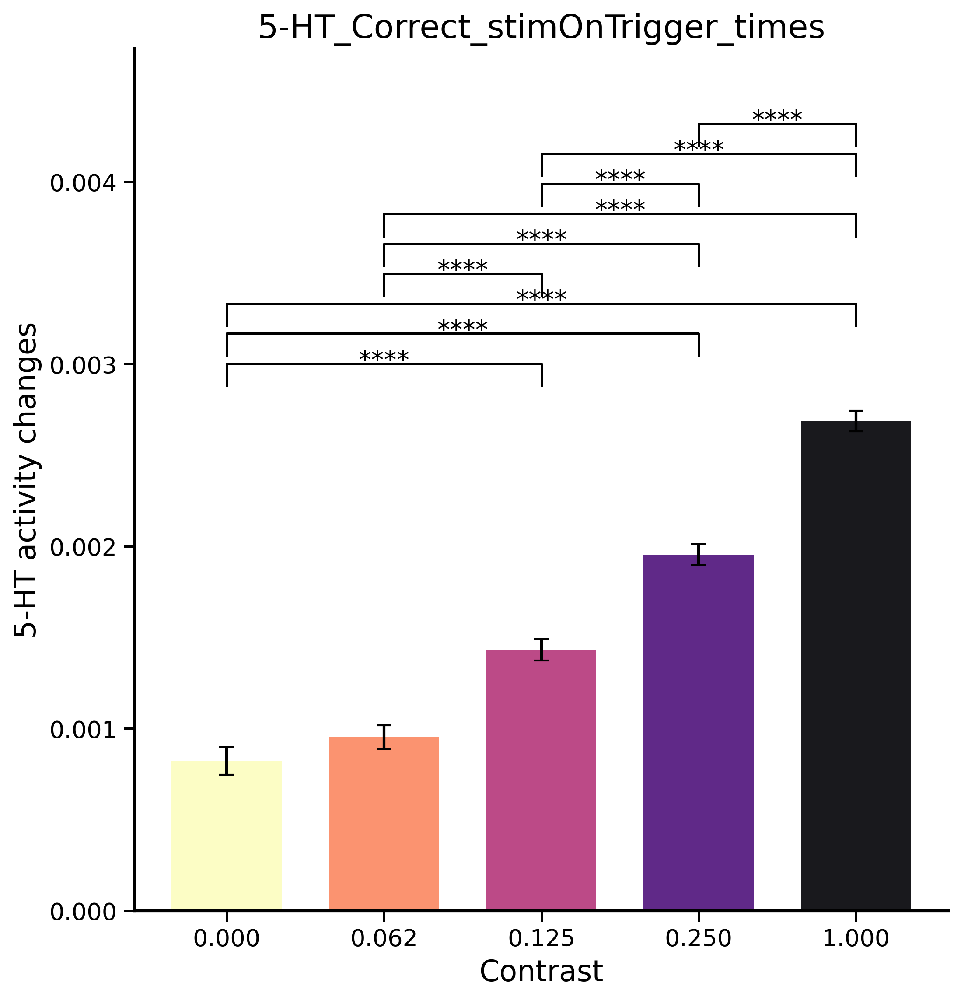

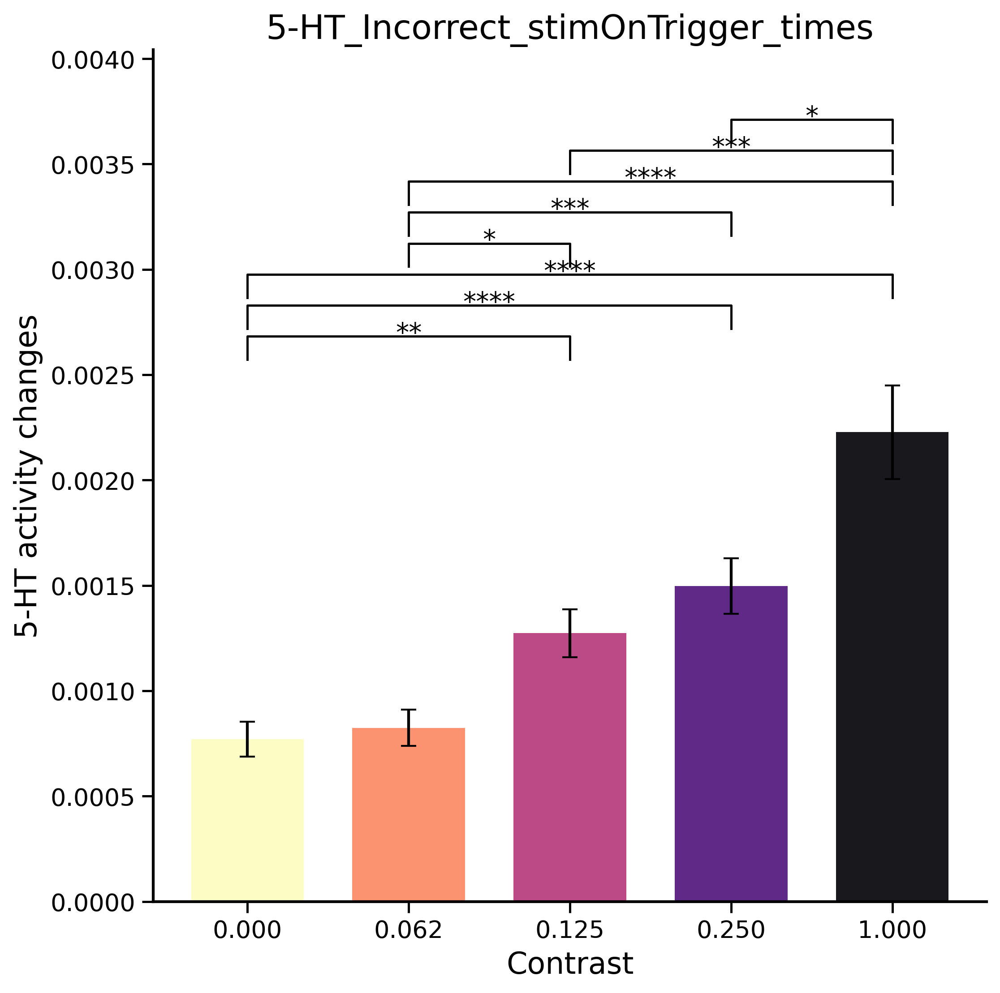

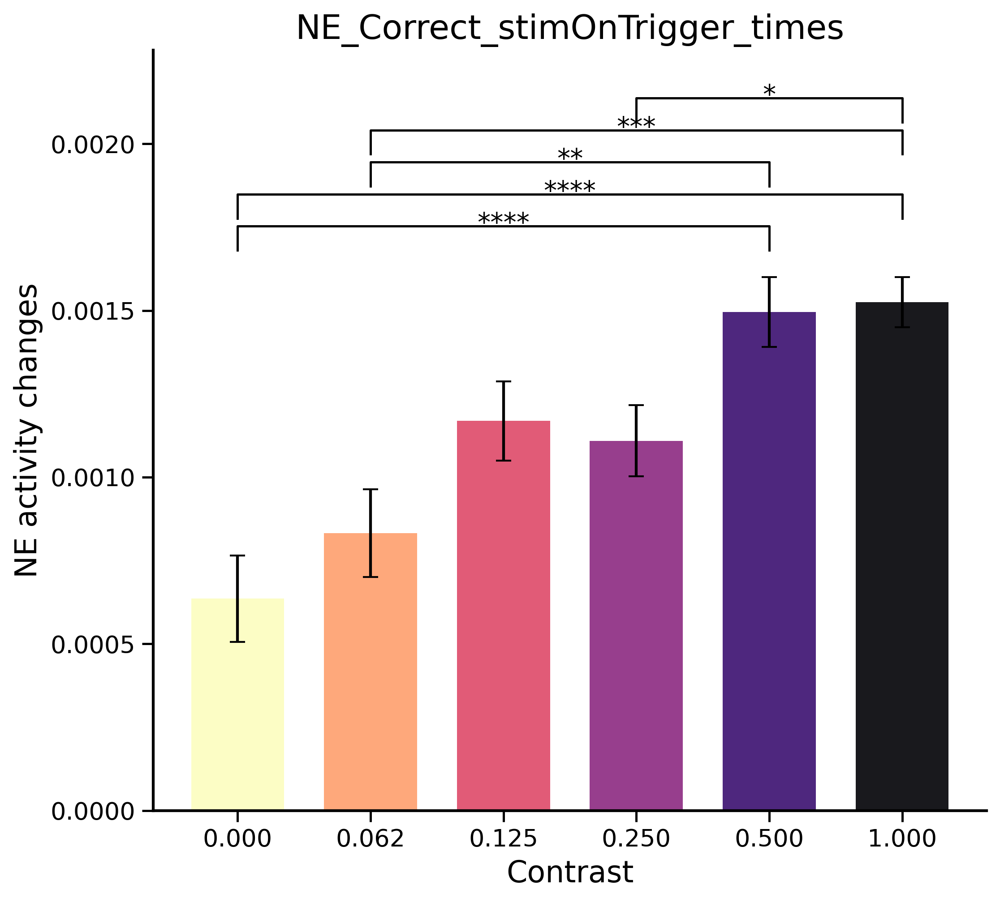

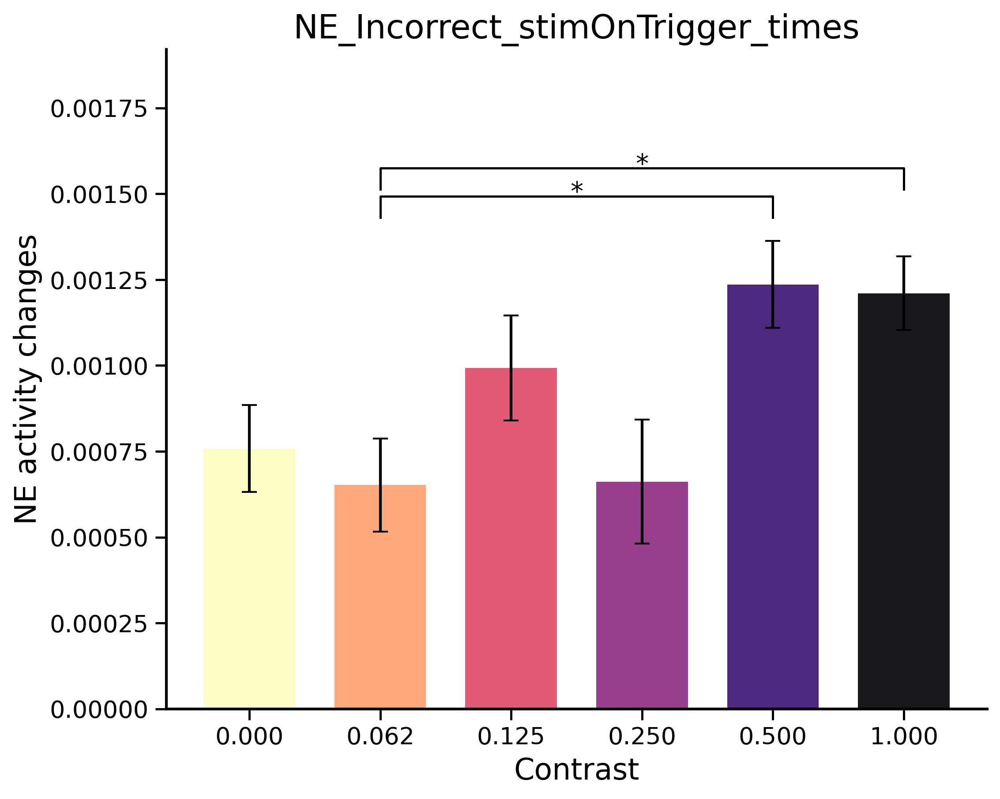

[SKIP] ZFM-06305_L — no sessions with only biased blocks


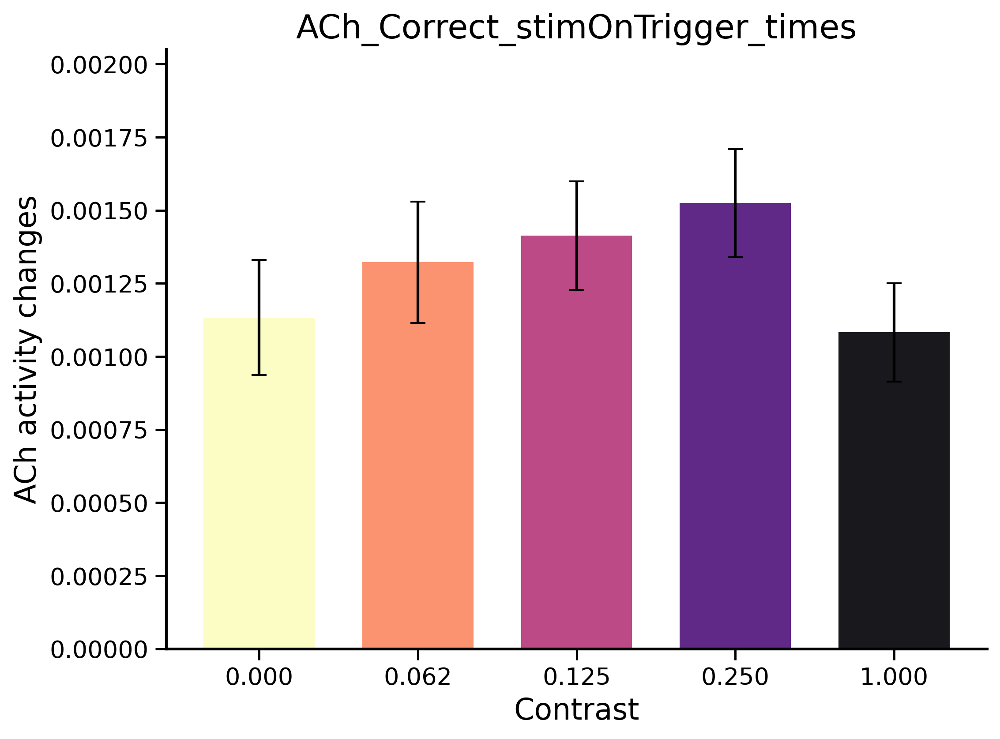

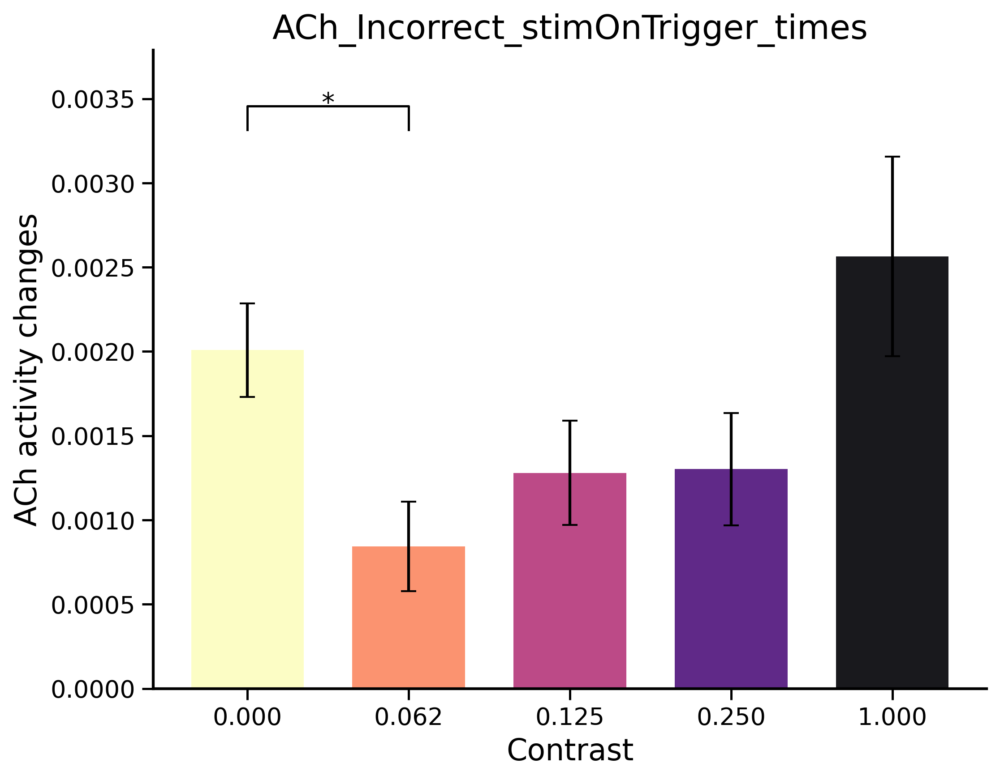

[SKIP] ZFM-03448 — no sessions with only biased blocks


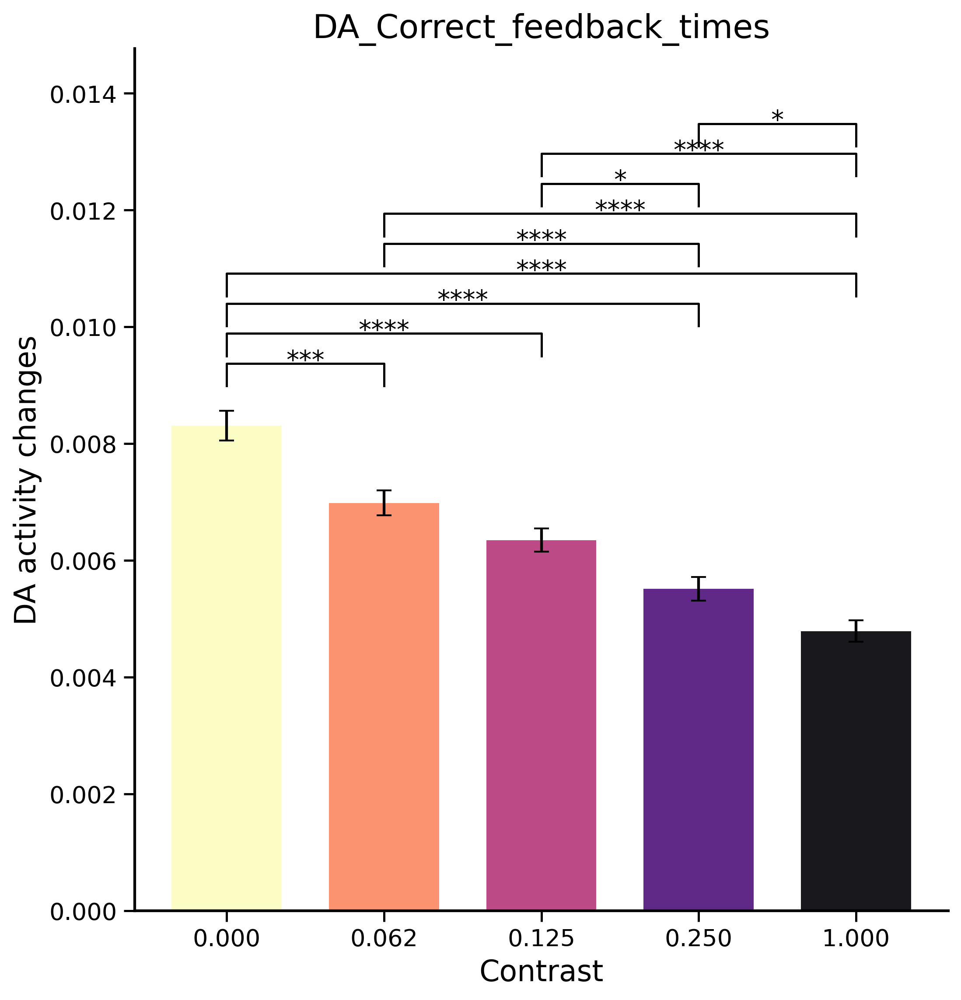

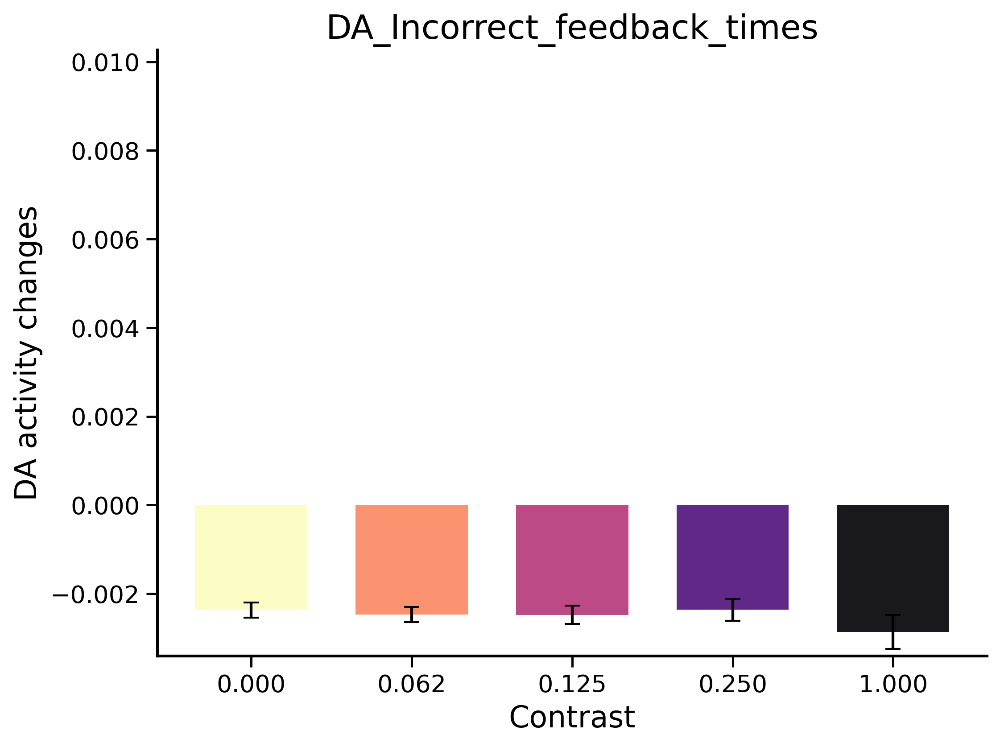

[SKIP] ZFM-03065 — no sessions with only biased blocks


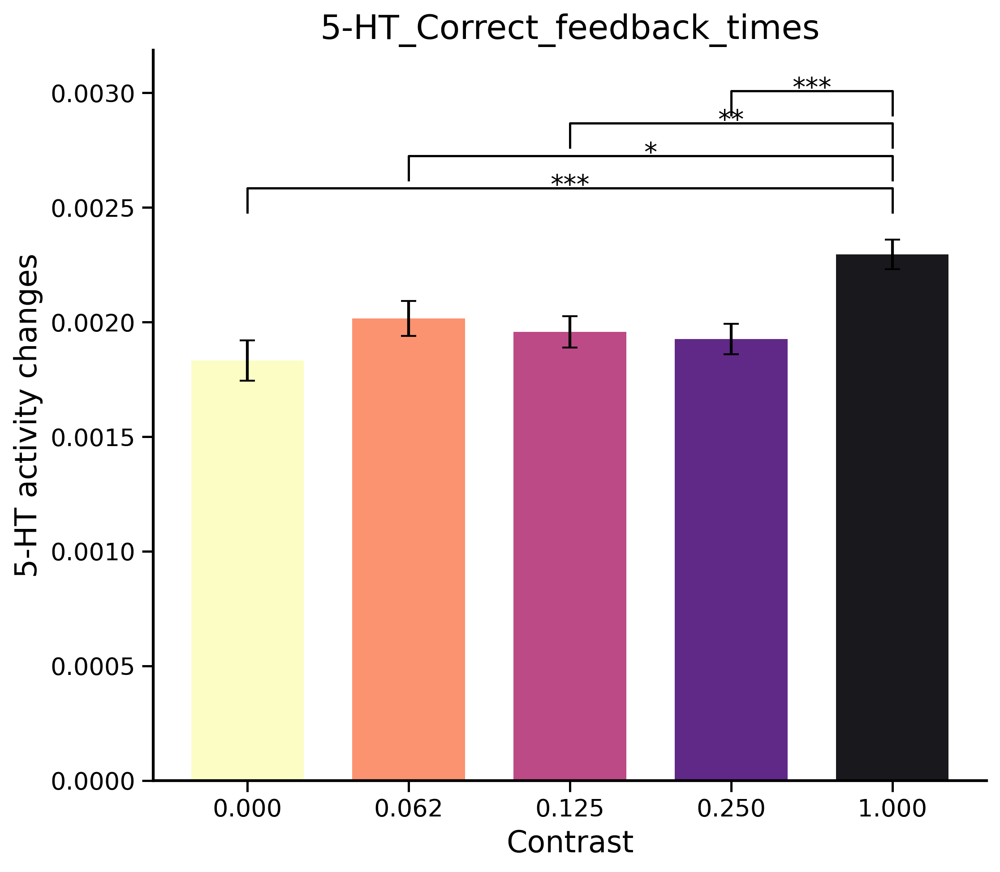

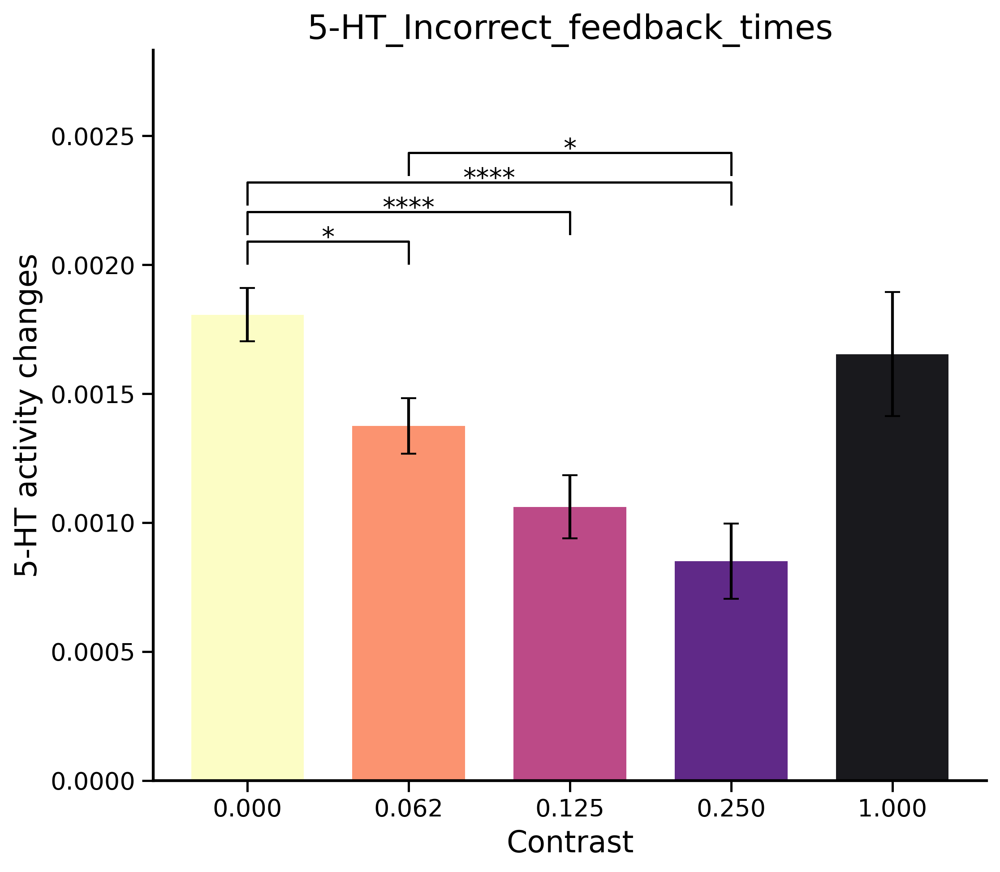

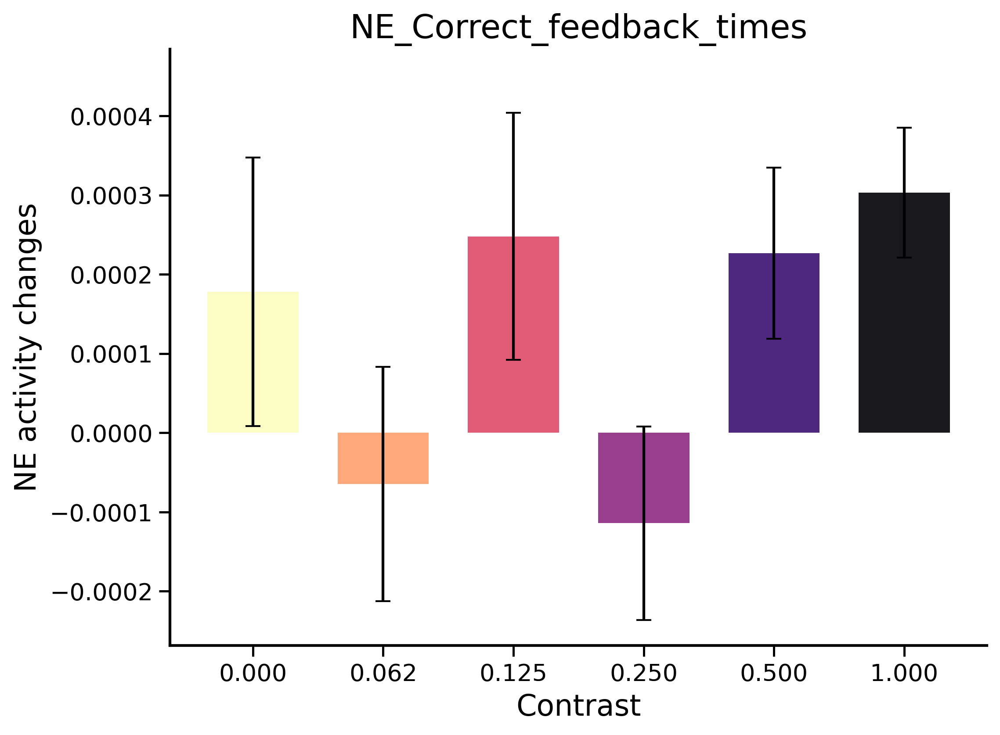

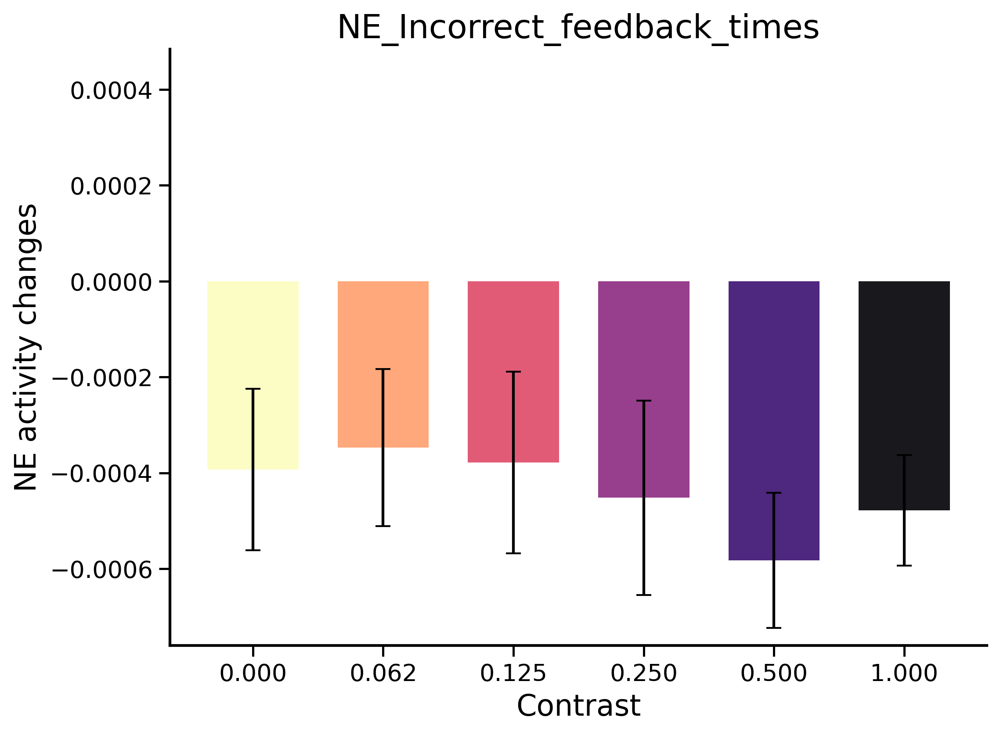

[SKIP] ZFM-06305_L — no sessions with only biased blocks


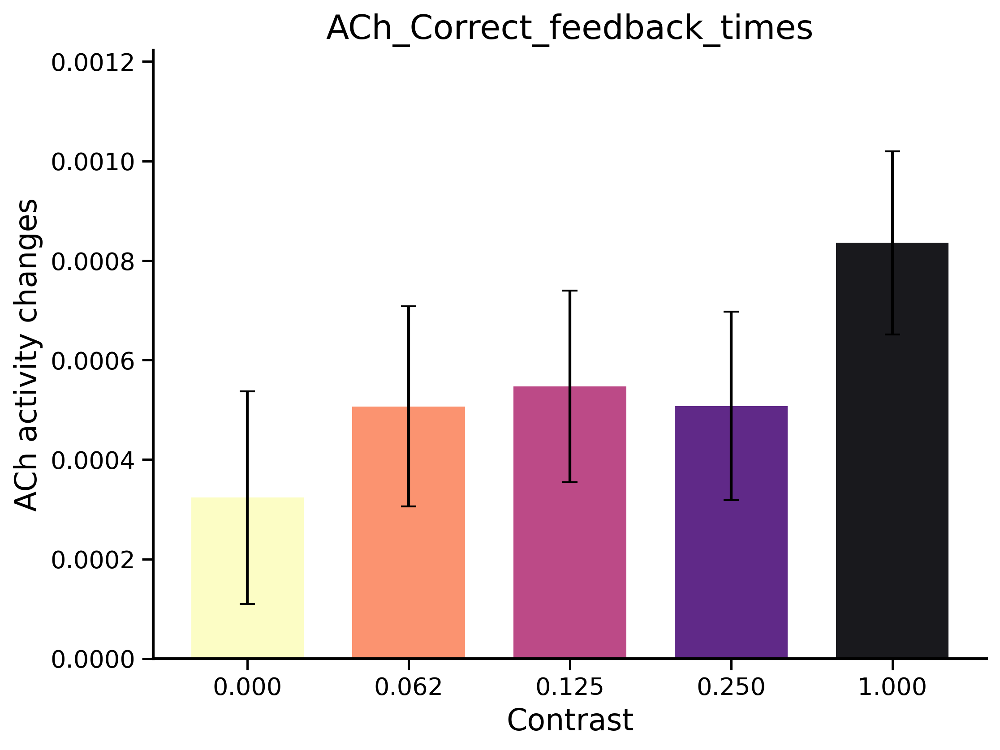

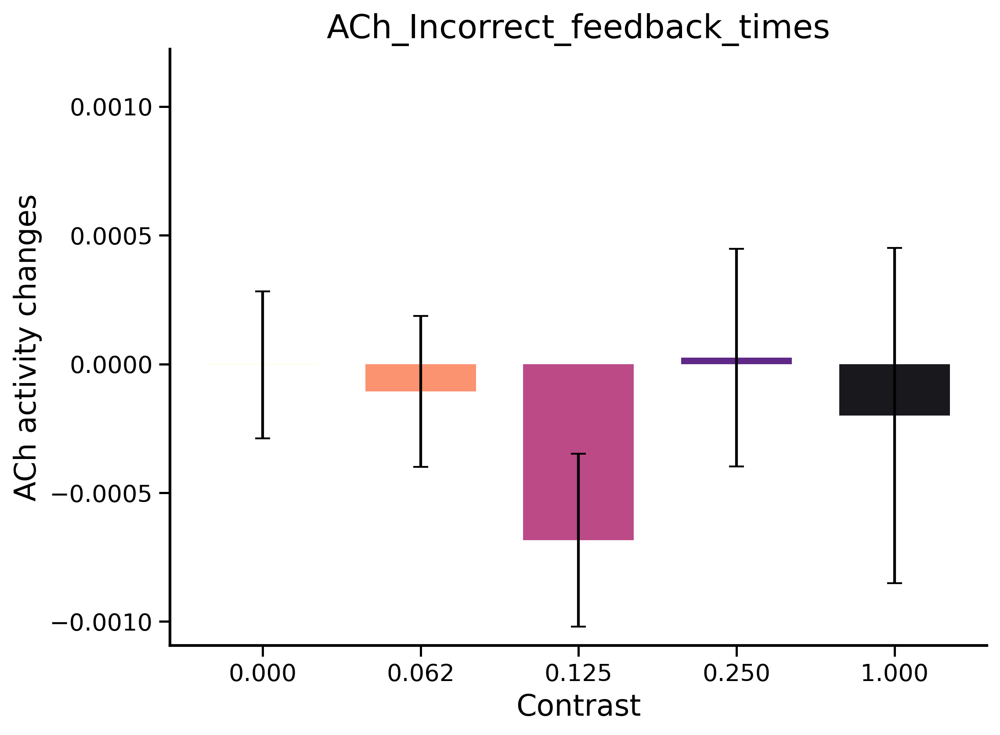

In [27]:
""" ALL THE CODE FOR THE CONTRASTS - ONLY BCW SESSIONS """

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from pingouin import pairwise_tukey
import pingouin as pg

import os
import matplotlib.patches as mpatches
import seaborn as sns

# path_to_data = '/mnt/h0/kb/Feb2025/data_behav_psth/Good_sessions/'
path_to_data = '/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions'
EVENTS = ['feedback_times']


#===========================================================================
def pad_to_match_length(arr, target_length):
    """Pad or trim an array to match the target length along the time axis."""
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    """
    Load and pad/interpolate psth and df_trials for a group of mice to a common length,
    keeping only trials from sessions where all probabilityLeft/probL values ∈ {0.2, 0.5, 0.8}.
    """
    combined_psth = []
    combined_trials = []
    target_rate = 30
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')

            # Load PSTH and trial data
            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                df_trials = pd.read_parquet(df_trials_path_15)
                psth = interpolate_to_common_time(psth, current_rate=15, target_rate=30, PERIEVENT_WINDOW=PERIEVENT_WINDOW)
            else:
                continue

            # Truncate to match
            if psth.shape[1] != len(df_trials):
                print(f"[WARN] Trial mismatch: {mouse} — trimming to match.")
                min_len = min(psth.shape[1], len(df_trials))
                psth = psth[:, :min_len]
                df_trials = df_trials.iloc[:min_len].reset_index(drop=True)

            # Detect probability column
            if 'probabilityLeft' in df_trials.columns:
                prob_col = 'probabilityLeft'
            elif 'probL' in df_trials.columns:
                prob_col = 'probL'
            else:
                print(f"[SKIP] {mouse} — no probL/probabilityLeft column")
                continue

            # Detect session identifier
            session_col = None
            for col in ['session_uuid', 'session_id', 'session', 'date', 'sessionDate']:
                if col in df_trials.columns:
                    session_col = col
                    break
            if session_col is None:
                print(f"[SKIP] {mouse} — no session identifier")
                continue

            # Group by session and find only sessions using biased blocks exclusively
            valid_probs = {0.2, 0.5, 0.8}
            valid_sessions = []
            for session_id, group in df_trials.groupby(session_col):
                probs = set(group[prob_col].dropna().unique())
                if probs.issubset(valid_probs):
                    valid_sessions.append(session_id)

            if not valid_sessions:
                print(f"[SKIP] {mouse} — no sessions with only biased blocks")
                continue

            # Filter trials from valid sessions only
            session_mask = df_trials[session_col].isin(valid_sessions)
            df_trials = df_trials[session_mask].reset_index(drop=True)
            psth = psth[:, session_mask.values]

            if df_trials.empty or psth.shape[1] == 0:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)

        except Exception as e:
            print(f"[ERROR] {mouse}, {event}: {e}")

    if combined_psth and combined_trials:
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        print("[INFO] No valid sessions found.")
        return None, None





# ============================
# Helper: Stars from p-values
# ============================
def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# ============================
# Helper: Plot barplot + stars
# ============================
def plot_with_significance(pairs, title, filename, contrast_labels, means, sems, colors, group_name, ylim_max=None):
    import matplotlib.pyplot as plt
    import numpy as np

    x = np.arange(len(contrast_labels))
    bar_width = 0.7

    # Dynamically adjust figure height based on number of pairs
    base_height = 6
    bracket_levels = len(pairs)
    extra_height = min(bracket_levels, 10) * 0.3  # increase height for many stars
    fig_height = base_height + extra_height
    fig, ax = plt.subplots(figsize=(8, fig_height), dpi=300)

    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    # Calculate y-limits
    y_max_bar = np.max(means + sems)
    y_max = ylim_max if ylim_max is not None else y_max_bar

    y_offset = y_max_bar * 0.05
    base_bracket_y = y_max_bar + y_offset
    label_to_x = {label: xi for label, xi in zip(contrast_labels, x)}

    for idx, (c1, c2, p_val) in enumerate(pairs):
        i1, i2 = label_to_x[c1], label_to_x[c2]
        x1, x2 = min(i1, i2), max(i1, i2)
        leg_height = y_offset * 0.9
        bar_y = base_bracket_y + (idx * y_offset * 1.2)

        ax.plot([x1, x1, x2, x2], [bar_y, bar_y + leg_height, bar_y + leg_height, bar_y], lw=1.2, c='black')
        ax.text((x1 + x2) / 2, bar_y + y_offset * 0.5, p_to_stars(p_val),
                ha='center', va='bottom', fontsize=14)

    # Ensure plot height accommodates everything
    max_bracket_y = base_bracket_y + (len(pairs) * y_offset * 1.5)
    ax.set_ylim([None, max(y_max * 1.2, max_bracket_y)])

    # Axes formatting
    ax.set_xticks(x)
    ax.set_xticklabels(contrast_labels, fontsize=16)
    ax.set_xlabel("Contrast", fontsize=16)
    ax.set_ylabel(f"{group_name} activity changes", fontsize=16)
    ax.set_title(title, fontsize=18)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
    ax.grid(False)

    # Save without tight_layout (which can clip top)
    fig.savefig(f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/{filename}.png", dpi=300, bbox_inches='tight')
    fig.savefig(f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/{filename}.pdf", dpi=300, bbox_inches='tight')
    plt.show()


# ============================
# Data extraction + normalization
# ============================
def extract_normalized_response(df_trials, psth_data, contrast_list, feedback_code, time_vector, response_idx, baseline_idx, epsilon=1e-6):
    result = []
    for contrast in contrast_list:
        idx = (df_trials['feedbackType'].values == feedback_code) & (df_trials['allContrasts'].values == contrast)
        if np.sum(idx) < 5:
            continue
        # V1 
        # psth_subset = psth_data[idx]
        # baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # aligned = psth_subset - baseline
        # # normalized = aligned / (baseline_std + epsilon) 
        # # normalized = aligned / (np.abs(baseline_std)) #COMMENTED ON 02072025
        # # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # # normalized = aligned / safe_baseline

        # V2
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # normalized = (aligned) / safe_baseline #deltaF_over_F = normalized
        
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # percent_change = (aligned / safe_baseline) * 100
        # response_vals = np.mean(percent_change[:, response_idx], axis=1)

        # V3 
        psth_subset = psth_data[idx]
        baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        aligned = psth_subset - baseline
        # normalized = aligned / (baseline_std + epsilon) 
        # normalized = aligned / (np.abs(baseline_std)) #COMMENTED ON 02072025
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # normalized = aligned / safe_baseline


        normalized = aligned #new 17072025
        # normalized = aligned / (np.abs(baseline)) #std ADDED ON 02072025 only baseline added on 15072025 
        response_vals = np.mean(normalized[:, response_idx], axis=1) #commented on 15072025
        for v in response_vals:
            result.append({'value': v, 'contrast': contrast, 'feedbackType': 'Correct' if feedback_code == 1 else 'Incorrect'})
    return pd.DataFrame(result)

# ============================
# Main analysis loop
# ============================
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    # "VTA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R"],
    # "SNc": ["ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "DR": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "MR": ["ZFM-03062"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    # "LC_L": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06171", "ZFM-06275_L"],
    # "LC_R": ["ZFM-06272_R", "ZFM-06275_R"],
    # "ACh": ["ZFM-06305_L", "ZFM-06305_R", "ZFM-06948"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
    # "SI_R": ["ZFM-06305_R"]
}


time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
cmap = get_cmap('magma_r')

events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

ymax_dict = {}  # To store max y-limits per (event, group_name)

for event in events:
    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        if psth_combined.shape[0] == 91:
            psth_combined = psth_combined.T
        unique_contrasts = np.sort(np.unique(df_trials_combined['allContrasts'].values))
        colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

        for fb_label, fb_code in feedback_types.items():
            df_plot = extract_normalized_response(df_trials_combined, psth_combined, unique_contrasts,
                                                  feedback_code=fb_code,
                                                  time_vector=time_vector,
                                                  response_idx=response_idx,
                                                  baseline_idx=baseline_idx)
            aov = pg.anova(data=df_plot, dv='value', between='contrast', detailed=True)
            posthoc = pg.pairwise_tukey(data=df_plot, dv='value', between='contrast')

            contrast_labels = [f"{c:.3f}" for c in unique_contrasts]
            means = df_plot.groupby('contrast')['value'].mean().reindex(unique_contrasts).values
            sems = df_plot.groupby('contrast')['value'].sem().reindex(unique_contrasts).values

            # Track the max y value for consistent ylim across Correct/Incorrect
            ymax = np.max(means + sems)
            key = (event, group_name)
            if key in ymax_dict:
                ymax_dict[key] = max(ymax_dict[key], ymax)
            else:
                ymax_dict[key] = ymax


            significant_pairs_all = [
                (f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey'])
                for _, row in posthoc.iterrows() if row['p-tukey'] < 0.05
            ]

            filename = f"barplot_18072025_just aligned_{group_name}_{event}_{fb_label}".replace(" ", "_")
            plot_with_significance(significant_pairs_all,
                                title=f"{group_name}_{fb_label}_{event}",
                                filename=filename,
                                contrast_labels=contrast_labels,
                                means=means,
                                sems=sems,
                                colors=colors,
                                group_name=group_name,
                                ylim_max=ymax_dict[(event, group_name)])


In [29]:
""" ALL THE CODE FOR THE CONTRASTS - ONLY BCW SESSIONS """

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from pingouin import pairwise_tukey
import pingouin as pg

import os
import matplotlib.patches as mpatches
import seaborn as sns

# path_to_data = '/mnt/h0/kb/Feb2025/data_behav_psth/Good_sessions/'
path_to_data = '/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions'
EVENTS = ['feedback_times']


#===========================================================================
def pad_to_match_length(arr, target_length):
    """Pad or trim an array to match the target length along the time axis."""
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    """
    Load and pad/interpolate psth and df_trials for a group of mice to a common length,
    keeping only trials from sessions where all probabilityLeft/probL values ∈ {0.2, 0.5, 0.8}.
    """
    combined_psth = []
    combined_trials = []
    target_rate = 30
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')

            # Load PSTH and trial data
            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                df_trials = pd.read_parquet(df_trials_path_15)
                psth = interpolate_to_common_time(psth, current_rate=15, target_rate=30, PERIEVENT_WINDOW=PERIEVENT_WINDOW)
            else:
                continue

            # Truncate to match
            if psth.shape[1] != len(df_trials):
                print(f"[WARN] Trial mismatch: {mouse} — trimming to match.")
                min_len = min(psth.shape[1], len(df_trials))
                psth = psth[:, :min_len]
                df_trials = df_trials.iloc[:min_len].reset_index(drop=True)

            # Detect probability column
            if 'probabilityLeft' in df_trials.columns:
                prob_col = 'probabilityLeft'
            elif 'probL' in df_trials.columns:
                prob_col = 'probL'
            else:
                print(f"[SKIP] {mouse} — no probL/probabilityLeft column")
                continue

            # Detect session identifier
            session_col = None
            for col in ['session_uuid', 'session_id', 'session', 'date', 'sessionDate']:
                if col in df_trials.columns:
                    session_col = col
                    break
            if session_col is None:
                print(f"[SKIP] {mouse} — no session identifier")
                continue

            # Group by session and find only sessions using biased blocks exclusively
            valid_probs = {0.2, 0.5, 0.8}
            valid_sessions = []
            for session_id, group in df_trials.groupby(session_col):
                probs = set(group[prob_col].dropna().unique())
                if probs.issubset(valid_probs):
                    valid_sessions.append(session_id)

            if not valid_sessions:
                print(f"[SKIP] {mouse} — no sessions with only biased blocks")
                continue

            # Filter trials from valid sessions only
            session_mask = df_trials[session_col].isin(valid_sessions)
            df_trials = df_trials[session_mask].reset_index(drop=True)
            psth = psth[:, session_mask.values]

            if df_trials.empty or psth.shape[1] == 0:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)

        except Exception as e:
            print(f"[ERROR] {mouse}, {event}: {e}")

    if combined_psth and combined_trials:
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        print("[INFO] No valid sessions found.")
        return None, None





# ============================
# Helper: Stars from p-values
# ============================
def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# ============================
# Helper: Plot barplot + stars
# ============================
def plot_significance_subplots(pairs_dict, contrast_labels, means_dict, sems_dict, colors, group_name, event, ymax):
    """
    Plots Correct and Incorrect subplots side by side for a given NM group and event,
    with shared y-limits and height adjusted to number of significance brackets.
    """
    fb_labels = ['Correct', 'Incorrect']
    n_conditions = len(contrast_labels)
    x = np.arange(n_conditions)
    bar_width = 0.7

    # Determine max number of brackets to adjust figure height
    max_pairs = max(len(pairs_dict[fb]) for fb in fb_labels)
    base_height = 6
    extra_height = min(max_pairs, 10) * 0.3
    fig_height = base_height + extra_height

    fig, axs = plt.subplots(1, 2, figsize=(16, fig_height), dpi=300, sharey=True)

    for ax, fb_label in zip(axs, fb_labels):
        means = means_dict[fb_label]
        sems = sems_dict[fb_label]
        pairs = pairs_dict[fb_label]

        for i in range(n_conditions):
            ax.bar(x[i], means[i], width=bar_width, yerr=sems[i],
                   color=colors[i], alpha=0.9, capsize=4)

        y_offset = ymax * 0.05
        base_bracket_y = ymax + y_offset
        for idx, (c1, c2, p_val) in enumerate(pairs):
            i1 = contrast_labels.index(c1)
            i2 = contrast_labels.index(c2)
            x1, x2 = min(i1, i2), max(i1, i2)
            leg_height = y_offset * 0.9
            bar_y = base_bracket_y + (idx * y_offset * 1.2)
            ax.plot([x1, x1, x2, x2], [bar_y, bar_y + leg_height, bar_y + leg_height, bar_y], lw=1.2, c='black')
            ax.text((x1 + x2) / 2, bar_y + y_offset * 0.5, p_to_stars(p_val),
                    ha='center', va='bottom', fontsize=14)

        ax.set_ylim([None, base_bracket_y + (len(pairs) * y_offset * 1.5)])
        ax.set_xticks(x)
        ax.set_xticklabels(contrast_labels, fontsize=16)
        ax.set_title(f"{group_name} – {fb_label}", fontsize=18)
        ax.set_xlabel("Contrast", fontsize=16)
        if fb_label == 'Correct':
            ax.set_ylabel(f"{group_name} activity changes", fontsize=16)

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_color('black')
        ax.spines['bottom'].set_color('black')
        ax.spines['left'].set_linewidth(1.5)
        ax.spines['bottom'].set_linewidth(1.5)
        ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
        ax.grid(False)

    plt.suptitle(f"{group_name} — {event}", fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    savebase = f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/combined_plot_BCW_{group_name}_{event}".replace(" ", "_")
    fig.savefig(savebase + ".png", dpi=300, bbox_inches='tight')
    fig.savefig(savebase + ".pdf", dpi=300, bbox_inches='tight')
    plt.show()


# ============================
# Data extraction + normalization
# ============================
def extract_normalized_response(df_trials, psth_data, contrast_list, feedback_code, time_vector, response_idx, baseline_idx, epsilon=1e-6):
    result = []
    for contrast in contrast_list:
        idx = (df_trials['feedbackType'].values == feedback_code) & (df_trials['allContrasts'].values == contrast)
        if np.sum(idx) < 5:
            continue
        # V1 
        # psth_subset = psth_data[idx]
        # baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # aligned = psth_subset - baseline
        # # normalized = aligned / (baseline_std + epsilon) 
        # # normalized = aligned / (np.abs(baseline_std)) #COMMENTED ON 02072025
        # # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # # normalized = aligned / safe_baseline

        # V2
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # normalized = (aligned) / safe_baseline #deltaF_over_F = normalized
        
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # percent_change = (aligned / safe_baseline) * 100
        # response_vals = np.mean(percent_change[:, response_idx], axis=1)

        # V3 
        psth_subset = psth_data[idx]
        baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        aligned = psth_subset - baseline
        # normalized = aligned / (baseline_std + epsilon) 
        # normalized = aligned / (np.abs(baseline_std)) #COMMENTED ON 02072025
        # safe_baseline = np.maximum(np.abs(baseline), 0.05)
        # normalized = aligned / safe_baseline


        normalized = aligned #new 17072025
        # normalized = aligned / (np.abs(baseline)) #std ADDED ON 02072025 only baseline added on 15072025 
        response_vals = np.mean(normalized[:, response_idx], axis=1) #commented on 15072025
        for v in response_vals:
            result.append({'value': v, 'contrast': contrast, 'feedbackType': 'Correct' if feedback_code == 1 else 'Incorrect'})
    return pd.DataFrame(result)

# ============================
# Main analysis loop
# ============================
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    # "VTA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R"],
    # "SNc": ["ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "DR": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    # "MR": ["ZFM-03062"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    # "LC_L": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06171", "ZFM-06275_L"],
    # "LC_R": ["ZFM-06272_R", "ZFM-06275_R"],
    # "ACh": ["ZFM-06305_L", "ZFM-06305_R", "ZFM-06948"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
    # "SI_R": ["ZFM-06305_R"]
}


time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
cmap = get_cmap('magma_r')

events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

ymax_dict = {}  # To store max y-limits per (event, group_name)

def plot_pair_with_significance(pairs_dict, contrast_labels, means_dict, sems_dict, colors, group_name, event, ymax):
    import matplotlib.pyplot as plt
    import numpy as np

    feedback_types = ['Correct', 'Incorrect']
    x = np.arange(len(contrast_labels))
    bar_width = 0.7

    # Dynamically adjust figure height based on number of significance pairs
    max_pairs = max(len(pairs_dict[fb]) for fb in feedback_types)
    base_height = 6
    extra_height = min(max_pairs, 10) * 0.3
    fig_height = base_height + extra_height

    fig, axes = plt.subplots(1, 2, figsize=(16, fig_height), dpi=300, sharey=True)
    
    for i, fb_label in enumerate(feedback_types):
        ax = axes[i]
        means = means_dict[fb_label]
        sems = sems_dict[fb_label]
        pairs = pairs_dict[fb_label]

        for j in range(len(x)):
            ax.bar(x[j], means[j], width=bar_width, yerr=sems[j], color=colors[j], alpha=0.9, capsize=4)

        y_offset = ymax * 0.05
        base_bracket_y = ymax + y_offset
        label_to_x = {label: xi for label, xi in zip(contrast_labels, x)}

        for idx, (c1, c2, p_val) in enumerate(pairs):
            i1, i2 = label_to_x[c1], label_to_x[c2]
            x1, x2 = min(i1, i2), max(i1, i2)
            leg_height = y_offset * 0.9
            bar_y = base_bracket_y + (idx * y_offset * 1.2)

            ax.plot([x1, x1, x2, x2], [bar_y, bar_y + leg_height, bar_y + leg_height, bar_y], lw=1.2, c='black')
            ax.text((x1 + x2) / 2, bar_y + y_offset * 0.5, p_to_stars(p_val),
                    ha='center', va='bottom', fontsize=14)

        ax.set_xticks(x)
        ax.set_xticklabels(contrast_labels, fontsize=16)
        ax.set_xlabel("Contrast", fontsize=16)
        ax.set_ylabel(f"{group_name} activity changes", fontsize=16) if i == 0 else None
        ax.set_title(f"{group_name} — {fb_label}", fontsize=18)

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_color('black')
        ax.spines['bottom'].set_color('black')
        ax.spines['left'].set_linewidth(1.5)
        ax.spines['bottom'].set_linewidth(1.5)
        ax.tick_params(axis='both', which='major', direction='out', length=6, width=1.2, labelsize=13)
        ax.set_ylim([None, base_bracket_y + y_offset * (len(pairs) + 2)])
        ax.grid(False)

    plt.tight_layout()
    filename = f"subplots_{event}_{group_name}_contrasts".replace(" ", "_")
    fig.savefig(f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/{filename}.png", dpi=300, bbox_inches='tight')
    fig.savefig(f"/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/{filename}.pdf", dpi=300, bbox_inches='tight')
    plt.show()


for event in events:
    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2])
        if psth_combined.shape[0] == 91:
            psth_combined = psth_combined.T
        unique_contrasts = np.sort(np.unique(df_trials_combined['allContrasts'].values))
        colors = cmap(np.linspace(0, 1, len(unique_contrasts)))
        # Store values for subplots
        # Collect data for both feedback types first
        pairs_dict = {}
        means_dict = {}
        sems_dict = {}

        for fb_label, fb_code in feedback_types.items():
            df_plot = extract_normalized_response(df_trials_combined, psth_combined, unique_contrasts,
                                                feedback_code=fb_code,
                                                time_vector=time_vector,
                                                response_idx=response_idx,
                                                baseline_idx=baseline_idx)

            posthoc = pg.pairwise_tukey(data=df_plot, dv='value', between='contrast')
            contrast_labels = [f"{c:.3f}" for c in unique_contrasts]
            means = df_plot.groupby('contrast')['value'].mean().reindex(unique_contrasts).values
            sems = df_plot.groupby('contrast')['value'].sem().reindex(unique_contrasts).values
            pairs = [(f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey']) for _, row in posthoc.iterrows() if row['p-tukey'] < 0.05]

            pairs_dict[fb_label] = pairs
            means_dict[fb_label] = means
            sems_dict[fb_label] = sems

        # Now plot both feedback types side-by-side
        plot_pair_with_significance(
            pairs_dict=pairs_dict,
            contrast_labels=contrast_labels,
            means_dict=means_dict,
            sems_dict=sems_dict,
            colors=colors,
            group_name=group_name,
            event=event,
            ymax=ymax_dict[(event, group_name)]
        )


<ipython-input-29-4e8d03b24bbf>:275: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('magma_r')


[SKIP] ZFM-03448 — no sessions with only biased blocks


KeyError: ('stimOnTrigger_times', 'DA')

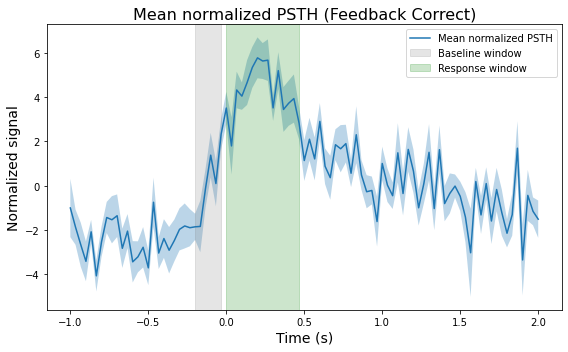

In [ ]:
# """ just to see the psth for all the data """ 
# # Select all trials of interest (you can filter further if you want)
# # For example, only Correct feedback:
# fb_code = 1  # or -1 for Incorrect
# idx = df_trials_combined["feedbackType"].values == fb_code

# # Extract subset
# psth_subset = psth_combined[idx]

# # Compute baseline per trial
# baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
# aligned = psth_subset - baseline
# # Normalize: (signal / abs(baseline))
# normalized = aligned / (np.abs(baseline) + 1e-6)

# # Compute mean and SEM across trials
# mean_trace = np.mean(normalized, axis=0)
# sem_trace = np.std(normalized, axis=0) / np.sqrt(normalized.shape[0])

# # Plot
# plt.figure(figsize=(8, 5))
# plt.plot(time_vector, mean_trace, label="Mean normalized PSTH")
# plt.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, alpha=0.3)

# # Mark baseline and response windows
# plt.axvspan(time_vector[baseline_idx[0]], time_vector[baseline_idx[-1]], color="gray", alpha=0.2, label="Baseline window")
# plt.axvspan(time_vector[response_idx[0]], time_vector[response_idx[-1]], color="green", alpha=0.2, label="Response window")

# plt.xlabel("Time (s)", fontsize=14)
# plt.ylabel("Normalized signal", fontsize=14)
# plt.title(f"Mean normalized PSTH (Feedback {'Correct' if fb_code == 1 else 'Incorrect'})", fontsize=16)
# plt.legend()
# plt.tight_layout()
# plt.show()


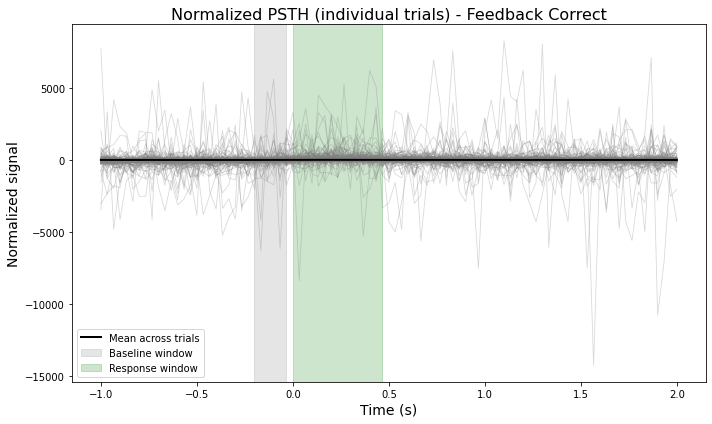

In [ ]:
# """ all psth lines """
# # Choose feedback code: 1 = Correct, -1 = Incorrect
# fb_code = 1  # or -1

# # Select all trials matching feedback type
# idx = df_trials_combined["feedbackType"].values == fb_code

# # Subset PSTH
# psth_subset = psth_combined[idx]

# # Compute baseline per trial
# baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
# aligned = psth_subset - baseline
# # Normalize
# normalized = aligned / (np.abs(baseline) + 1e-6) 

# # Plot all trials
# plt.figure(figsize=(10, 6))
# for i in range(normalized.shape[0]):
#     plt.plot(time_vector, normalized[i, :], alpha=0.3, color="gray", lw=0.8)

# # Overplot mean
# mean_trace = np.mean(normalized, axis=0)
# plt.plot(time_vector, mean_trace, color="black", lw=2, label="Mean across trials")

# # Mark baseline and response windows
# plt.axvspan(time_vector[baseline_idx[0]], time_vector[baseline_idx[-1]], color="gray", alpha=0.2, label="Baseline window")
# plt.axvspan(time_vector[response_idx[0]], time_vector[response_idx[-1]], color="green", alpha=0.2, label="Response window")

# plt.xlabel("Time (s)", fontsize=14)
# plt.ylabel("Normalized signal", fontsize=14)
# plt.title(f"Normalized PSTH (individual trials) - Feedback {'Correct' if fb_code == 1 else 'Incorrect'}", fontsize=16)
# plt.legend()
# # plt.ylim(-4,6)
# plt.tight_layout()
# plt.show()


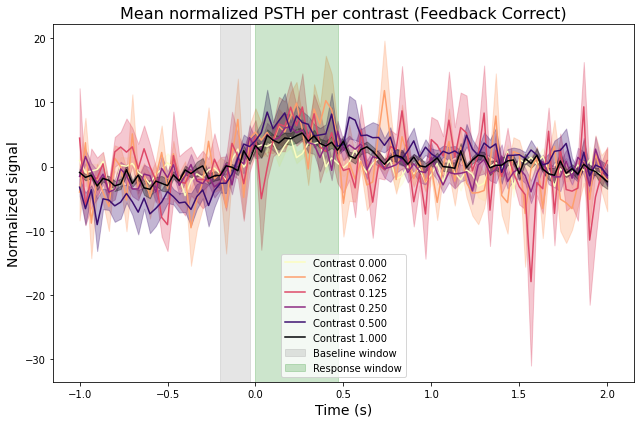

In [ ]:
# """all psth lines split by contrast """ 
# # Choose feedback code (1 = Correct, -1 = Incorrect)
# fb_code = 1  # or -1

# # Prepare plot
# plt.figure(figsize=(9, 6))

# # Colors per contrast
# colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

# # Loop over contrasts
# for i, contrast in enumerate(unique_contrasts):
#     # Select trials matching feedback code and contrast
#     idx = (
#         (df_trials_combined["feedbackType"].values == fb_code)
#         & (df_trials_combined["allContrasts"].values == contrast)
#     )
#     if np.sum(idx) < 1:
#         continue  # skip if no trials

#     # Subset PSTH
#     psth_subset = psth_combined[idx]

#     # Baseline and normalization
#     baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
#     normalized = psth_subset / (np.abs(baseline) + 1e-6)

#     # Mean and SEM
#     mean_trace = np.mean(normalized, axis=0)
#     sem_trace = np.std(normalized, axis=0) / np.sqrt(normalized.shape[0])

#     # Plot
#     plt.plot(time_vector, mean_trace, label=f"Contrast {contrast:.3f}", color=colors[i])
#     plt.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, color=colors[i], alpha=0.3)

# # Mark baseline and response windows
# plt.axvspan(time_vector[baseline_idx[0]], time_vector[baseline_idx[-1]], color="gray", alpha=0.2, label="Baseline window")
# plt.axvspan(time_vector[response_idx[0]], time_vector[response_idx[-1]], color="green", alpha=0.2, label="Response window")

# plt.xlabel("Time (s)", fontsize=14)
# plt.ylabel("Normalized signal", fontsize=14)
# plt.title(f"Mean normalized PSTH per contrast (Feedback {'Correct' if fb_code==1 else 'Incorrect'})", fontsize=16)
# plt.legend()
# # plt.ylim(-4,6)
# plt.tight_layout()
# plt.show()


Using 5th percentile threshold for baseline capping: 0.0003


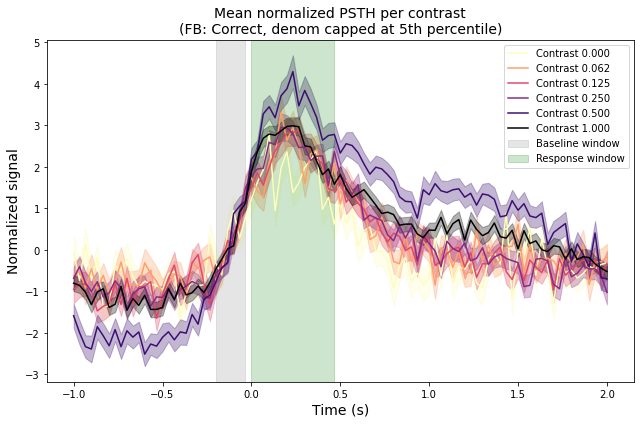

In [ ]:
# """ same plot as above but applying a cap to the denominator with low values """
# # Choose feedback code (1 = Correct, -1 = Incorrect)
# fb_code = 1

# plt.figure(figsize=(9, 6))
# colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

# # === 1. Estimate 5th percentile across all |baseline| values (feedback-matched trials only) ===
# # Collect all baseline values
# all_baselines = []
# for i, contrast in enumerate(unique_contrasts):
#     idx = (
#         (df_trials_combined["feedbackType"].values == fb_code)
#         & (df_trials_combined["allContrasts"].values == contrast)
#     )
#     if np.sum(idx) < 1:
#         continue
#     psth_subset = psth_combined[idx]
#     baseline = np.mean(psth_subset[:, baseline_idx], axis=1)
#     all_baselines.append(np.abs(baseline))

# # Concatenate and compute 5th percentile
# all_baselines_flat = np.concatenate(all_baselines)
# min_baseline_threshold = np.percentile(all_baselines_flat, 5)
# print(f"Using 5th percentile threshold for baseline capping: {min_baseline_threshold:.4f}")

# # === 2. Loop and normalize with denominator cap ===
# for i, contrast in enumerate(unique_contrasts):
#     idx = (
#         (df_trials_combined["feedbackType"].values == fb_code)
#         & (df_trials_combined["allContrasts"].values == contrast)
#     )
#     if np.sum(idx) < 1:
#         continue

#     psth_subset = psth_combined[idx]
#     baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)

#     # Cap denominator using 5th percentile
#     safe_baseline = np.clip(np.abs(baseline), min_baseline_threshold, None)
#     normalized = psth_subset / safe_baseline

#     mean_trace = np.mean(normalized, axis=0)
#     sem_trace = np.std(normalized, axis=0) / np.sqrt(normalized.shape[0])

#     # Plot
#     plt.plot(time_vector, mean_trace, label=f"Contrast {contrast:.3f}", color=colors[i])
#     plt.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, color=colors[i], alpha=0.3)

# # Mark baseline and response windows
# plt.axvspan(time_vector[baseline_idx[0]], time_vector[baseline_idx[-1]], color="gray", alpha=0.2, label="Baseline window")
# plt.axvspan(time_vector[response_idx[0]], time_vector[response_idx[-1]], color="green", alpha=0.2, label="Response window")

# plt.xlabel("Time (s)", fontsize=14)
# plt.ylabel("Normalized signal", fontsize=14)
# plt.title(f"Mean normalized PSTH per contrast\n(FB: {'Correct' if fb_code==1 else 'Incorrect'}, denom capped at 5th percentile)", fontsize=14)
# plt.legend()
# plt.tight_layout()
# plt.show()


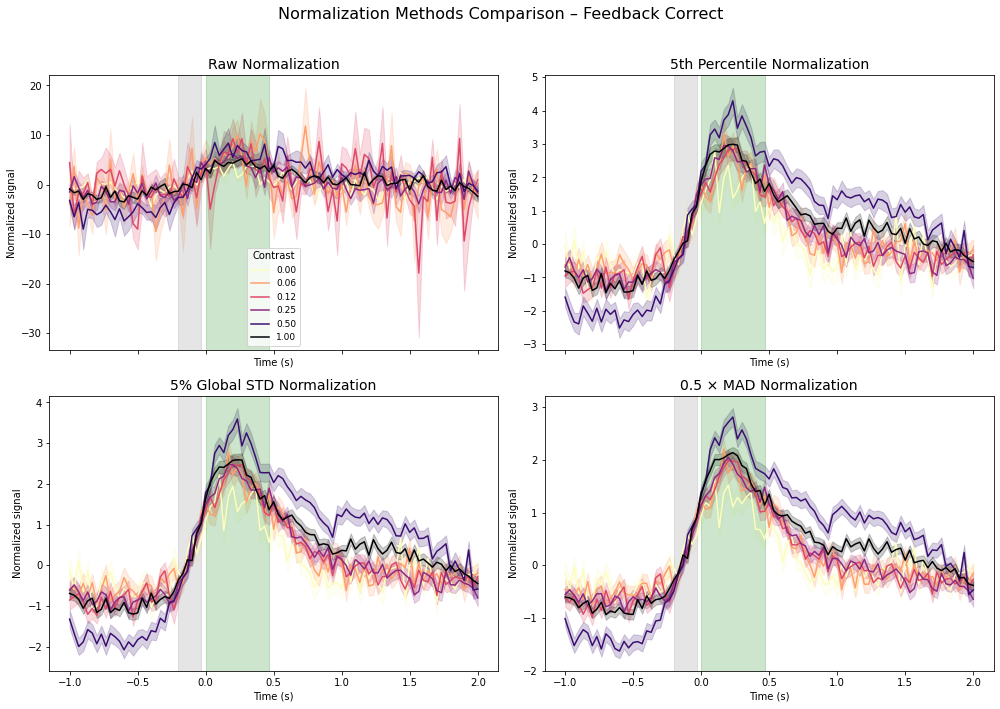

In [ ]:
# """ other ways to cap the data """
# from scipy.stats import median_abs_deviation

# fb_code = 1
# colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

# # Prepare figure
# fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=False)
# axs = axs.ravel()

# # Get all baseline values across trials
# all_baselines = []
# all_psth_vals = []
# for contrast in unique_contrasts:
#     idx = (df_trials_combined['feedbackType'].values == fb_code) & (df_trials_combined['allContrasts'].values == contrast)
#     if np.sum(idx) < 1:
#         continue
#     psth_subset = psth_combined[idx]
#     baseline = np.mean(psth_subset[:, baseline_idx], axis=1)
#     all_baselines.append(np.abs(baseline))
#     all_psth_vals.append(psth_subset.flatten())

# all_baselines_flat = np.concatenate(all_baselines)
# all_psth_flat = np.concatenate(all_psth_vals)

# # Method thresholds
# p5_thresh = np.percentile(all_baselines_flat, 5)
# std_thresh = 0.05 * np.std(all_psth_flat)
# mad_thresh = 0.5 * median_abs_deviation(all_baselines_flat)

# methods = {
#     "Raw": lambda b: np.abs(b) + 1e-6,
#     "5th Percentile": lambda b: np.clip(np.abs(b), p5_thresh, None),
#     "5% Global STD": lambda b: np.clip(np.abs(b), std_thresh, None),
#     "0.5 × MAD": lambda b: np.clip(np.abs(b), mad_thresh, None),
# }

# for method_idx, (method_name, baseline_transform) in enumerate(methods.items()):
#     ax = axs[method_idx]
#     for i, contrast in enumerate(unique_contrasts):
#         idx = (df_trials_combined['feedbackType'].values == fb_code) & (df_trials_combined['allContrasts'].values == contrast)
#         if np.sum(idx) < 1:
#             continue

#         psth_subset = psth_combined[idx]
#         baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
#         safe_baseline = baseline_transform(baseline)
#         normalized = psth_subset / safe_baseline

#         mean_trace = np.mean(normalized, axis=0)
#         sem_trace = np.std(normalized, axis=0) / np.sqrt(normalized.shape[0])

#         ax.plot(time_vector, mean_trace, label=f"{contrast:.2f}", color=colors[i])
#         ax.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, alpha=0.2, color=colors[i])

#     # Highlight baseline and response windows
#     ax.axvspan(time_vector[baseline_idx[0]], time_vector[baseline_idx[-1]], color="gray", alpha=0.2)
#     ax.axvspan(time_vector[response_idx[0]], time_vector[response_idx[-1]], color="green", alpha=0.2)
#     ax.set_title(f"{method_name} Normalization", fontsize=14)
#     ax.set_xlabel("Time (s)")
#     ax.set_ylabel("Normalized signal")

# # Final touches
# axs[0].legend(title="Contrast", fontsize=9)
# plt.suptitle(f"Normalization Methods Comparison – Feedback {'Correct' if fb_code==1 else 'Incorrect'}", fontsize=16)
# plt.tight_layout(rect=[0, 0, 1, 0.96])
# plt.show()


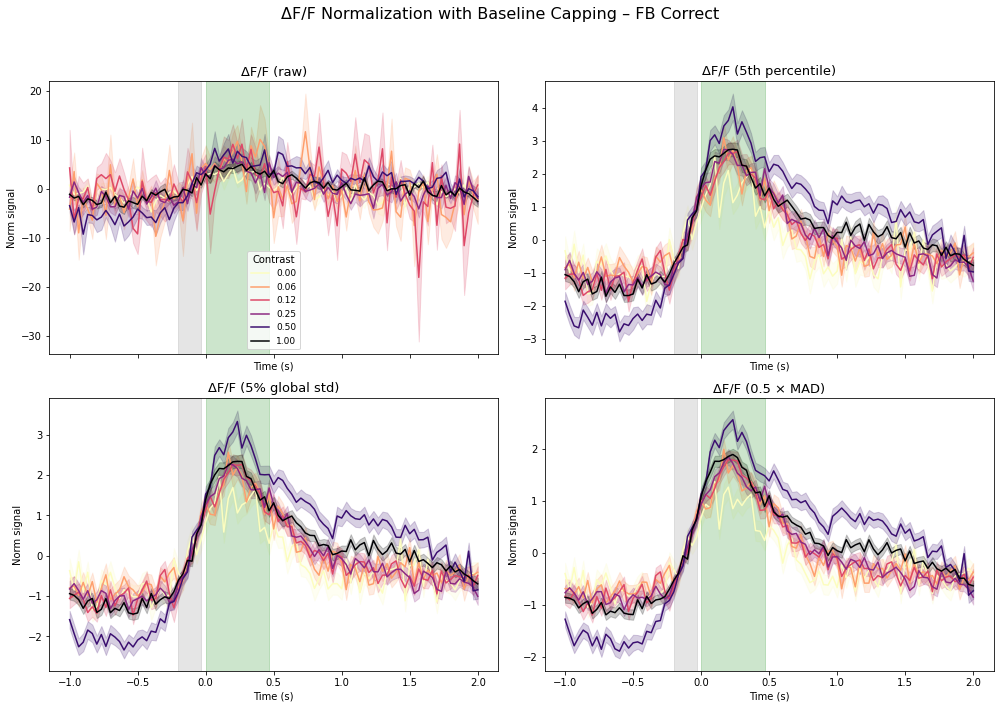

In [ ]:
# """ now with alignment (subtraction of the baseline) first, bef div - 1. DeltaF/F"""
# from scipy.stats import median_abs_deviation

# fb_code = 1
# colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

# # === Collect baseline stats ===
# all_baselines = []
# all_baseline_stds = []
# all_psth_vals = []

# for contrast in unique_contrasts:
#     idx = (df_trials_combined['feedbackType'].values == fb_code) & (df_trials_combined['allContrasts'].values == contrast)
#     if np.sum(idx) < 1:
#         continue
#     psth_subset = psth_combined[idx]
#     baseline_vals = np.mean(psth_subset[:, baseline_idx], axis=1)
#     baseline_stds = np.std(psth_subset[:, baseline_idx], axis=1)
#     all_baselines.append(np.abs(baseline_vals))
#     all_baseline_stds.append(baseline_stds)
#     all_psth_vals.append(psth_subset.flatten())

# # === Calculate thresholds ===
# all_baselines_flat = np.concatenate(all_baselines)
# all_baseline_stds_flat = np.concatenate(all_baseline_stds)
# all_psth_flat = np.concatenate(all_psth_vals)

# p5_thresh = np.percentile(all_baselines_flat, 5)
# std_thresh = 0.05 * np.std(all_psth_flat)
# mad_thresh = 0.5 * median_abs_deviation(all_baselines_flat)

# # === Define normalization methods ===
# methods = {
#     "ΔF/F (raw)": lambda base, _: np.abs(base) + 1e-6,
#     "ΔF/F (5th percentile)": lambda base, _: np.clip(np.abs(base), p5_thresh, None),
#     "ΔF/F (5% global std)": lambda base, _: np.clip(np.abs(base), std_thresh, None),
#     "ΔF/F (0.5 × MAD)": lambda base, _: np.clip(np.abs(base), mad_thresh, None),
# }

# # === Setup plot ===
# fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=False)
# axs = axs.ravel()

# for method_idx, (method_name, denom_func) in enumerate(methods.items()):
#     ax = axs[method_idx]
#     for i, contrast in enumerate(unique_contrasts):
#         idx = (df_trials_combined['feedbackType'].values == fb_code) & (df_trials_combined['allContrasts'].values == contrast)
#         if np.sum(idx) < 1:
#             continue

#         psth_subset = psth_combined[idx]
#         baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
#         aligned = psth_subset - baseline
#         denom = denom_func(baseline, psth_subset)
#         normalized = aligned / denom

#         mean_trace = np.mean(normalized, axis=0)
#         sem_trace = np.std(normalized, axis=0) / np.sqrt(normalized.shape[0])

#         ax.plot(time_vector, mean_trace, label=f"{contrast:.2f}", color=colors[i])
#         ax.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, alpha=0.2, color=colors[i])

#     ax.axvspan(time_vector[baseline_idx[0]], time_vector[baseline_idx[-1]], color="gray", alpha=0.2)
#     ax.axvspan(time_vector[response_idx[0]], time_vector[response_idx[-1]], color="green", alpha=0.2)
#     ax.set_title(method_name, fontsize=13)
#     ax.set_xlabel("Time (s)")
#     ax.set_ylabel("Norm signal")

# axs[0].legend(title="Contrast", fontsize=9)
# plt.suptitle(f"ΔF/F Normalization with Baseline Capping – FB {'Correct' if fb_code==1 else 'Incorrect'}", fontsize=16)
# plt.tight_layout(rect=[0, 0, 1, 0.95])
# plt.show()


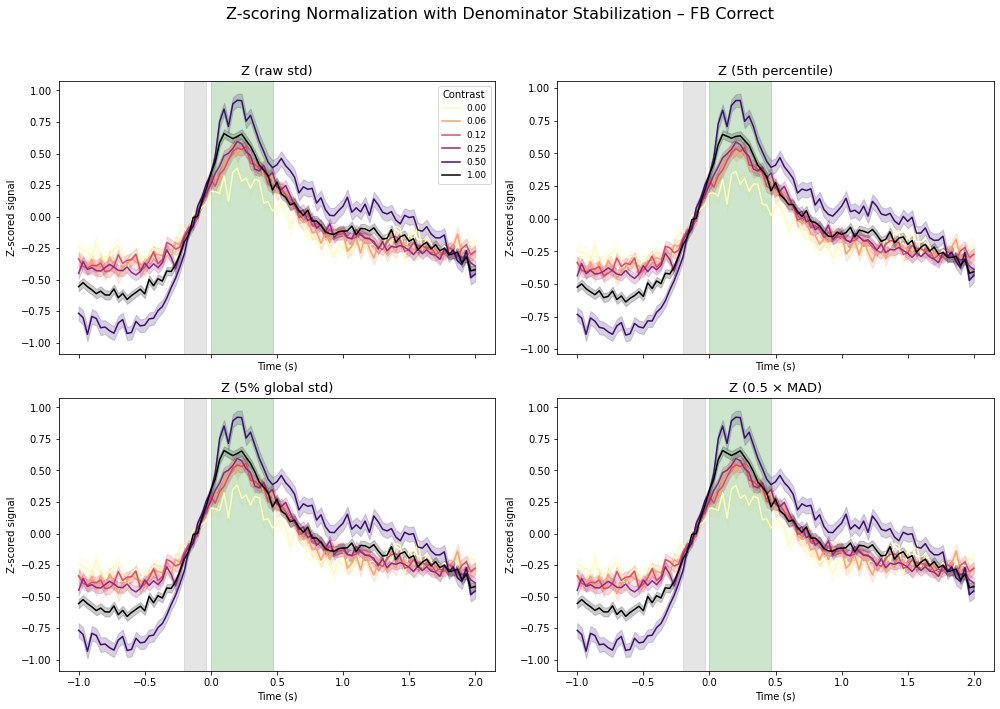

In [ ]:
# """ now with alignment (subtraction of the baseline) first, bef div - 2. z-scoring """
# from scipy.stats import median_abs_deviation

# fb_code = 1
# colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

# # === Collect baseline std values across all contrasts ===
# all_baseline_stds = []
# all_psth_vals = []

# for contrast in unique_contrasts:
#     idx = (df_trials_combined['feedbackType'].values == fb_code) & (df_trials_combined['allContrasts'].values == contrast)
#     if np.sum(idx) < 1:
#         continue
#     psth_subset = psth_combined[idx]
#     baseline_stds = np.std(psth_subset[:, baseline_idx], axis=1)
#     all_baseline_stds.append(baseline_stds)
#     all_psth_vals.append(psth_subset.flatten())

# # === Thresholds for z-scoring denominator ===
# all_baseline_stds_flat = np.concatenate(all_baseline_stds)
# all_psth_flat = np.concatenate(all_psth_vals)

# p5_thresh = np.percentile(all_baseline_stds_flat, 5)
# std_thresh = 0.05 * np.std(all_psth_flat)
# mad_thresh = 0.5 * median_abs_deviation(all_baseline_stds_flat)

# # === Z-scoring methods (denominator capping) ===
# z_methods = {
#     "Z (raw std)": lambda std: std + 1e-6,
#     "Z (5th percentile)": lambda std: np.clip(std, p5_thresh, None),
#     "Z (5% global std)": lambda std: np.clip(std, std_thresh, None),
#     "Z (0.5 × MAD)": lambda std: np.clip(std, mad_thresh, None),
# }

# # === Plot setup ===
# fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=False)
# axs = axs.ravel()

# for method_idx, (method_name, denom_func) in enumerate(z_methods.items()):
#     ax = axs[method_idx]
#     for i, contrast in enumerate(unique_contrasts):
#         idx = (df_trials_combined["feedbackType"].values == fb_code) & (df_trials_combined["allContrasts"].values == contrast)
#         if np.sum(idx) < 1:
#             continue

#         psth_subset = psth_combined[idx]
#         baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
#         baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
#         aligned = psth_subset - baseline

#         denom = denom_func(baseline_std)
#         normalized = aligned / denom

#         mean_trace = np.mean(normalized, axis=0)
#         sem_trace = np.std(normalized, axis=0) / np.sqrt(normalized.shape[0])

#         ax.plot(time_vector, mean_trace, label=f"{contrast:.2f}", color=colors[i])
#         ax.fill_between(time_vector, mean_trace - sem_trace, mean_trace + sem_trace, alpha=0.2, color=colors[i])

#     ax.axvspan(time_vector[baseline_idx[0]], time_vector[baseline_idx[-1]], color="gray", alpha=0.2)
#     ax.axvspan(time_vector[response_idx[0]], time_vector[response_idx[-1]], color="green", alpha=0.2)
#     ax.set_title(method_name, fontsize=13)
#     ax.set_xlabel("Time (s)")
#     ax.set_ylabel("Z-scored signal")

# axs[0].legend(title="Contrast", fontsize=9)
# plt.suptitle(f"Z-scoring Normalization with Denominator Stabilization – FB {'Correct' if fb_code==1 else 'Incorrect'}", fontsize=16)
# plt.tight_layout(rect=[0, 0, 1, 0.95])
# plt.show()


In [ ]:
# def extract_response(df_trials, psth_data, contrast_list, feedback_code, time_vector, response_idx, baseline_idx, return_percent=False):
#     result = []
#     for contrast in contrast_list:
#         idx = (df_trials['feedbackType'].values == feedback_code) & (df_trials['allContrasts'].values == contrast)
#         if np.sum(idx) < 5:
#             continue
#         psth_subset = psth_data[idx]
#         baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
#         aligned = psth_subset - baseline
#         safe_baseline = np.maximum(np.abs(baseline), 0.05)

#         if return_percent:
#             normalized = (aligned / safe_baseline) * 100
#         else:
#             normalized = aligned / safe_baseline

#         response_vals = np.mean(normalized[:, response_idx], axis=1)

#         for v in response_vals:
#             result.append({
#                 'value': v,
#                 'contrast': contrast,
#                 'feedbackType': 'Correct' if feedback_code == 1 else 'Incorrect'
#             })
#     return pd.DataFrame(result)


In [ ]:
# events = ['stimOnTrigger_times', 'feedback_times']
# feedback_types = {'Correct': 1, 'Incorrect': -1}
# time_vector = np.linspace(-1, 2, 91)
# baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
# response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
# cmap = get_cmap('magma_r')

# for event in events:
#     for group_name, group_mice in groups.items():
#         psth_combined, df_trials_combined = load_group_data(
#             group_mice, event, path_to_data, PERIEVENT_WINDOW=[-1, 2]
#         )
#         if psth_combined is None:
#             continue
#         if psth_combined.shape[0] == 91:
#             psth_combined = psth_combined.T
#         unique_contrasts = np.sort(np.unique(df_trials_combined['allContrasts'].values))
#         colors = cmap(np.linspace(0, 1, len(unique_contrasts)))

#         for fb_label, fb_code in feedback_types.items():
#             # ============= V1: Raw normalized ============
#             df_plot = extract_response(
#                 df_trials_combined,
#                 psth_combined,
#                 unique_contrasts,
#                 feedback_code=fb_code,
#                 time_vector=time_vector,
#                 response_idx=response_idx,
#                 baseline_idx=baseline_idx,
#                 return_percent=False  # raw normalized
#             )
#             aov = pg.anova(data=df_plot, dv='value', between='contrast', detailed=True)
#             posthoc = pg.pairwise_tukey(data=df_plot, dv='value', between='contrast')

#             contrast_labels = [f"{c:.3f}" for c in unique_contrasts]
#             means = df_plot.groupby('contrast')['value'].mean().reindex(unique_contrasts).values
#             sems = df_plot.groupby('contrast')['value'].sem().reindex(unique_contrasts).values

#             significant_pairs_all = [
#                 (f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey'])
#                 for _, row in posthoc.iterrows() if row['p-tukey'] < 0.05
#             ]

#             filename = f"barplot_{group_name}_{event}_{fb_label}_RAW"
#             plot_with_significance(
#                 significant_pairs_all,
#                 title=f"{group_name} {fb_label} {event} (Raw normalized)",
#                 filename=filename,
#                 contrast_labels=contrast_labels,
#                 means=means,
#                 sems=sems,
#                 colors=colors,
#                 group_name=group_name
#             )

#             # ============= V2: Percent change ============
#             df_plot_percent = extract_response(
#                 df_trials_combined,
#                 psth_combined,
#                 unique_contrasts,
#                 feedback_code=fb_code,
#                 time_vector=time_vector,
#                 response_idx=response_idx,
#                 baseline_idx=baseline_idx,
#                 return_percent=True  # percent
#             )
#             aov_percent = pg.anova(data=df_plot_percent, dv='value', between='contrast', detailed=True)
#             posthoc_percent = pg.pairwise_tukey(data=df_plot_percent, dv='value', between='contrast')

#             means_percent = df_plot_percent.groupby('contrast')['value'].mean().reindex(unique_contrasts).values
#             sems_percent = df_plot_percent.groupby('contrast')['value'].sem().reindex(unique_contrasts).values

#             significant_pairs_percent = [
#                 (f"{row['A']:.3f}", f"{row['B']:.3f}", row['p-tukey'])
#                 for _, row in posthoc_percent.iterrows() if row['p-tukey'] < 0.05
#             ]

#             filename_percent = f"barplot_{group_name}_{event}_{fb_label}_PERCENT"
#             plot_with_significance(
#                 significant_pairs_percent,
#                 title=f"{group_name} {fb_label} {event} (% Change)",
#                 filename=filename_percent,
#                 contrast_labels=contrast_labels,
#                 means=means_percent,
#                 sems=sems_percent,
#                 colors=colors,
#                 group_name=group_name + " (% Change)"
#             )


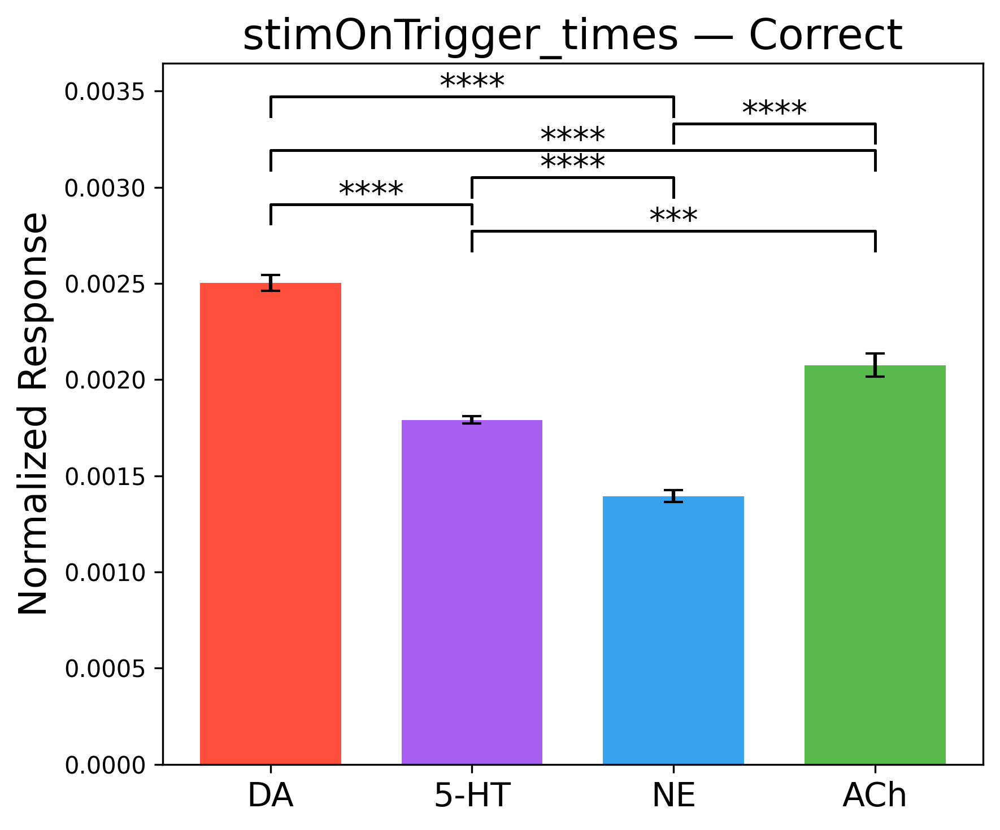

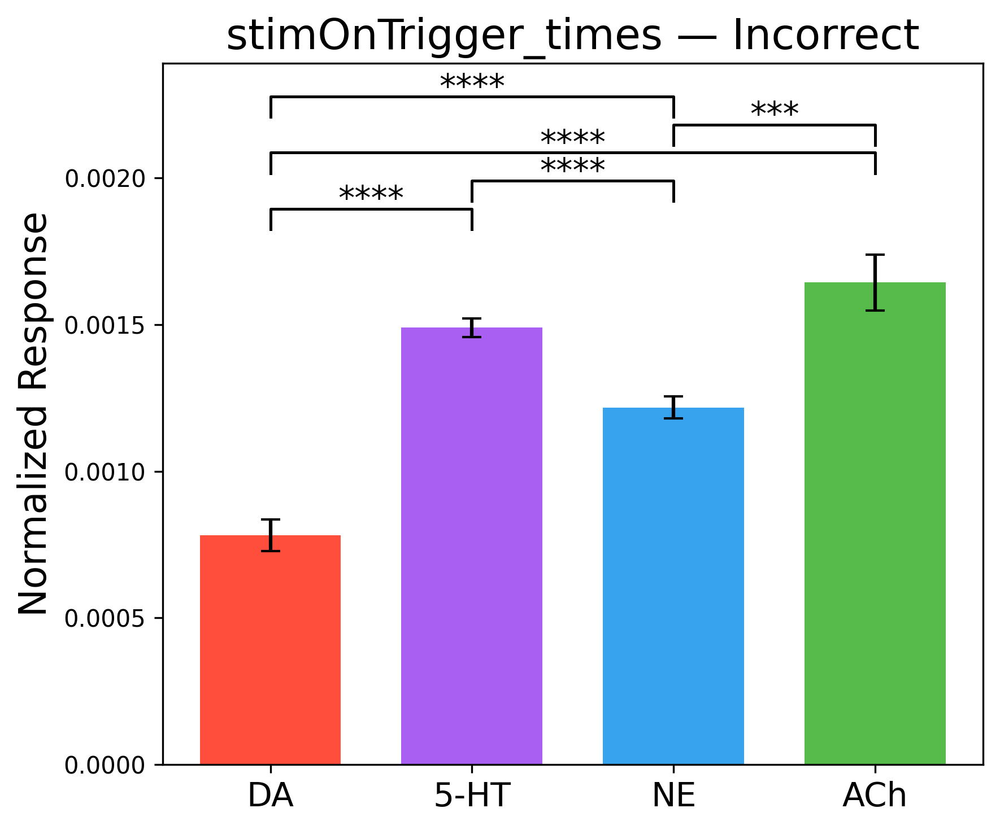

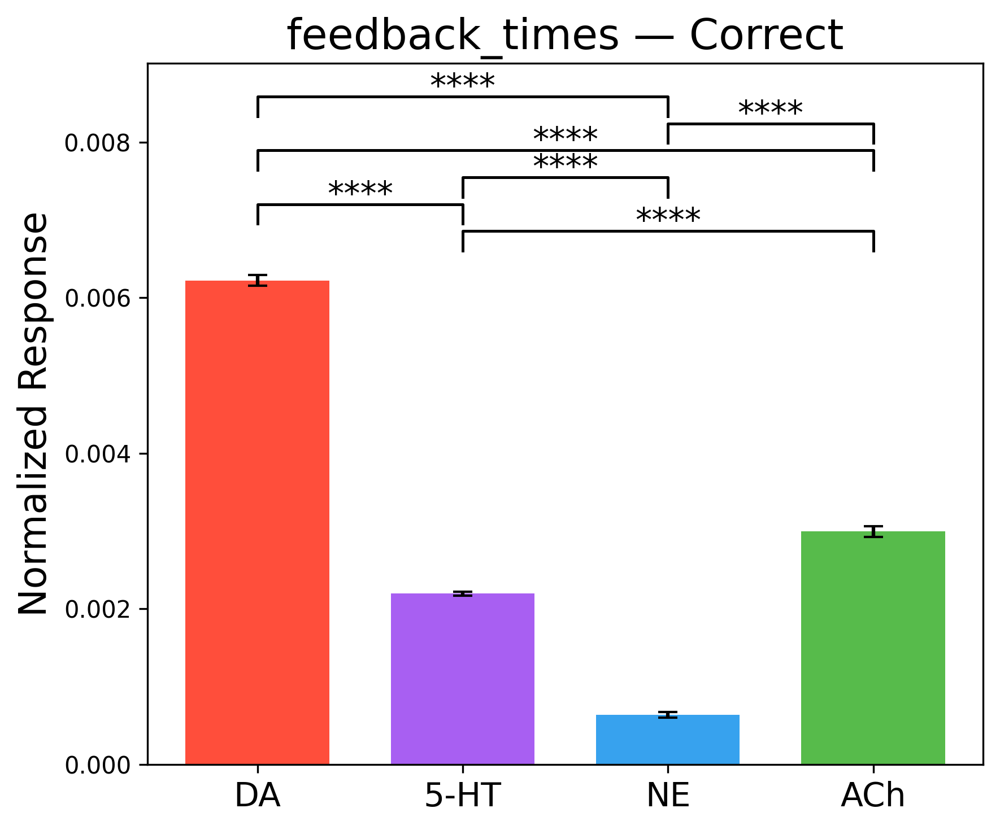

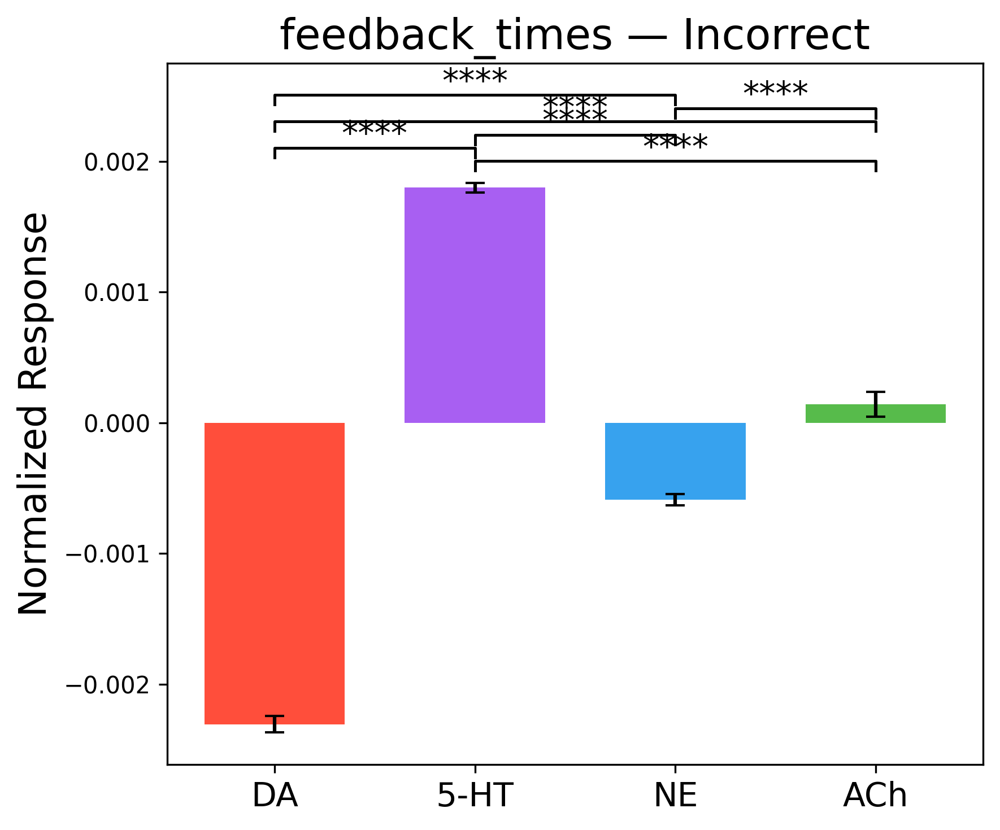

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import pingouin as pg

# ============================
# Helpers
# ============================
def pad_to_match_length(arr, target_length):
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def interpolate_to_common_time(psth, current_rate, target_rate, PERIEVENT_WINDOW):
    from scipy.interpolate import interp1d
    old_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth.shape[0])
    new_len = int((PERIEVENT_WINDOW[1] - PERIEVENT_WINDOW[0]) * target_rate) + 1
    new_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], new_len)
    interp = interp1d(old_time, psth, axis=0, kind='linear')
    return interp(new_time)

def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# ============================
# Load Data
# ============================
def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    combined_psth = []
    combined_trials = []
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')

            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                psth = interpolate_to_common_time(psth, 15, 30, PERIEVENT_WINDOW)
                df_trials = pd.read_parquet(df_trials_path_15)
            else:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)

        except Exception as e:
            print(f"Error loading {mouse} {event}: {e}")

    if combined_psth and combined_trials:
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        return None, None

# ============================
# Plotting function
# ============================
def plot_NM_barplot(df_values, event_label, feedback_label, color_palette):
    nms = df_values['group_name'].unique()
    means = df_values.groupby('group_name')['value'].mean().reindex(nms).values
    sems = df_values.groupby('group_name')['value'].sem().reindex(nms).values
    colors = [color_palette[nm] for nm in nms]

    x = np.arange(len(nms))
    bar_width = 0.7

    fig, ax = plt.subplots(figsize=(6, 5), dpi=300)
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    # ANOVA + Tukey
    aov = pg.anova(data=df_values, dv='value', between='group_name', detailed=True)
    posthoc = pg.pairwise_tukey(data=df_values, dv='value', between='group_name')

    y_max = np.max(means + sems)
    y_offset = y_max * 0.05
    current_y = y_max + y_offset
    label_to_x = {label: xi for label, xi in zip(nms, x)} 

    for _, row in posthoc.iterrows():
        if row['p-tukey'] < 0.05:
            i1, i2 = label_to_x[row['A']], label_to_x[row['B']]
            x1, x2 = min(i1, i2), max(i1, i2)
            ax.plot([x1, x1, x2, x2],
                    [current_y, current_y + y_offset * 0.8, current_y + y_offset * 0.8, current_y],
                    lw=1.2, c='black')
            ax.text((x1 + x2) / 2, current_y + y_offset * 0.5, p_to_stars(row['p-tukey']),
                    ha='center', va='bottom', fontsize=14)
            current_y += y_offset * 1.1

    ax.set_xticks(x)
    ax.set_xticklabels(nms, fontsize=14)
    ax.set_ylabel("Normalized Response", fontsize=16)
    ax.set_title(f"{event_label} — {feedback_label}", fontsize=18)
    plt.tight_layout()
    # Save figure
    # if not os.path.exists('/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/'):
    #     os.makedirs('/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/')

    filename_base = f"/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/barplot_18072025_{event_label}_{feedback_label}_final"
    plt.savefig(filename_base + ".png", dpi=300, bbox_inches='tight')
    plt.savefig(filename_base + ".pdf", dpi=300, bbox_inches='tight')
    plt.show()

# ============================
# Main Analysis
# ============================
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
}
color_palette = {
    "DA": "#FF3B25",
    "5-HT": "#9F4DF1",
    "NE": "#2198ED",
    "ACh": "#45B437"
}

path_to_data = "/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions"
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
PERIEVENT_WINDOW = [-1, 2]

events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

for event in events:
    for fb_label, fb_code in feedback_types.items():
        all_data = []
        for group_name, group_mice in groups.items():
            psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW)
            if psth_combined is None:
                continue
            if psth_combined.shape[0] == 91:
                psth_combined = psth_combined.T

            idx = df_trials_combined['feedbackType'].values == fb_code
            psth_subset = psth_combined[idx]
            if psth_subset.shape[0] < 5:
                continue

            baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
            aligned = psth_subset - baseline

            # # Floor the baseline to avoid division by near-zero
            # safe_baseline = np.maximum(np.abs(baseline), 0.05)

            # Choose whether to compute raw normalized or percent change
            # V1 = raw normalized
            # V2 = percent change
            # -------------------
            # use_percent = True  # <-- SWITCH HERE: True = V2 (%), False = V1 (raw normalized)

            # if use_percent:
            #     normalized = (aligned / safe_baseline) * 100
            # else:
            #     normalized = aligned / safe_baseline



            # Average over the 0–0.5 s interval

            normalized = aligned
            response = np.mean(normalized[:, response_idx], axis=1)


            for val in response:
                all_data.append({'value': val, 'group_name': group_name})

        df_values = pd.DataFrame(all_data)
        if df_values.empty:
            print(f"No data for {event} {fb_label}")
            continue
        plot_NM_barplot(df_values, event, fb_label, color_palette)



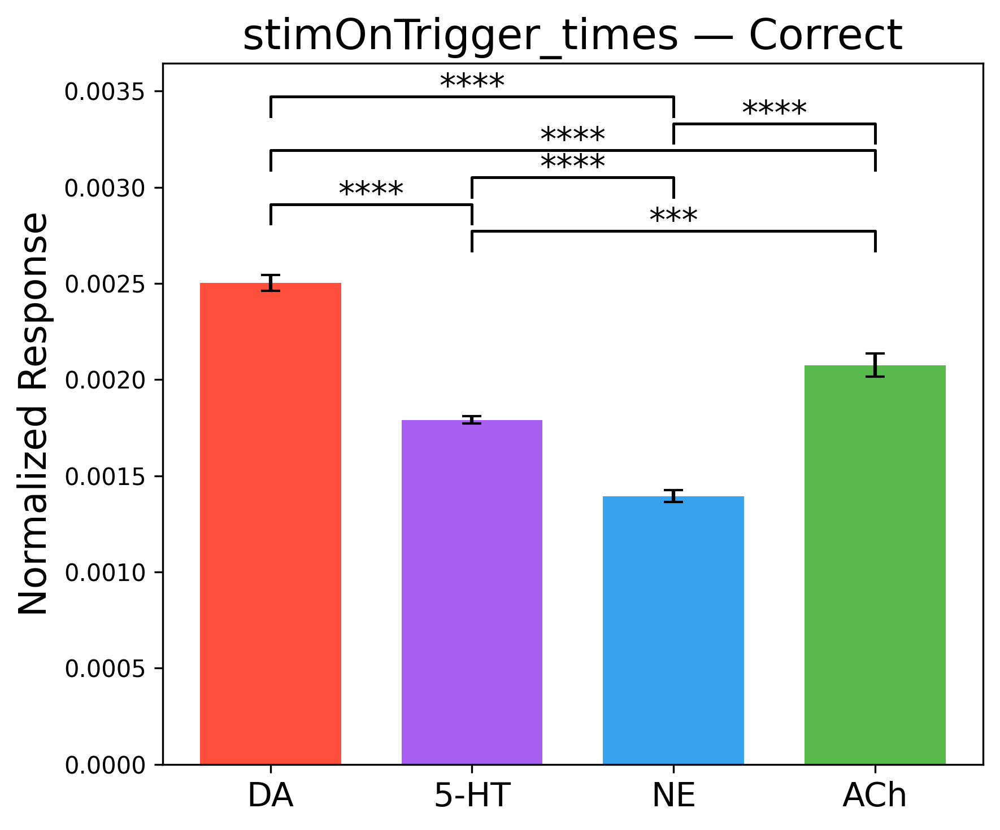

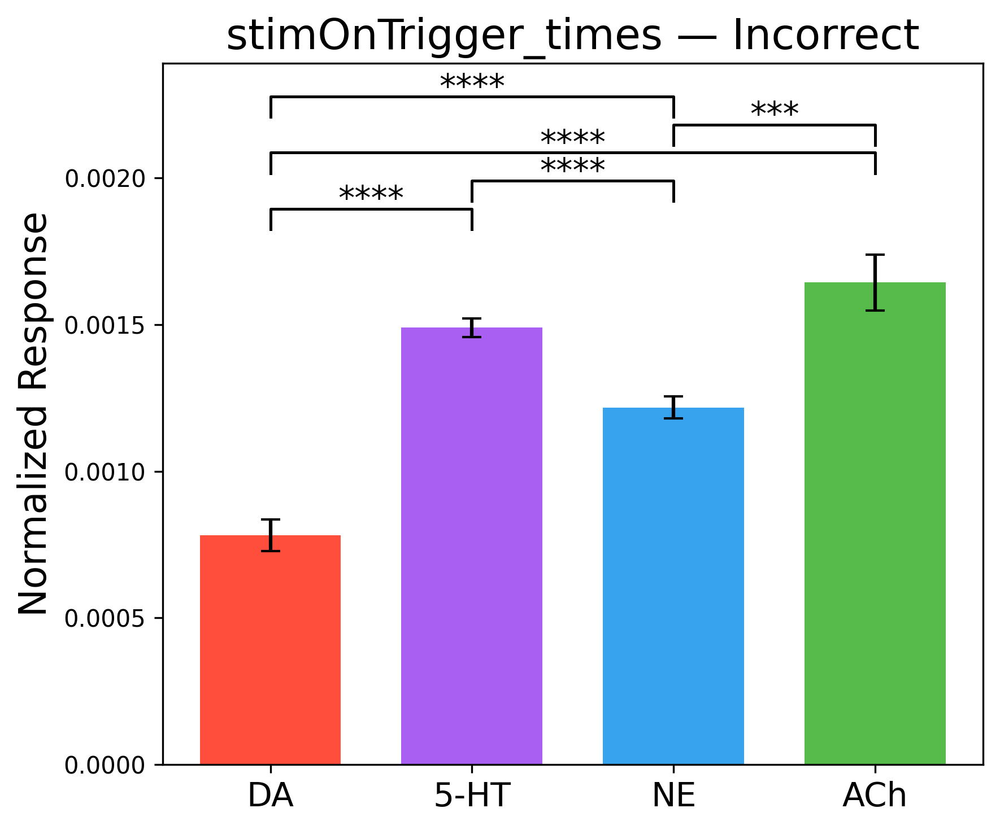

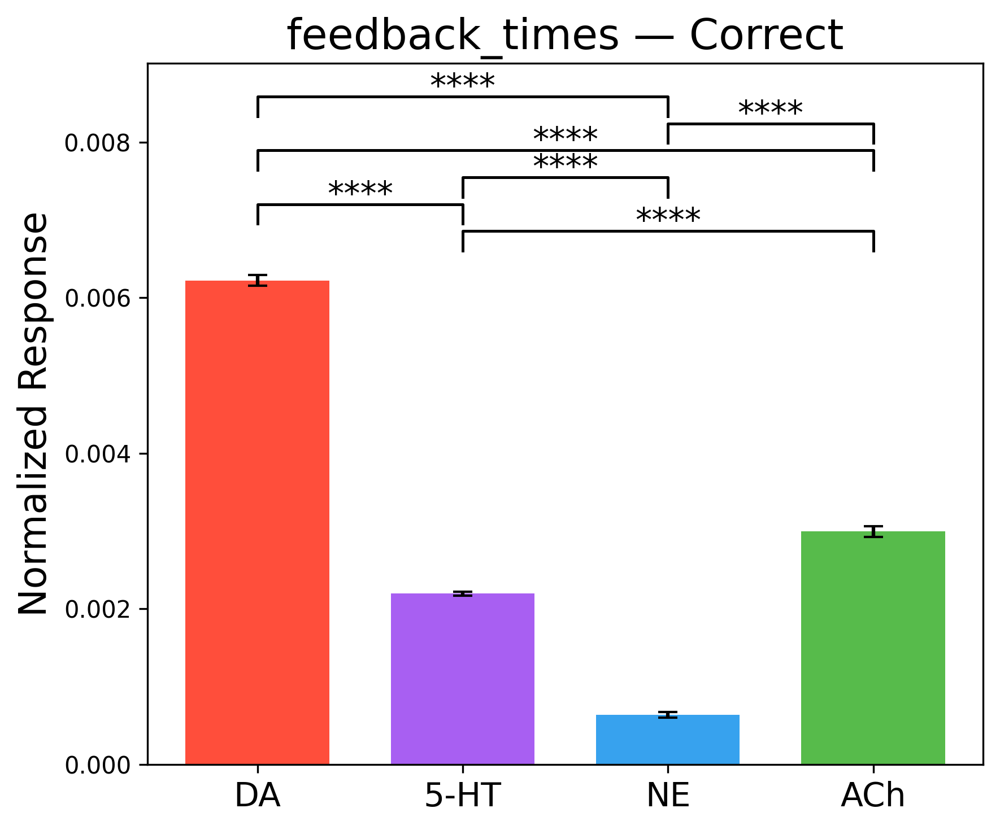

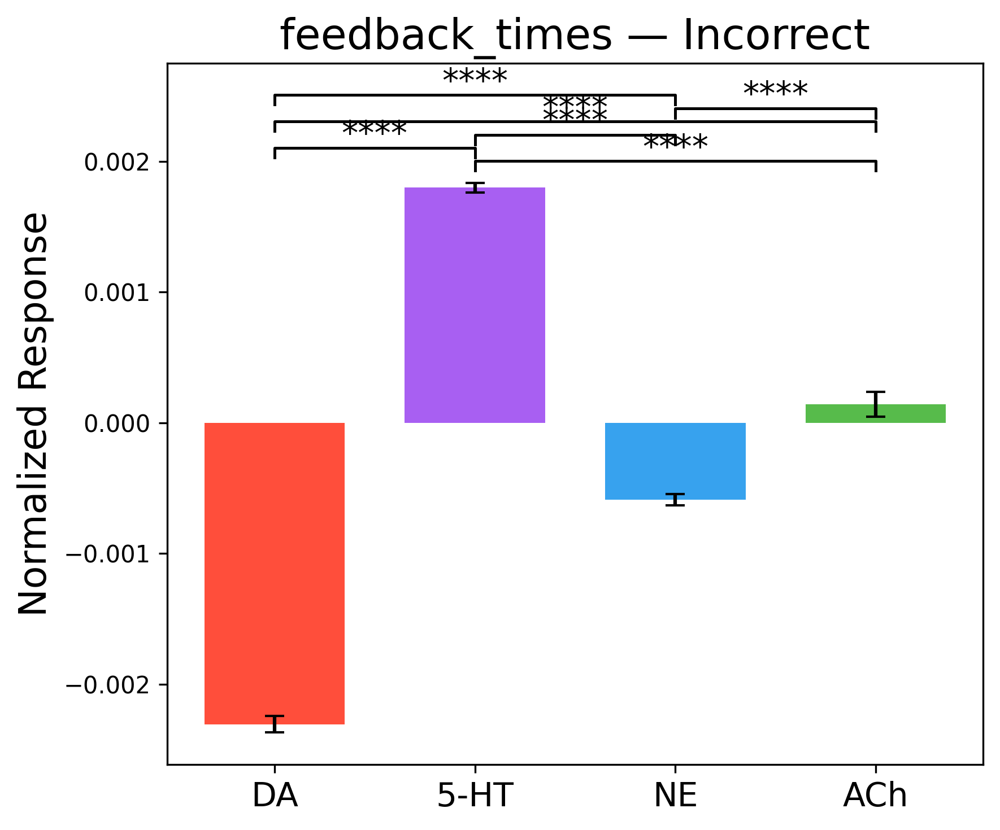

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import pingouin as pg

# ============================
# Helpers
# ============================
def pad_to_match_length(arr, target_length):
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def interpolate_to_common_time(psth, current_rate, target_rate, PERIEVENT_WINDOW):
    from scipy.interpolate import interp1d
    old_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth.shape[0])
    new_len = int((PERIEVENT_WINDOW[1] - PERIEVENT_WINDOW[0]) * target_rate) + 1
    new_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], new_len)
    interp = interp1d(old_time, psth, axis=0, kind='linear')
    return interp(new_time)

def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# ============================
# Load Data
# ============================
def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    combined_psth = []
    combined_trials = []
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')

            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                psth = interpolate_to_common_time(psth, 15, 30, PERIEVENT_WINDOW)
                df_trials = pd.read_parquet(df_trials_path_15)
            else:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)

        except Exception as e:
            print(f"Error loading {mouse} {event}: {e}")

    if combined_psth and combined_trials:
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        return None, None

# ============================
# Plotting function
# ============================
def plot_NM_barplot(df_values, event_label, feedback_label, color_palette):
    nms = df_values['group_name'].unique()
    means = df_values.groupby('group_name')['value'].mean().reindex(nms).values
    sems = df_values.groupby('group_name')['value'].sem().reindex(nms).values
    colors = [color_palette[nm] for nm in nms]

    x = np.arange(len(nms))
    bar_width = 0.7

    fig, ax = plt.subplots(figsize=(6, 5), dpi=300)
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    # ANOVA + Tukey
    aov = pg.anova(data=df_values, dv='value', between='group_name', detailed=True)
    posthoc = pg.pairwise_tukey(data=df_values, dv='value', between='group_name')

    y_max = np.max(means + sems)
    y_offset = y_max * 0.05
    current_y = y_max + y_offset
    label_to_x = {label: xi for label, xi in zip(nms, x)} 

    for _, row in posthoc.iterrows():
        if row['p-tukey'] < 0.05:
            i1, i2 = label_to_x[row['A']], label_to_x[row['B']]
            x1, x2 = min(i1, i2), max(i1, i2)
            ax.plot([x1, x1, x2, x2],
                    [current_y, current_y + y_offset * 0.8, current_y + y_offset * 0.8, current_y],
                    lw=1.2, c='black')
            ax.text((x1 + x2) / 2, current_y + y_offset * 0.5, p_to_stars(row['p-tukey']),
                    ha='center', va='bottom', fontsize=14)
            current_y += y_offset * 1.1

    ax.set_xticks(x)
    ax.set_xticklabels(nms, fontsize=14)
    ax.set_ylabel("Normalized Response", fontsize=16)
    ax.set_title(f"{event_label} — {feedback_label}", fontsize=18)
    plt.tight_layout()
    # Save figure
    # if not os.path.exists('/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/'):
    #     os.makedirs('/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/')

    filename_base = f"/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/barplot_18072025_2_{event_label}_{feedback_label}_final"
    plt.savefig(filename_base + ".png", dpi=300, bbox_inches='tight')
    plt.savefig(filename_base + ".pdf", dpi=300, bbox_inches='tight')
    plt.show()

# ============================
# Main Analysis
# ============================
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
}
color_palette = {
    "DA": "#FF3B25",
    "5-HT": "#9F4DF1",
    "NE": "#2198ED",
    "ACh": "#45B437"
}

path_to_data = "/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions"
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
PERIEVENT_WINDOW = [-1, 2]

events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

for event in events:
    for fb_label, fb_code in feedback_types.items():
        all_data = []
        for group_name, group_mice in groups.items():
            psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW)
            if psth_combined is None:
                continue
            if psth_combined.shape[0] == 91:
                psth_combined = psth_combined.T

            idx = df_trials_combined['feedbackType'].values == fb_code
            psth_subset = psth_combined[idx]
            if psth_subset.shape[0] < 5:
                continue

            baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
            # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
            aligned = psth_subset - baseline
            # normalized = aligned / (np.abs(baseline_std) + 1e-6)
            normalized = aligned
            response = np.mean(normalized[:, response_idx], axis=1)

            for val in response:
                all_data.append({'value': val, 'group_name': group_name})

        df_values = pd.DataFrame(all_data)
        if df_values.empty:
            print(f"No data for {event} {fb_label}")
            continue
        plot_NM_barplot(df_values, event, fb_label, color_palette)



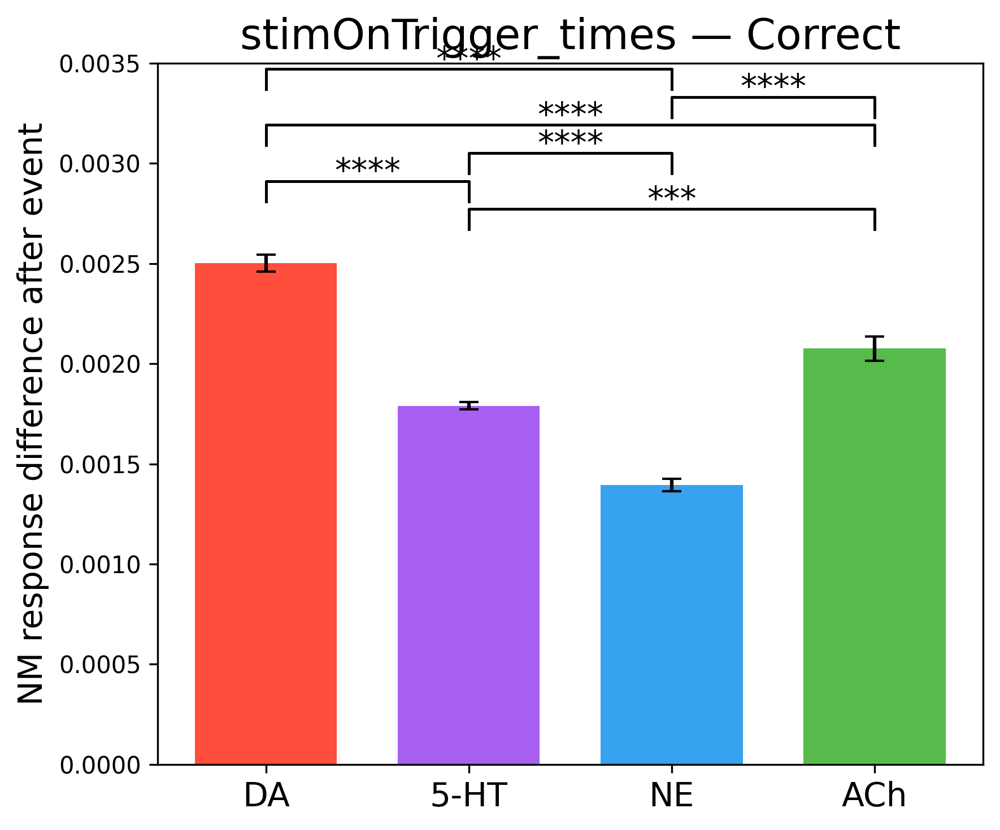

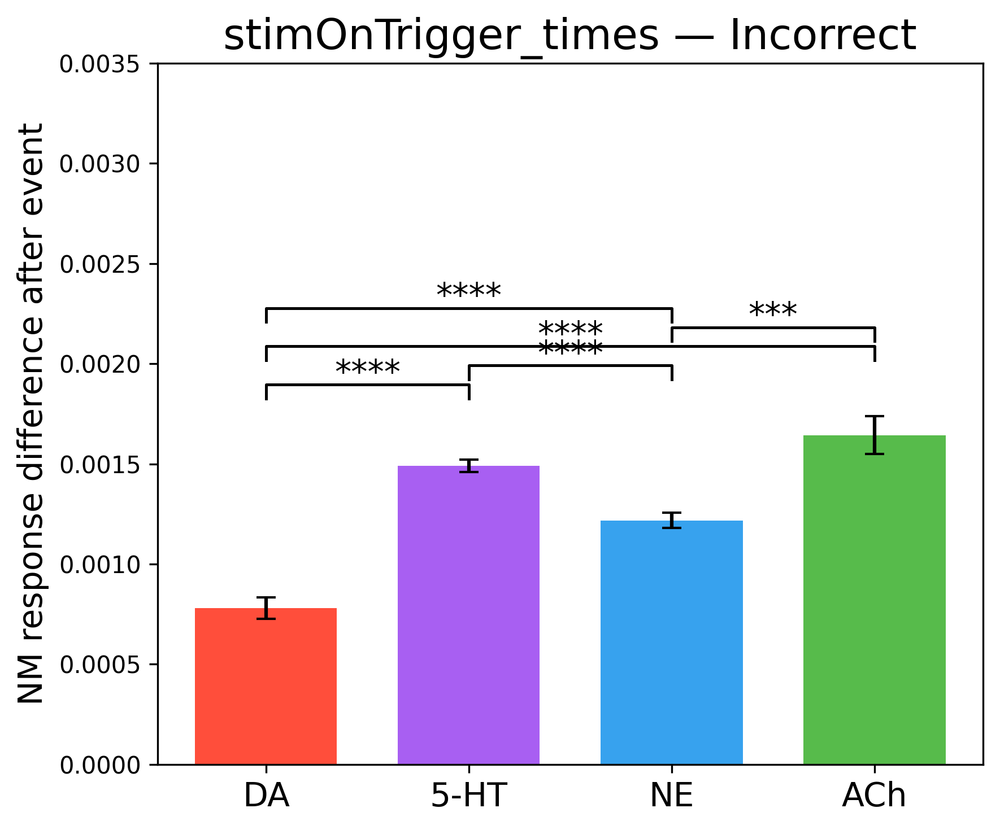

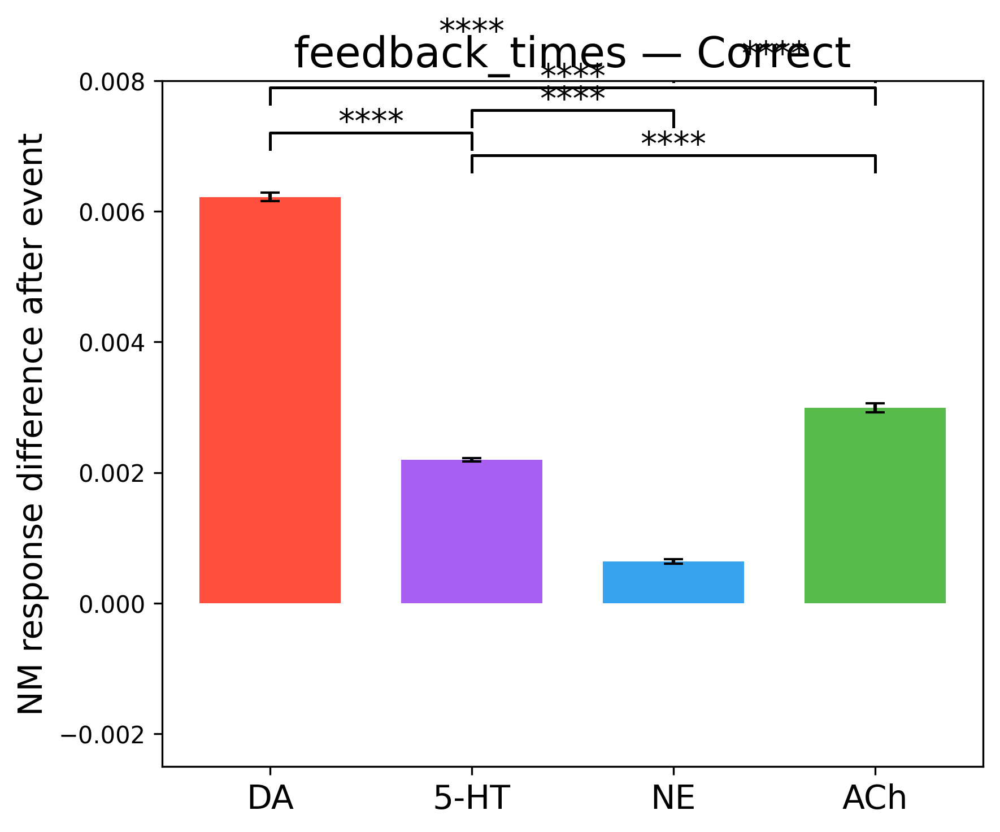

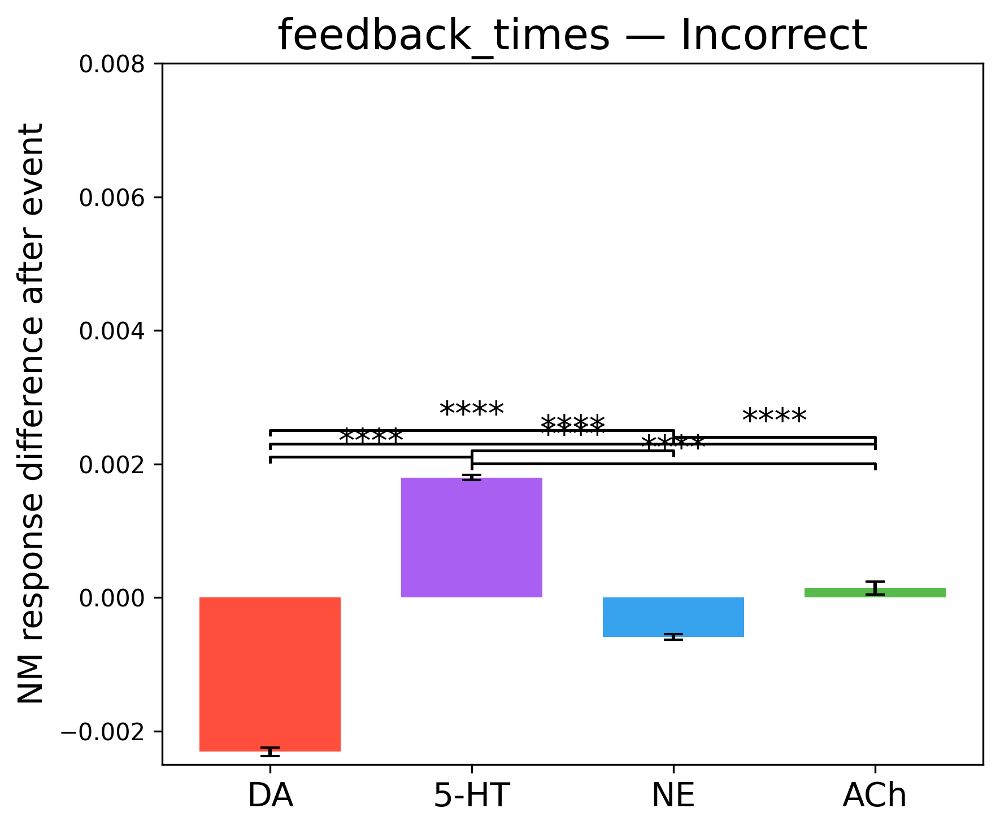

In [10]:
""" same but with ylim by event """
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import pingouin as pg

# ============================
# Helpers
# ============================
def pad_to_match_length(arr, target_length):
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def interpolate_to_common_time(psth, current_rate, target_rate, PERIEVENT_WINDOW):
    from scipy.interpolate import interp1d
    old_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth.shape[0])
    new_len = int((PERIEVENT_WINDOW[1] - PERIEVENT_WINDOW[0]) * target_rate) + 1
    new_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], new_len)
    interp = interp1d(old_time, psth, axis=0, kind='linear')
    return interp(new_time)

def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

# ============================
# Load Data
# ============================
def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    combined_psth = []
    combined_trials = []
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')

            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                psth = interpolate_to_common_time(psth, 15, 30, PERIEVENT_WINDOW)
                df_trials = pd.read_parquet(df_trials_path_15)
            else:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)

        except Exception as e:
            print(f"Error loading {mouse} {event}: {e}")

    if combined_psth and combined_trials:
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        return None, None

# ============================
# Plotting function
# ============================
def plot_NM_barplot(df_values, event_label, feedback_label, color_palette, ylim=None):
    nms = df_values['group_name'].unique()
    means = df_values.groupby('group_name')['value'].mean().reindex(nms).values
    sems = df_values.groupby('group_name')['value'].sem().reindex(nms).values
    colors = [color_palette[nm] for nm in nms]

    x = np.arange(len(nms))
    bar_width = 0.7

    fig, ax = plt.subplots(figsize=(6, 5), dpi=300)
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    # ANOVA + Tukey
    aov = pg.anova(data=df_values, dv='value', between='group_name', detailed=True)
    posthoc = pg.pairwise_tukey(data=df_values, dv='value', between='group_name')

    y_max = np.max(means + sems)
    y_offset = y_max * 0.05
    current_y = y_max + y_offset
    label_to_x = {label: xi for label, xi in zip(nms, x)}

    for _, row in posthoc.iterrows():
        if row['p-tukey'] < 0.05:
            i1, i2 = label_to_x[row['A']], label_to_x[row['B']]
            x1, x2 = min(i1, i2), max(i1, i2)
            ax.plot([x1, x1, x2, x2],
                    [current_y, current_y + y_offset * 0.8, current_y + y_offset * 0.8, current_y],
                    lw=1.2, c='black')
            ax.text((x1 + x2) / 2, current_y + y_offset * 0.5, p_to_stars(row['p-tukey']),
                    ha='center', va='bottom', fontsize=14)
            current_y += y_offset * 1.1

    ax.set_xticks(x)
    ax.set_xticklabels(nms, fontsize=14)
    ax.set_ylabel("NM response difference after event", fontsize=14)
    ax.set_title(f"{event_label} — {feedback_label}", fontsize=18)
    if ylim is not None:
        ax.set_ylim(ylim)
    plt.tight_layout()

    filename_base = f"/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/barplot_18072025_2_{event_label}_{feedback_label}_final"
    plt.savefig(filename_base + ".png", dpi=300, bbox_inches='tight')
    plt.savefig(filename_base + ".pdf", dpi=300, bbox_inches='tight')
    plt.show()

# ============================
# Main Analysis
# ============================
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
}
color_palette = {
    "DA": "#FF3B25",
    "5-HT": "#9F4DF1",
    "NE": "#2198ED",
    "ACh": "#45B437"
}

path_to_data = "/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions"
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
PERIEVENT_WINDOW = [-1, 2]

events = ['stimOnTrigger_times', 'feedback_times']
feedback_types = {'Correct': 1, 'Incorrect': -1}

for event in events:
    # Pick ylim depending on event
    if event == 'stimOnTrigger_times':
        # custom_ylim = (0, 1.5)
        custom_ylim = (0, 0.0035)
    elif event == 'feedback_times':
        # custom_ylim = (-0.5, 3)
        custom_ylim = (-0.0025, 0.008)
    else:
        custom_ylim = None

    for fb_label, fb_code in feedback_types.items():
        all_data = []
        for group_name, group_mice in groups.items():
            psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW)
            if psth_combined is None:
                continue
            if psth_combined.shape[0] == 91:
                psth_combined = psth_combined.T

            idx = df_trials_combined['feedbackType'].values == fb_code
            psth_subset = psth_combined[idx]
            if psth_subset.shape[0] < 5:
                continue

            baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
            # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
            aligned = psth_subset - baseline
            # normalized = aligned / (np.abs(baseline_std) + 1e-6)
            normalized = aligned
            response = np.mean(normalized[:, response_idx], axis=1)

            for val in response:
                all_data.append({'value': val, 'group_name': group_name})

        df_values = pd.DataFrame(all_data)
        if df_values.empty:
            print(f"No data for {event} {fb_label}")
            continue
        plot_NM_barplot(df_values, event, fb_label, color_palette, ylim=custom_ylim)


In [ ]:
# """ same as above but with * and [ adjusted """
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# import os
# import pingouin as pg

# # ============================
# # Helpers
# # ============================
# def pad_to_match_length(arr, target_length):
#     current_length = arr.shape[0]
#     if current_length == target_length:
#         return arr
#     elif current_length < target_length:
#         padding = target_length - current_length
#         return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
#     else:
#         return arr[:target_length, :]

# def interpolate_to_common_time(psth, current_rate, target_rate, PERIEVENT_WINDOW):
#     from scipy.interpolate import interp1d
#     old_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth.shape[0])
#     new_len = int((PERIEVENT_WINDOW[1] - PERIEVENT_WINDOW[0]) * target_rate) + 1
#     new_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], new_len)
#     interp = interp1d(old_time, psth, axis=0, kind='linear')
#     return interp(new_time)

# def p_to_stars(p):
#     if p < 0.0001:
#         return '****'
#     elif p < 0.001:
#         return '***'
#     elif p < 0.01:
#         return '**'
#     elif p < 0.05:
#         return '*'
#     else:
#         return ''

# # ============================
# # Load Data
# # ============================
# def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
#     combined_psth = []
#     combined_trials = []
#     max_time_length = 0

#     for mouse in group_mice:
#         try:
#             psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
#             psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
#             df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
#             df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')

#             if os.path.exists(psth_path_30):
#                 psth = np.load(psth_path_30)
#                 df_trials = pd.read_parquet(df_trials_path_30)
#             elif os.path.exists(psth_path_15):
#                 psth = np.load(psth_path_15)
#                 psth = interpolate_to_common_time(psth, 15, 30, PERIEVENT_WINDOW)
#                 df_trials = pd.read_parquet(df_trials_path_15)
#             else:
#                 continue

#             max_time_length = max(max_time_length, psth.shape[0])
#             combined_psth.append(psth)
#             combined_trials.append(df_trials)

#         except Exception as e:
#             print(f"Error loading {mouse} {event}: {e}")

#     if combined_psth and combined_trials:
#         combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
#         psth_combined = np.concatenate(combined_psth, axis=1)
#         df_trials_combined = pd.concat(combined_trials, ignore_index=True)
#         return psth_combined, df_trials_combined
#     else:
#         return None, None

# # ============================
# # Plotting function
# # ============================
# """ same as previous code, but checking the * and [ space """
# def plot_NM_barplot(df_values, event_label, feedback_label, color_palette, ylim=None):
#     nms = df_values['group_name'].unique()
#     means = df_values.groupby('group_name')['value'].mean().reindex(nms).values
#     sems = df_values.groupby('group_name')['value'].sem().reindex(nms).values
#     colors = [color_palette[nm] for nm in nms]

#     x = np.arange(len(nms))
#     bar_width = 0.7

#     fig, ax = plt.subplots(figsize=(6, 5), dpi=300)
#     for i in range(len(x)):
#         ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

#     # ANOVA + Tukey
#     aov = pg.anova(data=df_values, dv='value', between='group_name', detailed=True)
#     posthoc = pg.pairwise_tukey(data=df_values, dv='value', between='group_name')

#     y_max = np.max(means + sems)
#     if ylim:
#         y_top = ylim[1]
#     else:
#         y_top = y_max * 1.3

#     # Define spacing
#     base_offset = (y_top - y_max) * 0.05
#     if base_offset < 0.05:
#         base_offset = 0.05

#     # Start just above bars
#     current_y = y_max + base_offset

#     # Sort comparisons by span width to avoid overlaps
#     comparisons = []
#     label_to_x = {label: xi for label, xi in zip(nms, x)}
#     for _, row in posthoc.iterrows():
#         if row['p-tukey'] < 0.05:
#             i1, i2 = label_to_x[row['A']], label_to_x[row['B']]
#             comparisons.append((abs(i2 - i1), i1, i2, p_to_stars(row['p-tukey'])))
#     comparisons.sort()

#     # Draw each comparison higher than the last
#     for _, i1, i2, stars in comparisons:
#         x1, x2 = min(i1, i2), max(i1, i2)
#         # Line
#         ax.plot(
#             [x1, x1, x2, x2],
#             [current_y, current_y + 0.02, current_y + 0.02, current_y],
#             lw=1.2, c='black'
#         )
#         # Stars
#         ax.text(
#             (x1 + x2) / 2,
#             current_y + 0.025,
#             stars,
#             ha='center',
#             va='bottom',
#             fontsize=14
#         )
#         # Increment for next comparison
#         current_y += base_offset * 2.0

#     ax.set_xticks(x)
#     ax.set_xticklabels(nms, fontsize=14)
#     ax.set_ylabel("Normalized Response", fontsize=16)
#     ax.set_title(f"{event_label} — {feedback_label}", fontsize=18)
#     if ylim is not None:
#         ax.set_ylim(ylim)
#     else:
#         ax.set_ylim(top=current_y + base_offset)
#     plt.tight_layout()

#     filename_base = f"/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/barplot_18072025_3_{event_label}_{feedback_label}_final"
#     plt.savefig(filename_base + ".png", dpi=300, bbox_inches='tight')
#     plt.savefig(filename_base + ".pdf", dpi=300, bbox_inches='tight')
#     plt.show()




# # ============================
# # Main Analysis
# # ============================
# groups = {
#     "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
#     "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
#     "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
#     "ACh": ["ZFM-06305_L", "ZFM-06948"]
# }
# color_palette = {
#     "DA": "#FF3B25",
#     "5-HT": "#9F4DF1",
#     "NE": "#2198ED",
#     "ACh": "#45B437"
# }

# path_to_data = "/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions"
# time_vector = np.linspace(-1, 2, 91)
# baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
# response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
# PERIEVENT_WINDOW = [-1, 2]

# events = ['stimOnTrigger_times', 'feedback_times']
# feedback_types = {'Correct': 1, 'Incorrect': -1}

# for event in events:
#     # Pick ylim depending on event
#     if event == 'stimOnTrigger_times':
#         # custom_ylim = (0, 1.5)
#         custom_ylim = (0, 0.0035)
#     elif event == 'feedback_times':
#         # custom_ylim = (-0.5, 3)
#         custom_ylim = (-0.0025, 0.008)
#     else:
#         custom_ylim = None

#     for fb_label, fb_code in feedback_types.items():
#         all_data = []
#         for group_name, group_mice in groups.items():
#             psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW)
#             if psth_combined is None:
#                 continue
#             if psth_combined.shape[0] == 91:
#                 psth_combined = psth_combined.T

#             idx = df_trials_combined['feedbackType'].values == fb_code
#             psth_subset = psth_combined[idx]
#             if psth_subset.shape[0] < 5:
#                 continue

#             baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
#             # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
#             aligned = psth_subset - baseline
#             # normalized = aligned / (np.abs(baseline_std) + 1e-6)
#             normalized = aligned
#             response = np.mean(normalized[:, response_idx], axis=1)

#             for val in response:
#                 all_data.append({'value': val, 'group_name': group_name})

#         df_values = pd.DataFrame(all_data)
#         if df_values.empty:
#             print(f"No data for {event} {fb_label}")
#             continue
#         plot_NM_barplot(df_values, event, fb_label, color_palette, ylim=custom_ylim)


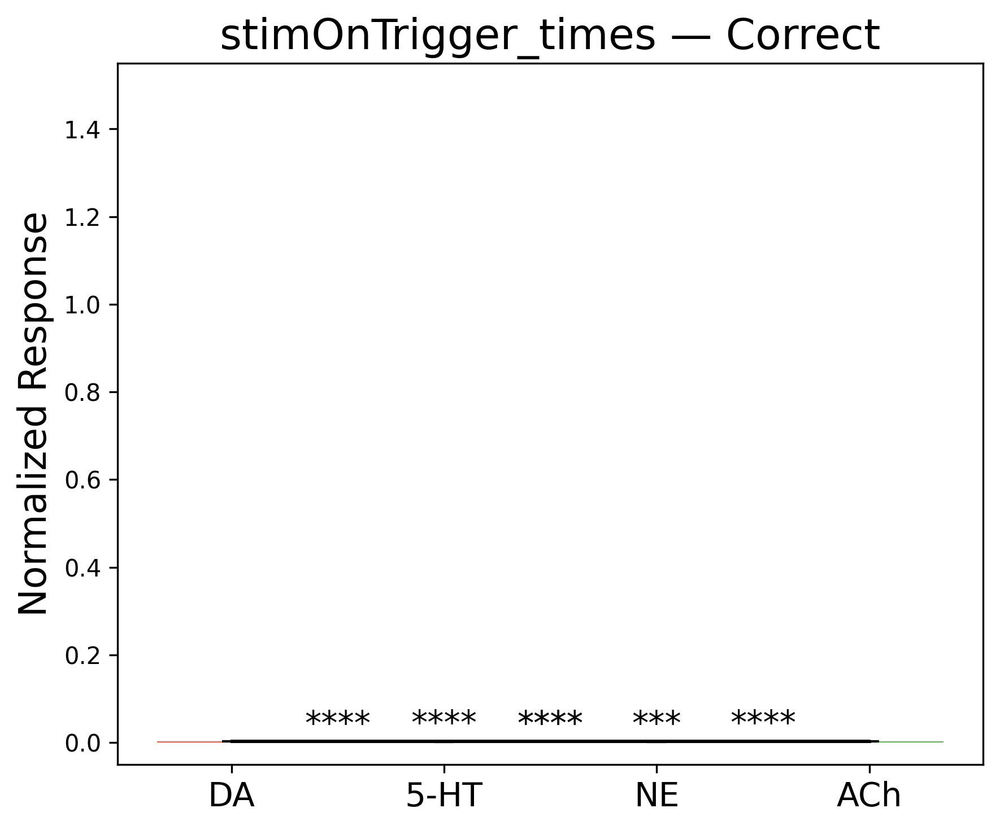

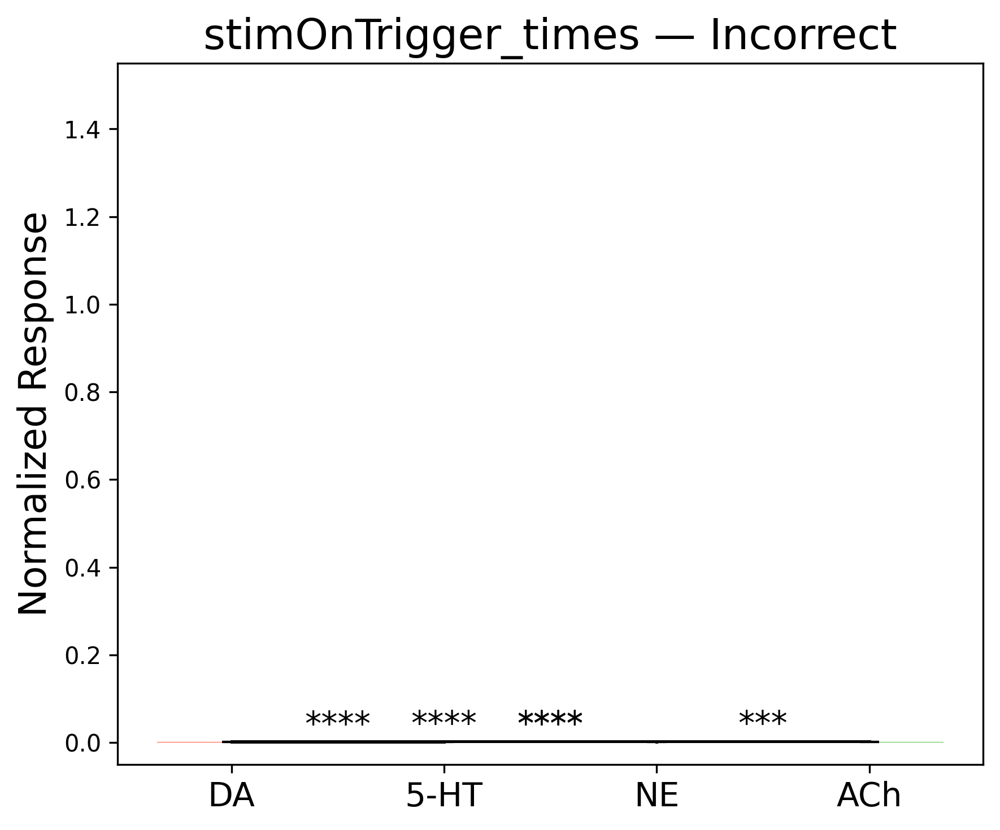

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import pingouin as pg

# ============================
# Helpers
# ============================
def pad_to_match_length(arr, target_length):
    current_length = arr.shape[0]
    if current_length == target_length:
        return arr
    elif current_length < target_length:
        padding = target_length - current_length
        return np.pad(arr, ((0, padding), (0, 0)), mode='constant')
    else:
        return arr[:target_length, :]

def interpolate_to_common_time(psth, current_rate, target_rate, PERIEVENT_WINDOW):
    from scipy.interpolate import interp1d
    old_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], psth.shape[0])
    new_len = int((PERIEVENT_WINDOW[1] - PERIEVENT_WINDOW[0]) * target_rate) + 1
    new_time = np.linspace(PERIEVENT_WINDOW[0], PERIEVENT_WINDOW[1], new_len)
    interp = interp1d(old_time, psth, axis=0, kind='linear')
    return interp(new_time)

def p_to_stars(p):
    if p < 0.0001:
        return '****'
    elif p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

def load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW):
    combined_psth = []
    combined_trials = []
    max_time_length = 0

    for mouse in group_mice:
        try:
            psth_path_30 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_30Hz.npy')
            psth_path_15 = os.path.join(path_to_data, f'psth_{mouse}_{event}_allsessions_15Hz.npy')
            df_trials_path_30 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_30Hz.pqt')
            df_trials_path_15 = os.path.join(path_to_data, f'df_trials_{mouse}_{event}_allsessions_15Hz.pqt')

            if os.path.exists(psth_path_30):
                psth = np.load(psth_path_30)
                df_trials = pd.read_parquet(df_trials_path_30)
            elif os.path.exists(psth_path_15):
                psth = np.load(psth_path_15)
                psth = interpolate_to_common_time(psth, 15, 30, PERIEVENT_WINDOW)
                df_trials = pd.read_parquet(df_trials_path_15)
            else:
                continue

            max_time_length = max(max_time_length, psth.shape[0])
            combined_psth.append(psth)
            combined_trials.append(df_trials)

        except Exception as e:
            print(f"Error loading {mouse} {event}: {e}")

    if combined_psth and combined_trials:
        combined_psth = [pad_to_match_length(psth, max_time_length) for psth in combined_psth]
        psth_combined = np.concatenate(combined_psth, axis=1)
        df_trials_combined = pd.concat(combined_trials, ignore_index=True)
        return psth_combined, df_trials_combined
    else:
        return None, None

def plot_NM_barplot(df_values, event_label, feedback_label, color_palette, ylim=None):
    nms = df_values['group_name'].unique()
    means = df_values.groupby('group_name')['value'].mean().reindex(nms).values
    sems = df_values.groupby('group_name')['value'].sem().reindex(nms).values
    colors = [color_palette[nm] for nm in nms]

    x = np.arange(len(nms))
    bar_width = 0.7

    fig, ax = plt.subplots(figsize=(6, 5), dpi=300)
    for i in range(len(x)):
        ax.bar(x[i], means[i], width=bar_width, yerr=sems[i], color=colors[i], alpha=0.9, capsize=4)

    aov = pg.anova(data=df_values, dv='value', between='group_name', detailed=True)
    posthoc = pg.pairwise_tukey(data=df_values, dv='value', between='group_name')

    y_max = np.max(means + sems)
    y_offset = y_max * 0.05
    current_y = y_max + y_offset
    label_to_x = {label: xi for label, xi in zip(nms, x)}

    for _, row in posthoc.iterrows():
        if row['p-tukey'] < 0.05:
            i1, i2 = label_to_x[row['A']], label_to_x[row['B']]
            x1, x2 = min(i1, i2), max(i1, i2)
            ax.plot([x1, x1, x2, x2],
                    [current_y, current_y + y_offset * 0.8, current_y + y_offset * 0.8, current_y],
                    lw=1.2, c='black')
            ax.text((x1 + x2) / 2, current_y + y_offset * 0.5, p_to_stars(row['p-tukey']),
                    ha='center', va='bottom', fontsize=14)
            current_y += y_offset * 1.1

    ax.set_xticks(x)
    ax.set_xticklabels(nms, fontsize=14)
    ax.set_ylabel("Normalized Response", fontsize=16)
    ax.set_title(f"{event_label} — {feedback_label}", fontsize=18)
    if ylim is not None:
        ax.set_ylim(ylim)
    plt.tight_layout()
    plt.show()

# ============================
# Main
# ============================
groups = {
    "DA": ["ZFM-03447", "ZFM-04026", "ZFM-04022_R", "ZFM-03448", "ZFM-04019", "ZFM-04022_L"],
    "5-HT": ["ZFM-03059", "ZFM-03065", "ZFM-03061", "ZFM-03062", "ZFM-04392_DRN", "ZFM-05235", "ZFM-05236", "ZFM-05245", "ZFM-05248"],
    "NE": ["ZFM-04533", "ZFM-04534_LC", "ZFM-06268", "ZFM-06271", "ZFM-06272_L", "ZFM-06272_R", "ZFM-06171", "ZFM-06275_L", "ZFM-06275_R"],
    "ACh": ["ZFM-06305_L", "ZFM-06948"]
}
color_palette = {
    "DA": "#FF3B25",
    "5-HT": "#9F4DF1",
    "NE": "#2198ED",
    "ACh": "#45B437"
}

path_to_data = "/home/kceniabougrova/Documents/NM_project_fromIBLserver/Good_sessions"
time_vector = np.linspace(-1, 2, 91)
baseline_idx = np.where((time_vector >= -0.2) & (time_vector < 0))[0]
response_idx = np.where((time_vector >= 0) & (time_vector < 0.5))[0]
PERIEVENT_WINDOW = [-1, 2]

event = 'stimOnTrigger_times'
feedback_types = {'Correct': 1, 'Incorrect': -1}

# Collect data
all_y_values = []
all_df_values = {}
for fb_label, fb_code in feedback_types.items():
    all_data = []
    for group_name, group_mice in groups.items():
        psth_combined, df_trials_combined = load_group_data(group_mice, event, path_to_data, PERIEVENT_WINDOW)
        if psth_combined is None:
            continue
        if psth_combined.shape[0] == 91:
            psth_combined = psth_combined.T

        idx = df_trials_combined['feedbackType'].values == fb_code
        psth_subset = psth_combined[idx]
        if psth_subset.shape[0] < 5:
            continue

        baseline = np.mean(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        # baseline_std = np.std(psth_subset[:, baseline_idx], axis=1, keepdims=True)
        aligned = psth_subset - baseline
        # normalized = aligned / (np.abs(baseline_std) + 1e-6)
        normalized = aligned
        response = np.mean(normalized[:, response_idx], axis=1)

        for val in response:
            all_data.append({'value': val, 'group_name': group_name})

    df_values = pd.DataFrame(all_data)
    if df_values.empty:
        print(f"No data for {event} {fb_label}")
        continue
    all_y_values.extend(df_values["value"].values)
    all_df_values[fb_label] = df_values

# Global ylim
ymin = min(0, np.percentile(all_y_values, 5))
ymax = np.percentile(all_y_values, 95) * 1.2
if ymax - ymin < 1:
    ymax = ymin + 1

# Plot
for fb_label, df_values in all_df_values.items():
    plot_NM_barplot(df_values, event, fb_label, color_palette, ylim=(-0.05, 1.55))

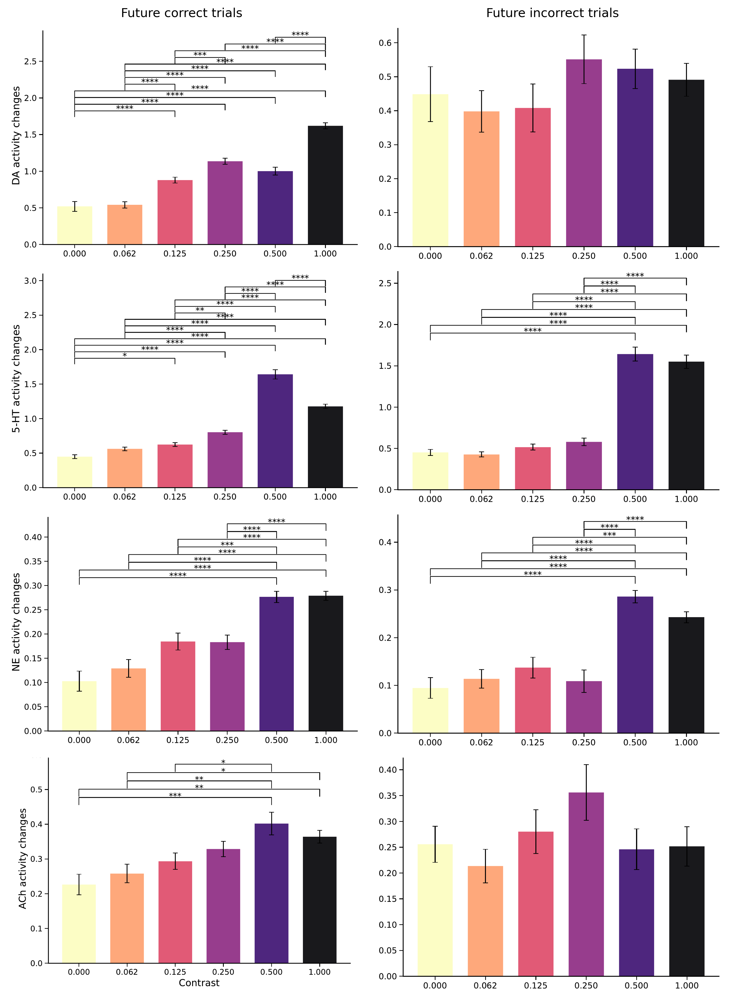

In [ ]:
""" USED - TO JOIN THE 8 PLOTS - CONTRASTS """ 

import matplotlib.pyplot as plt
from pdf2image import convert_from_path
from PIL import Image

# Define the figure paths and names
figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/'

# Figure names in the desired order
# figure_names = [
#     'barplot_DA_stimOnTrigger_times_Correct.pdf',
#     'barplot_DA_stimOnTrigger_times_Incorrect.pdf',
#     'barplot_5-HT_stimOnTrigger_times_Correct.pdf',
#     'barplot_5-HT_stimOnTrigger_times_Incorrect.pdf',
#     'barplot_NE_stimOnTrigger_times_Correct.pdf',
#     'barplot_NE_stimOnTrigger_times_Incorrect.pdf',
#     'barplot_ACh_stimOnTrigger_times_Correct.pdf',
#     'barplot_ACh_stimOnTrigger_times_Incorrect.pdf'
# ]

figure_names = [
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Incorrect.pdf'
]


# Create a figure with 4 rows and 2 columns
fig, axes = plt.subplots(4, 2, figsize=(10, 14), dpi=300)  # Increase figure height

# Flatten axes array for easy iteration
axes = axes.flatten()

# Define how much to crop from the top (e.g., 90 pixels)
crop_top = 90

# Define how much to crop from the bottom of the plots (for the first 3 rows)
crop_bottom = 65  # Adjust this value based on your needs

# Define how much to crop from the left side of the second column
crop_left = 63  # Adjust this value as needed (in pixels)

# Loop over the images and add them to the subplots
for i, figure_name in enumerate(figure_names):
    img_path = figure_path + figure_name
    
    # Convert PDF to image (first page, as we assume each PDF is a single page)
    images = convert_from_path(img_path, first_page=1, last_page=1)
    
    # Get the first image from the list
    img = images[0]
    
    # Crop the image: (left, top, right, bottom)
    width, height = img.size
    
    # If in the second column (i = 1, 3, 5, 7), apply the left crop
    if i % 2 == 1:
        img_cropped = img.crop((crop_left, crop_top, width, height - crop_bottom))  # Crop left, top, and bottom
    else:
        if i < 6:  # Crop the bottom of the first 3 rows (i.e., indices 0, 1, 2, 3, 4, 5)
            img_cropped = img.crop((0, crop_top, width, height - crop_bottom))  # Crop from top and bottom
        else:
            img_cropped = img.crop((0, crop_top, width, height))  # Only crop from the top for the last row

    # Plot the cropped image in the appropriate subplot
    axes[i].imshow(img_cropped)
    axes[i].axis('off')  # Hide axis for better appearance

# Adjust space at the top to prevent title overlap with the plots
fig.subplots_adjust(top=0.92)  # Adjust the top margin to create more space

# Add text at the top of the figure
fig.text(0.25, 0.95, 'Future correct trials', ha='center', fontsize=12)
fig.text(0.75, 0.95, 'Future incorrect trials', ha='center', fontsize=12)

# Adjust layout to avoid any overlap between subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Keeps the top part adjusted

# Save the final panel as a PDF
plt.savefig('/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Figure_Panel_Cropped_Adjusted_Left_Crop.pdf', format='pdf')
plt.show()

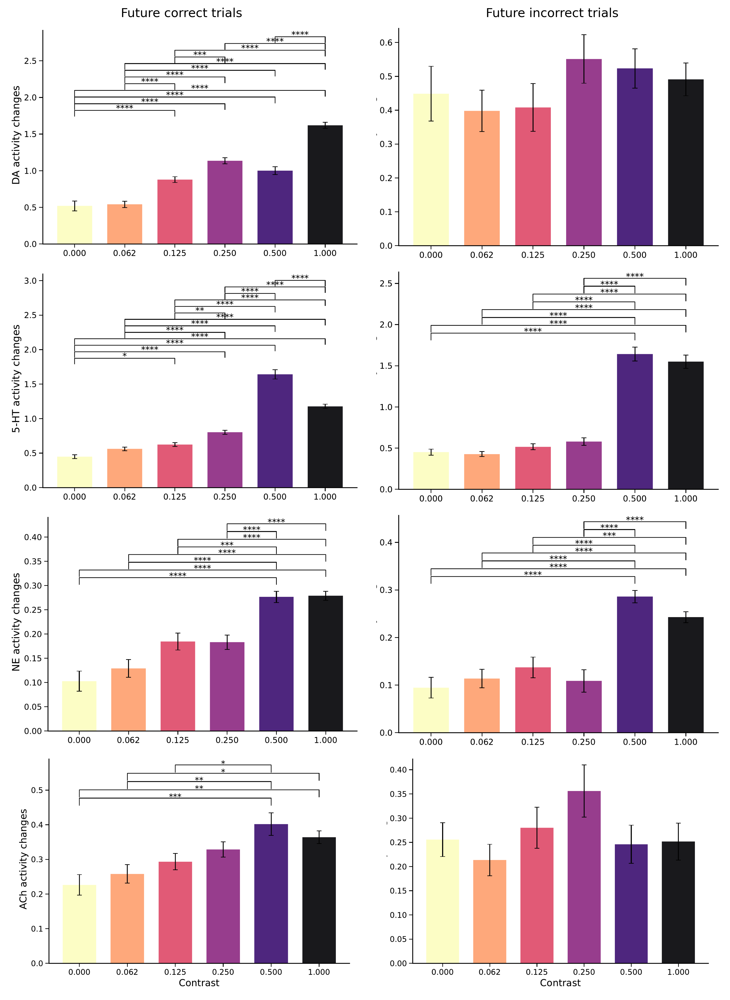

In [6]:
""" USED - WORKS - FOR CONTRASTS""" 
import matplotlib.pyplot as plt
from pdf2image import convert_from_path
from PIL import Image

# Define the figure paths and names
figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/'

# Figure names in the desired order
figure_names = [
    'barplot_DA_stimOnTrigger_times_Correct.pdf',
    'barplot_DA_stimOnTrigger_times_Incorrect.pdf',
    'barplot_5-HT_stimOnTrigger_times_Correct.pdf',
    'barplot_5-HT_stimOnTrigger_times_Incorrect.pdf',
    'barplot_NE_stimOnTrigger_times_Correct.pdf',
    'barplot_NE_stimOnTrigger_times_Incorrect.pdf',
    'barplot_ACh_stimOnTrigger_times_Correct.pdf',
    'barplot_ACh_stimOnTrigger_times_Incorrect.pdf'
]

# Create a figure with 4 rows and 2 columns
fig, axes = plt.subplots(4, 2, figsize=(10, 14), dpi=300)  # Increase figure height

# Flatten axes array for easy iteration
axes = axes.flatten()

# Define how much to crop from the top (e.g., 85 pixels)
crop_top = 90

# Define how much to crop from the bottom of the plots (for the first 3 rows)
crop_bottom = 65  # Adjust this value based on your needs

# Define how much to crop from the left for the second column
crop_left = 60  # Adjust this value as needed

# Loop over the images and add them to the subplots
for i, figure_name in enumerate(figure_names):
    img_path = figure_path + figure_name
    
    # Convert PDF to image (first page, as we assume each PDF is a single page)
    images = convert_from_path(img_path, first_page=1, last_page=1)
    
    # Get the first image from the list
    img = images[0]
    
    # Crop the image: (left, top, right, bottom)
    width, height = img.size
    
    # Apply left-side cropping to the second column (i = 1, 3, 5, 7)
    if i % 2 == 1:  # Check if it's in the second column (1, 3, 5, 7)
        if i == 7:  # For the last figure in the second column (4th row, 2nd column), don't crop the bottom
            img_cropped = img.crop((crop_left, crop_top, width, height))  # Crop left and top, no bottom crop
        else:
            img_cropped = img.crop((crop_left, crop_top, width, height - crop_bottom))  # Crop left, top, and bottom
    else:
        if i < 6:  # Crop the bottom of the first 3 rows (i.e., indices 0, 1, 2, 3, 4, 5)
            img_cropped = img.crop((0, crop_top, width, height - crop_bottom))  # Crop from top and bottom
        else:
            img_cropped = img.crop((0, crop_top, width, height))  # Only crop from the top for the last row

    # Plot the cropped image in the appropriate subplot
    axes[i].imshow(img_cropped)
    axes[i].axis('off')  # Hide axis for better appearance

# Adjust space at the top to prevent title overlap with the plots
fig.subplots_adjust(top=0.92)  # Adjust the top margin to create more space

# Add text at the top of the figure
fig.text(0.25, 0.95, 'Future correct trials', ha='center', fontsize=12)
fig.text(0.75, 0.95, 'Future incorrect trials', ha='center', fontsize=12)

# Adjust layout to avoid any overlap between subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Keeps the top part adjusted

# Save the final panel as a PDF
# plt.savefig('/home/kceniabougrova/Documents/Thesis_correction_figures/FINAL_CONTRASTS_Panel_Cropped_.pdf', format='pdf')
plt.show()


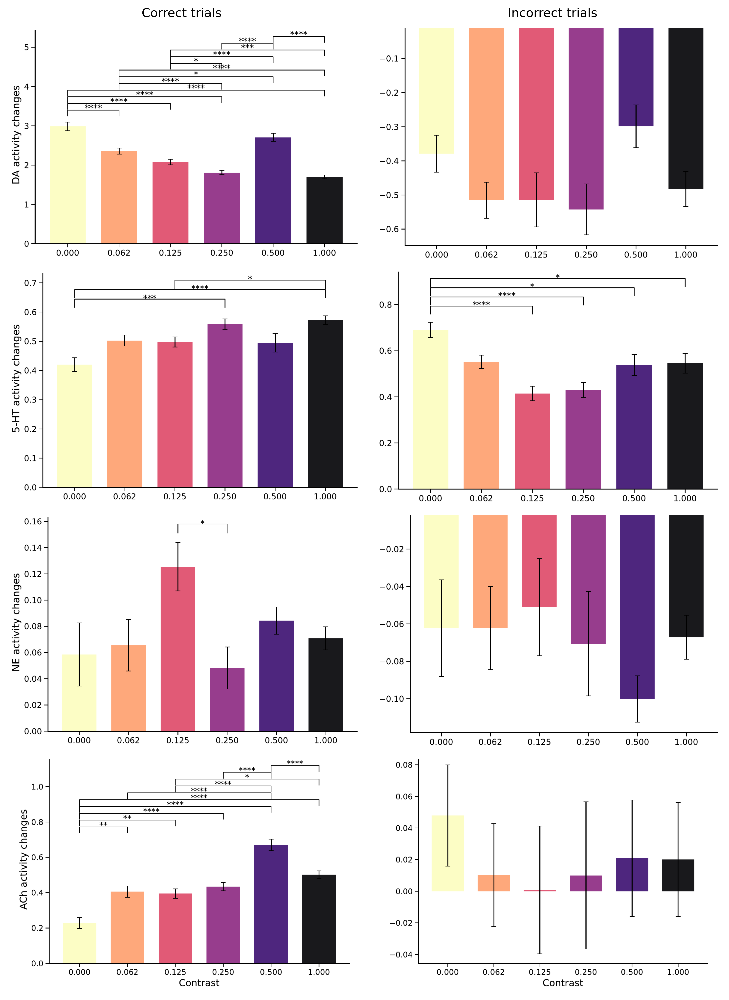

In [7]:
""" USED - same but for feedback_type """
import matplotlib.pyplot as plt
from pdf2image import convert_from_path
from PIL import Image

# Define the figure paths and names
figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/'

# Figure names in the desired order

figure_names = [
    'barplot_DA_feedback_times_Correct.pdf',
    'barplot_DA_feedback_times_Incorrect.pdf',
    'barplot_5-HT_feedback_times_Correct.pdf',
    'barplot_5-HT_feedback_times_Incorrect.pdf',
    'barplot_NE_feedback_times_Correct.pdf',
    'barplot_NE_feedback_times_Incorrect.pdf',
    'barplot_ACh_feedback_times_Correct.pdf',
    'barplot_ACh_feedback_times_Incorrect.pdf'
]


# Create a figure with 4 rows and 2 columns
fig, axes = plt.subplots(4, 2, figsize=(10, 14), dpi=300)  # Increase figure height

# Flatten axes array for easy iteration
axes = axes.flatten()

# Define how much to crop from the top (e.g., 85 pixels)
crop_top = 90

# Define how much to crop from the bottom of the plots (for the first 3 rows)
crop_bottom = 65  # Adjust this value based on your needs

# Define how much to crop from the left for the second column
crop_left = 68  # Adjust this value as needed

# Loop over the images and add them to the subplots
for i, figure_name in enumerate(figure_names):
    img_path = figure_path + figure_name
    
    # Convert PDF to image (first page, as we assume each PDF is a single page)
    images = convert_from_path(img_path, first_page=1, last_page=1)
    
    # Get the first image from the list
    img = images[0]
    
    # Crop the image: (left, top, right, bottom)
    width, height = img.size
    
    # Apply left-side cropping to the second column (i = 1, 3, 5, 7)
    if i % 2 == 1:  # Check if it's in the second column (1, 3, 5, 7)
        if i == 7:  # For the last figure in the second column (4th row, 2nd column), don't crop the bottom
            img_cropped = img.crop((crop_left, crop_top, width, height))  # Crop left and top, no bottom crop
        else:
            img_cropped = img.crop((crop_left, crop_top, width, height - crop_bottom))  # Crop left, top, and bottom
    else:
        if i < 6:  # Crop the bottom of the first 3 rows (i.e., indices 0, 1, 2, 3, 4, 5)
            img_cropped = img.crop((0, crop_top, width, height - crop_bottom))  # Crop from top and bottom
        else:
            img_cropped = img.crop((0, crop_top, width, height))  # Only crop from the top for the last row

    # Plot the cropped image in the appropriate subplot
    axes[i].imshow(img_cropped)
    axes[i].axis('off')  # Hide axis for better appearance

# Adjust space at the top to prevent title overlap with the plots
fig.subplots_adjust(top=0.92)  # Adjust the top margin to create more space

# Add text at the top of the figure
fig.text(0.25, 0.95, 'Correct trials', ha='center', fontsize=12)
fig.text(0.75, 0.95, 'Incorrect trials', ha='center', fontsize=12)

# Adjust layout to avoid any overlap between subplots
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Keeps the top part adjusted

# Save the final panel as a PDF
# plt.savefig('/home/kceniabougrova/Documents/Thesis_correction_figures/FINAL_CONTRASTS_feedback__Panel_Cropped.pdf', format='pdf')
plt.show()

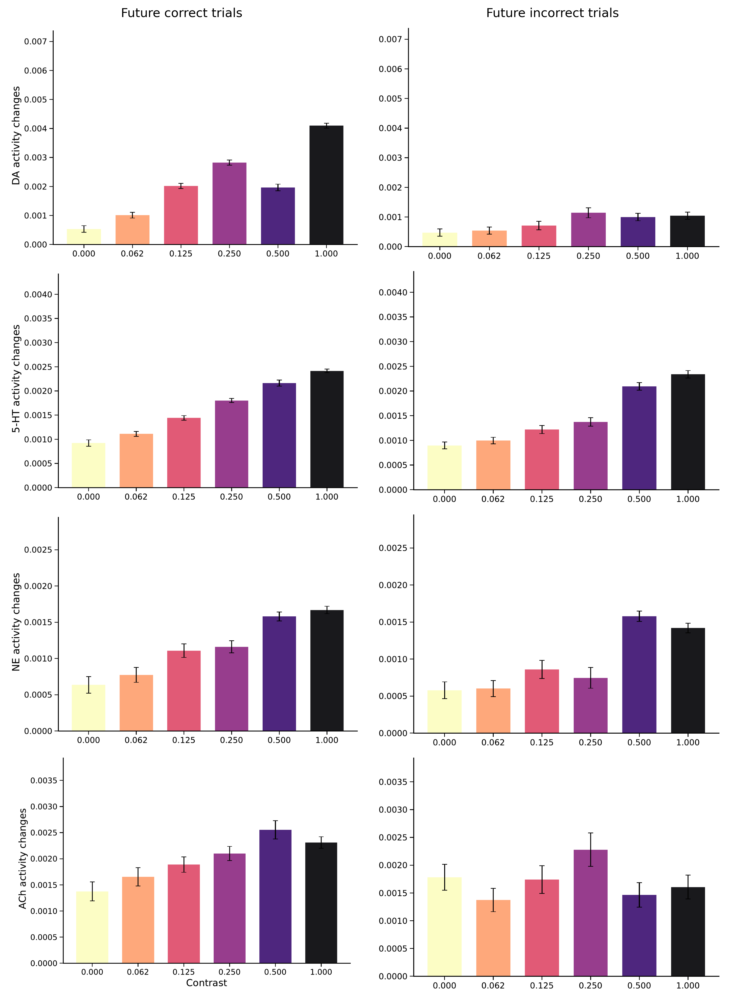

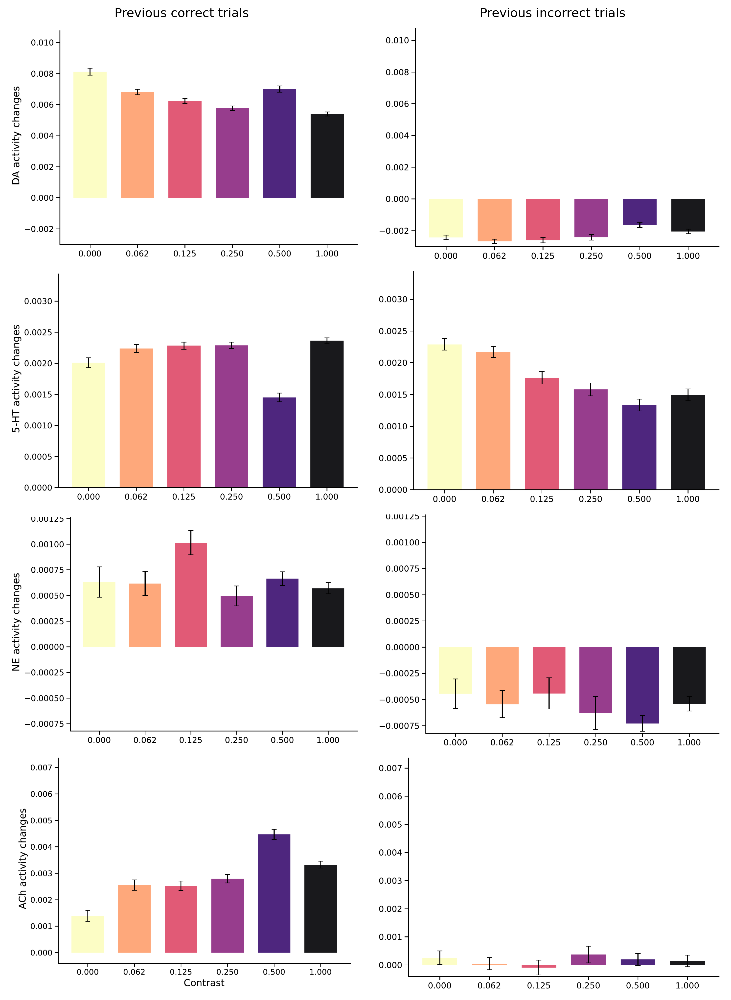

In [ ]:
""" new 18072025 """

import matplotlib.pyplot as plt
from pdf2image import convert_from_path
from PIL import Image
import os

def join_contrast_panels(figure_names, output_path, title_left, title_right):
    figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Contrasts/'

    fig, axes = plt.subplots(4, 2, figsize=(10, 14), dpi=300)
    axes = axes.flatten()

    crop_top = 90
    crop_bottom = 65
    crop_left = 63

    for i, figure_name in enumerate(figure_names):
        img_path = os.path.join(figure_path, figure_name)
        images = convert_from_path(img_path, first_page=1, last_page=1)
        img = images[0]
        width, height = img.size

        if i % 2 == 1:
            img_cropped = img.crop((crop_left, crop_top, width, height - crop_bottom))
        else:
            if i < 6:
                img_cropped = img.crop((0, crop_top, width, height - crop_bottom))
            else:
                img_cropped = img.crop((0, crop_top, width, height))

        axes[i].imshow(img_cropped)
        axes[i].axis('off')

    fig.subplots_adjust(top=0.92)
    fig.text(0.25, 0.95, title_left, ha='center', fontsize=12)
    fig.text(0.75, 0.95, title_right, ha='center', fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(output_path, format='pdf')
    plt.show()


stim_figures = [
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_stimOnTrigger_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_stimOnTrigger_times_Incorrect.pdf',
]

join_contrast_panels(
    figure_names=stim_figures,
    output_path='/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Panel_StimOn_Cropped_all.pdf',
    title_left='Future correct trials',
    title_right='Future incorrect trials'
)


feedback_figures = [
    'barplot_18072025_just_aligned_DA_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_DA_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_5-HT_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_5-HT_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_NE_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_NE_feedback_times_Incorrect.pdf',
    'barplot_18072025_just_aligned_ACh_feedback_times_Correct.pdf',
    'barplot_18072025_just_aligned_ACh_feedback_times_Incorrect.pdf',
]

join_contrast_panels(
    figure_names=feedback_figures,
    output_path='/home/kceniabougrova/Documents/Thesis_correction_figures/Final_Panel_Feedback_Cropped_all.pdf',
    title_left='Previous correct trials',
    title_right='Previous incorrect trials'
)




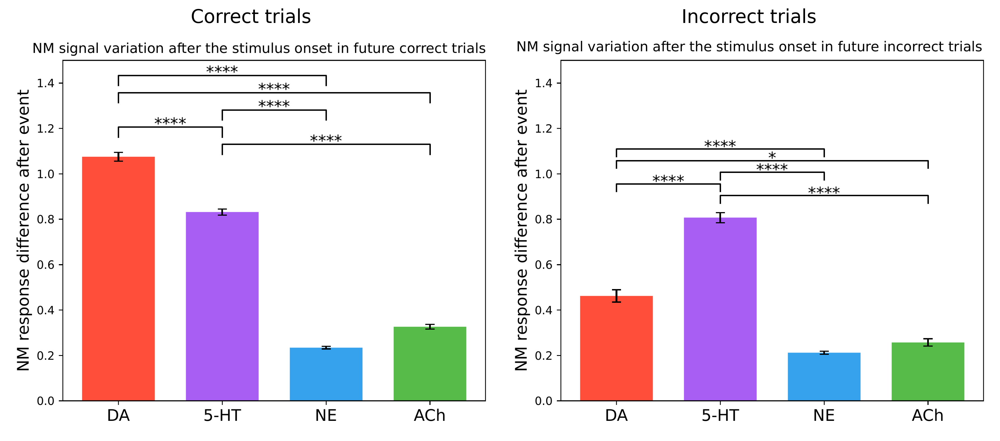

In [26]:
""" NMs stim """
import matplotlib.pyplot as plt
from pdf2image import convert_from_path
from PIL import Image

# Define the figure paths and names
figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/'

figure_names = [
    'barplot_stimOnTrigger_times_Correct_final.pdf',
    'barplot_stimOnTrigger_times_Incorrect_final.pdf'
]

# Convert PDFs to PIL images
images = [convert_from_path(figure_path + name, dpi=300)[0] for name in figure_names]

# Create matplotlib figure
fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=300)

# Add each image
for ax, img, title in zip(axes, images, ['Correct trials', 'Incorrect trials']):
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title, fontsize=16)

plt.tight_layout()

# Save combined figure
output_path = figure_path + 'Combined_barplots_stimOn_times2.pdf'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()

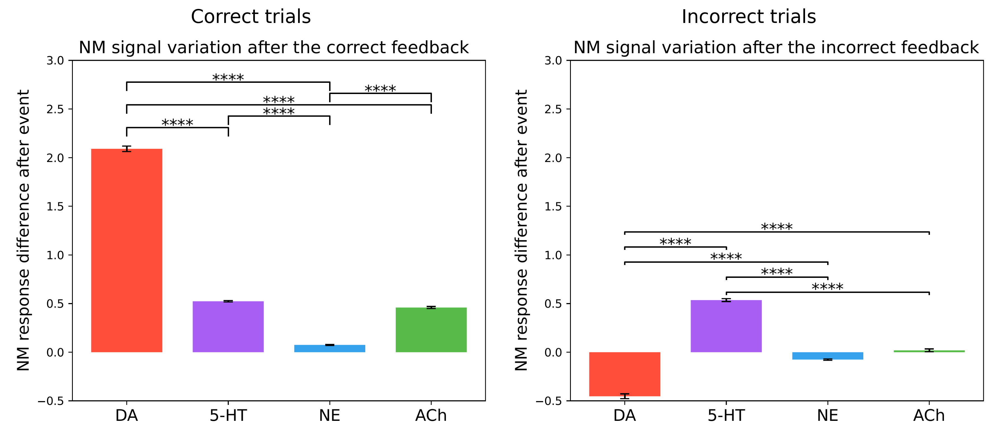

In [27]:
""" NMs feedback """ 
import matplotlib.pyplot as plt
from pdf2image import convert_from_path
from PIL import Image

# Define the figure paths and names
figure_path = '/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/'

figure_names = [
    'barplot_feedback_times_Correct_final.pdf',
    'barplot_feedback_times_Incorrect_final.pdf'
]

# Convert PDFs to PIL images
images = [convert_from_path(figure_path + name, dpi=300)[0] for name in figure_names]

# Create matplotlib figure
fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=300)

# Add each image
for ax, img, title in zip(axes, images, ['Correct trials', 'Incorrect trials']):
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title, fontsize=16)

plt.tight_layout()

# Save combined figure
output_path = figure_path + 'Combined_barplots_feedback_times2.pdf'
plt.savefig(output_path, dpi=300, bbox_inches='tight')
plt.show()


In [37]:
""" to not convert into image """
import fitz  # PyMuPDF

figure_path = "/home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/"

# Load the two PDFs
doc1 = fitz.open(figure_path + "barplot_feedback_times_Correct_final.pdf")
doc2 = fitz.open(figure_path + "barplot_feedback_times_Incorrect_final.pdf")

# Create new empty PDF
new_doc = fitz.open()

# Create new page large enough for both
width1, height1 = doc1[0].rect.width, doc1[0].rect.height
width2, height2 = doc2[0].rect.width, doc2[0].rect.height

new_width = width1 + width2
new_height = max(height1, height2)

new_page = new_doc.new_page(width=new_width, height=new_height)

# Insert first page on the left
new_page.show_pdf_page(fitz.Rect(0, 0, width1, height1), doc1, 0)

# Insert second page on the right
new_page.show_pdf_page(fitz.Rect(width1, 0, new_width, height2), doc2, 0)

# Save
output_path = figure_path + "Combined_barplots_feedback_times_side_by_side.pdf"
new_doc.save(output_path)

print(f"Combined PDF saved to {output_path}")



Combined PDF saved to /home/kceniabougrova/Documents/Thesis_correction_figures/Between_NMs/Combined_barplots_feedback_times_side_by_side.pdf


In [10]:
1+1

2